In [1]:
import cv2
import numpy as np
import glob


import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Import everything needed to edit/save/watch video clips
import imageio
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from IPython.display import HTML



%matplotlib inline

In [2]:
def calibrate_camera(objpoints, imgpoints, calibration_image):
    img_size = (img.shape[1], img.shape[0])
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    
    return (ret, mtx, dist, rvecs, tvecs)  

def undistort_image(image, mtx, dist):    
    undistorted_image = cv2.undistort(image, mtx, dist, None, mtx)
    return undistorted_image

def getWarpMatrixes():
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    return M, M_inv

def warp_perspective(undistored_image, M):
    img_size = (undistored_image.shape[1], undistored_image.shape[0])

    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undistored_image, M, img_size)

    # Return the resulting image and matrix
    return warped

def plot_two_images_side_by_side(image1, image2, title1, title2, cmap):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(image1, cmap))
    ax1.set_title(title1, fontsize=30)
    ax2.imshow(cv2.cvtColor(image2, cmap))
    ax2.set_title(title2, fontsize=30)
    
def plot_images_side_by_side(images, titles, cmaps):
    f, axis = plt.subplots(1, len(images), figsize=(20,10))
    for idx, ax in enumerate(axis):
        if cmaps[idx] == 'gray':
            axis[idx].imshow(images[idx], cmap='gray')
        else:
            axis[idx].imshow(images[idx])
        ax.set_title(titles[idx])
    
M, M_inv = getWarpMatrixes()

In [3]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

In [4]:
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)

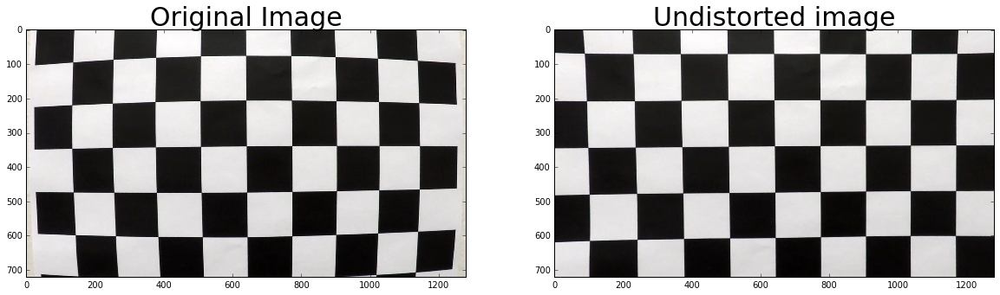

In [5]:
calib_image_name = 'camera_cal/calibration1.jpg'      
ret, mtx, dist, rvecs, tvecs = calibrate_camera(objpoints, imgpoints, calib_image_name)
img = cv2.imread(calib_image_name)
undistort_img = undistort_image(img, mtx, dist) 
plot_two_images_side_by_side(img, undistort_img, 'Original Image', 'Undistorted image', cv2.COLOR_BGR2RGB)

In [ ]:
images = glob.glob('test_images/test*.jpg')
for idx, fname in enumerate(images):
    image = cv2.imread(fname)
    undistorted_image = undistort_image(image, mtx, dist)
    plot_two_images_side_by_side(image, undistorted_image, 'Original Image', 'Undistorted image', cv2.COLOR_BGR2RGB)

In [ ]:
calib_image_name = 'test_images/straight_lines1.jpg'
image = cv2.imread(calib_image_name)
undistort_img = undistort_image(image, mtx, dist)
warped_image = warp_perspective(undistort_img, M)
plot_two_images_side_by_side(image, warped_image, 'Original Image', 'Warped image', cv2.COLOR_BGR2RGB)

In [ ]:
images = glob.glob('test_images/*.jpg')
for idx, fname in enumerate(images):
    image = cv2.imread(fname)
    undistorted_image = undistort_image(image, mtx, dist)
    warped_image = warp_perspective(undistorted_image, M)
    plot_two_images_side_by_side(image, warped_image, 'Original Image', 'Warped image', cv2.COLOR_BGR2RGB)

In [340]:
def sobelx_threshold(img, thresh_min = 20, thresh_max = 100):
    if len(img.shape) > 2:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img
    #gray = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 115, 1)
    
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sxbinary

def sobely_threshold(img, thresh_min = 20, thresh_max = 100):
    if len(img.shape) > 2:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img
    #gray = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 115, 1)

    # Sobel y
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # Take the derivative in y
    abs_sobely = np.absolute(sobely) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))

    # Threshold x gradient
    sybinary = np.zeros_like(scaled_sobel)
    sybinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sybinary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def l_threshold(img, thresh_min = 128, thresh_max = 255):
    luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    l_channel = luv[:,:,0]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= thresh_min) & (l_channel <= thresh_max)]  = 1
    return l_binary

def b_threshold(img, thresh_min = 128, thresh_max = 255):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    
    b_channel = lab[:,:,2]
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= thresh_min) & (b_channel <= thresh_max)]  = 1
    
    return b_binary

def s_threshold(img, thresh_min = 128, thresh_max = 255):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= thresh_min) & (s_channel <= thresh_max)]  = 1
    
    return b_binary

def yc_threshold(img, thresh_min = 128, thresh_max = 255):
    ycbcr = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)
    
    yc_channel = ycbcr[:,:,0]
    yc_binary = np.zeros_like(yc_channel)
    yc_binary[(yc_channel >= thresh_min) & (yc_channel <= thresh_max)]  = 1
    return yc_binary

def sharpen_img(img):
    gb = cv2.GaussianBlur(img, (5,5), 20.0)
    return cv2.addWeighted(img, 2, gb, -1, 0)

def apply_clahe(img):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))    
    img[:,:,0] = clahe.apply(image[:,:,0])
    img[:,:,1] = clahe.apply(image[:,:,1])
    img[:,:,2] = clahe.apply(image[:,:,2])
    return img

def apply_all_thresholds(image):
    img = np.copy(image)
    img = sharpen_img(img)
    #sx_binary = sobelx_threshold(img, 20, 100)
    sx_binary = np.zeros_like(image[:,:,0])
    #sy_binary = sobely_threshold(img, 40, 100)
    #sx_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(40, 100))
    b_binary = b_threshold(img, 150, 255)
    
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
#     hsv = apply_clahe(hsv)
#     hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
#     hls = apply_clahe(hls)
#     #yellow = cv2.inRange(hsv, (20, 80, 80), (25, 255, 255))
    sensitivity = 95
    lower_white = np.array([0,0,255-sensitivity])
    upper_white = np.array([255,sensitivity,255])
    white = cv2.inRange(hsv, lower_white, upper_white)
    sx_binary[(white >= 1)] = 1
    #print(sx_binary.shape)
#     sx_binary = sobelx_threshold(sx_binary, 20, 100)
#     sy_binary = sobely_threshold(img, 40, 100)
#     print(white.shape)
#     sensitivity_1 = 50
#     white = cv2.inRange(hsv, (0, 0, 255 - sensitivity_1), (255, 20, 255))
#     sensitivity_2 = 35
#     white_2 = cv2.inRange(hls, (0, 255 - sensitivity_2, 0), (255, 255, sensitivity_2))
#     white_3 = cv2.inRange(img, (200, 200, 200), (255, 255, 255))
#     sx_binary[(white >= 1) | (white_2>=1) | (white_3 >=1)] = 1
    #sx_binary = b_threshold(img, 190, 255)
    
    yc_binary = yc_threshold(img, 210, 255)
  
    combined_binary_int = np.zeros_like(sx_binary)
    combined_binary_int[(sx_binary == 1) | (b_binary == 1) | (yc_binary == 1)] = 1
    
    sx_binary = sobelx_threshold(combined_binary_int, 20, 100)
    sy_binary = sobely_threshold(combined_binary_int, 40, 100)
    
    combined_binary = np.zeros_like(sx_binary)
    combined_binary[(sx_binary == 1) | (sy_binary == 1) | (b_binary == 1) | (yc_binary == 1)] = 1
    #combined_binary[(sx_binary == 1) | (sy_binary == 1)] = 1
    
    return combined_binary, sx_binary, sy_binary, b_binary, yc_binary

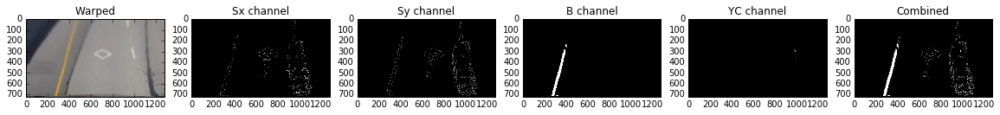

In [341]:
#calib_image_name = 'test_images/straight_lines1.jpg'
calib_image_name = 'test_images/snapshot.jpg'
image = cv2.imread(calib_image_name)
undistort_img = undistort_image(image, mtx, dist)
warped_image = warp_perspective(undistort_img, M)

combined_binary, sx_binary, sy_binary, b_binary, yc_binary = apply_all_thresholds(warped_image)
#combined_binary = (combined_binary.copy() * 255).astype('uint8')

images=[cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB), sx_binary, sy_binary, b_binary, yc_binary, combined_binary]
titles = ['Warped', 'Sx channel', 'Sy channel', 'B channel', 'YC channel', 'Combined']
cmaps = [cv2.COLOR_BGR2RGB, 'gray', 'gray', 'gray', 'gray', 'gray']
plot_images_side_by_side(images, titles, cmaps)


    

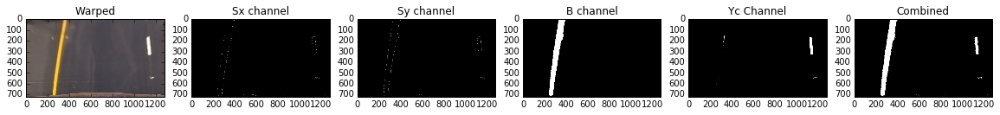

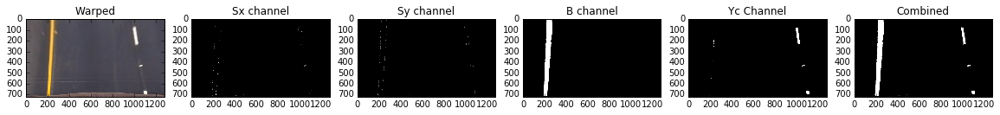

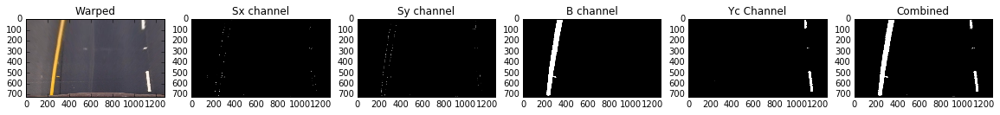

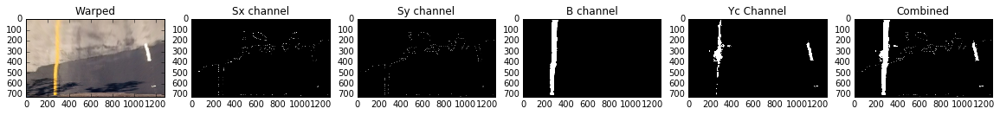

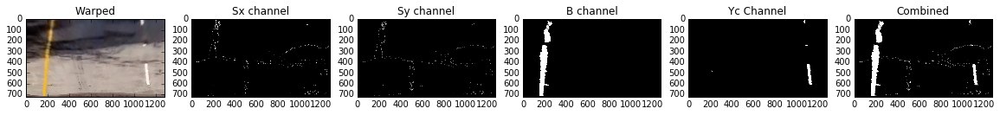

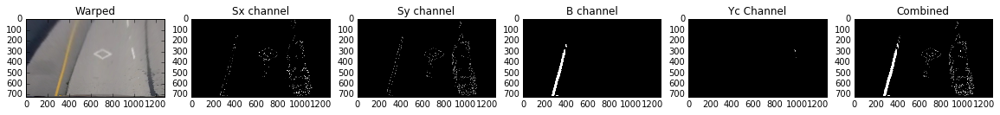

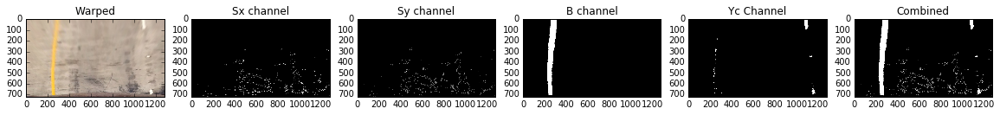

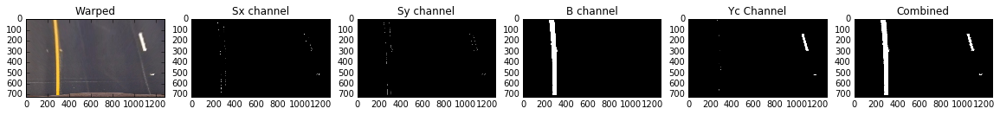

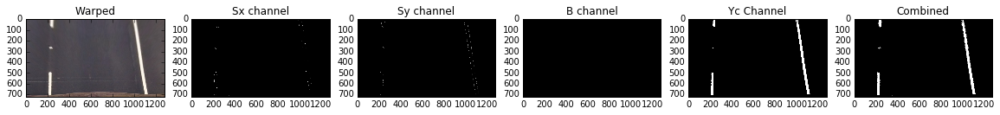

In [342]:
images = glob.glob('test_images/*.jpg')
images_plot = []
titles = ['Warped', 'Sx channel', 'Sy channel', 'B channel', 'Yc Channel', 'Combined']
cmaps = [cv2.COLOR_BGR2RGB, 'gray', 'gray', 'gray', 'gray', 'gray']
for idx, fname in enumerate(images):
    image = cv2.imread(fname)
    undistorted_image = undistort_image(image, mtx, dist)
    warped_image = warp_perspective(undistorted_image, M) 
    combined_binary, sx_binary, sy_binary, b_binary, yc_binary = apply_all_thresholds(warped_image)  
    images_plot=[cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB), sx_binary, sy_binary, b_binary, yc_binary, combined_binary]
    plot_images_side_by_side(images_plot, titles, cmaps)

In [ ]:
print(combined_binary.shape)

In [343]:
def find_line(image):
    undistort_img = undistort_image(image, mtx, dist)
    warped_image = warp_perspective(undistort_img, M)

    combined_binary, sx_binary, sy_binary, b_binary, yc_binary = apply_all_thresholds(warped_image)
    binary_warped = np.copy(combined_binary)
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 12
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 50
    # Set minimum number of pixels found to recenter window
    minpix = 100
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    right_bottom_x = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    left_bottom_x = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    center = 640 - ((right_bottom_x+left_bottom_x)/2)   
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = np.max(righty)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(righty) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    #cv2.polylines(warped_image, np.int_([pts]), isClosed=False, color=(255,0,0), thickness = 40)
    cv2.fillPoly(warped_image, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(warped_image, M_inv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result2 = cv2.addWeighted(undistort_img, 1, newwarp, 0.3, 0)
    #plt.imshow(result)
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(20, 6))
    ax1.imshow(result)
    ax1.plot(left_fitx, ploty, color='cyan', linewidth=3)
    ax1.plot(right_fitx, ploty, color='cyan', linewidth=3)
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(720, 0)
    ax2.imshow(cv2.cvtColor(result2, cv2.COLOR_BGR2RGB))
    ax2.text(200, 100, 'Vehicle is {:.2f}m of center'.format(center*3.7/700), fontweight='bold' , color='white', fontsize=10)
    ax2.text(200, 175, 'Radius of curvature is {}m'.format(int((left_curverad + right_curverad)/2)), fontweight='bold' , color='white', fontsize=10)

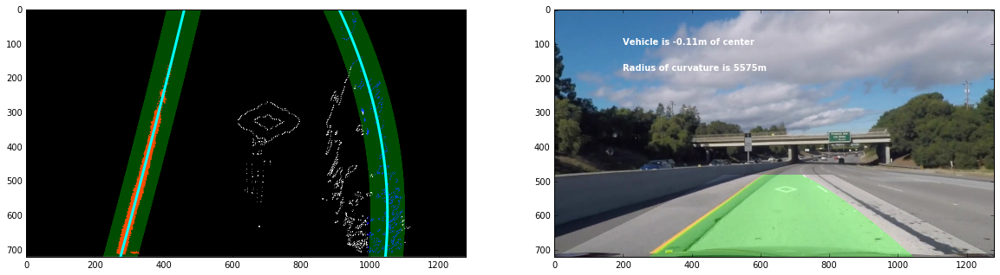

In [344]:
#calib_image_name = 'test_images/test1.jpg'
calib_image_name = 'test_images/snapshot.jpg'
image = cv2.imread(calib_image_name)
find_line(image)
#plot_line_points_on_image(binary_warped, left_lane_inds, right_lane_inds)

In [ ]:
images = glob.glob('test_images/test*.jpg')

for idx, fname in enumerate(images):
    image = cv2.imread(fname)
    find_line(image)

In [382]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = []
        
        self.recent_fits = []
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        self.n = 10
        
    def fast_search(self, xbase, binary_warped):
        # Assume you now have a new warped binary image 
        # from the next frame of video (also called "binary_warped")
        # It's now much easier to find line pixels!
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        left_lane_inds = ((nonzerox > (self.current_fit[0]*(nonzeroy**2) + self.current_fit[1]*nonzeroy + self.current_fit[2] - margin)) & (nonzerox < (self.current_fit[0]*(nonzeroy**2) + self.current_fit[1]*nonzeroy + self.current_fit[2] + margin))) 
       
    
        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 

        
        if not(len(leftx) > 0 or len(lefty) > 0):
            print("Bad")
            self.detected = False
        
        return leftx, lefty
            

    
    def blind_search(self, xbase, binary_warped):
        print("blind")
        # Choose the number of sliding windows
        nwindows = 12
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]//nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = xbase
        # Set the width of the windows +/- margin
        margin = 50
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin

            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 

        if not(len(leftx) > 0 or len(lefty) > 0):
            print("Bad")
            self.detected = False
        else:
            self.detected = True
        return leftx, lefty
        

        
        #left_fit_np = np.array(left_fit_g)

        ##if len(left_fit_g) > n:
        #    left_fit = np.mean(left_fit_np[-n:, :], axis=0)

        
        


In [393]:
# Processing pipeline for videos
def process_video(image_clip):
    image_clip = cv2.cvtColor(image_clip, cv2.COLOR_RGB2BGR)
    undistorted_img = undistort_image(image_clip, mtx, dist)
    warped_image = warp_perspective(undistorted_img, M)
    combined_binary, sx_binary, sy_binary, b_binary, yc_binary = apply_all_thresholds(warped_image)
    binary_warped = np.copy(combined_binary)
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    if Right.detected: # Perform blind search for right lane lines
        
        rightx, righty = Right.fast_search(rightx_base, binary_warped)
    else:
        rightx, righty = Right.blind_search(rightx_base, binary_warped)

    if Left.detected:# Perform blind search for left lane lines
        
        leftx, lefty = Left.fast_search(leftx_base, binary_warped)
    else:
        leftx, lefty = Left.blind_search(leftx_base, binary_warped)

    # Generate x and y values for plotting
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    if not Left.detected or not Right.detected:
        left_fit = Left.best_fit
        leftx = Left.allx
        lefty = Left.ally
        
        right_fit = Right.best_fit
        rightx = Right.allx
        righty = Right.ally
    else:
        print(len(lefty))
        print(len(leftx))
        left_fit = np.polyfit(lefty, leftx, 2)
        Left.current_fit = left_fit
        Left.recent_fits.extend([leftx, lefty])
        Left.allx = leftx
        Left.ally = lefty
        if len(Left.recent_fits) > 5:
            Left.recent_fits.pop(0)  
            #leftx,lefty =  np.array(np.nanmean(Left.recent_fits))
        
        right_fit = np.polyfit(righty, rightx, 2)
        Right.current_fit = right_fit
        Right.allx = rightx
        Right.ally = righty
        Right.recent_fits.extend([leftx, lefty])
        if len(Right.recent_fits) > 5:
            Right.recent_fits.pop(0)
    
    
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if left_fit is not None and right_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        r_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        #print("dist {0}".format(x_int_diff))
        if abs(900 - x_int_diff) > 150:
            print("dist {0}".format(abs(550 - x_int_diff)))
#             if Left.best_fit is not None:
            left_fit = Left.best_fit
#             if Right.best_fit is not None:
            right_fit = Right.best_fit
    
    Left.recent_xfitted.append(left_fit)
    if len(Left.recent_fits) > Left.n:
        Left.recent_fits.pop(0)
        #print(Left.recent_xfitted)
        left_fit = np.array(np.nanmean(Left.recent_xfitted, axis =0))
        Left.best_fit = left_fit
        
    Right.recent_xfitted.append(right_fit)
    if len(Right.recent_fits) > Left.n:
        Right.recent_fits.pop(0)
        right_fit = np.array(np.nanmean(Right.recent_xfitted, axis =0))
        Right.best_fit = right_fit
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    #cv2.polylines(warped_image, np.int_([pts]), isClosed=False, color=(255,0,0), thickness = 40)
    cv2.fillPoly(warped_image, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(warped_image, M_inv, (image_clip.shape[1], image_clip.shape[0])) 
    # Combine the result with the original image
    result2 = cv2.addWeighted(image_clip, 1, newwarp, 0.3, 0)
    
    right_bottom_x = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    left_bottom_x = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    center = 640 - ((right_bottom_x+left_bottom_x)/2)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = np.max(righty)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(righty) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    
    cv2.putText(result2, 'Vehicle is {:.2f}m of center'.format(center*3.7/700), (100,80), fontFace = cv2.FONT_HERSHEY_SIMPLEX, fontScale = 1, color=(255,255,255), thickness = 2)
    cv2.putText(result2, 'Radius of curvature is {}m'.format(int((left_curverad + right_curverad)/2)), (100,150), fontFace = cv2.FONT_HERSHEY_SIMPLEX, fontScale = 1, color=(255,255,255), thickness = 2)

    
    final = cv2.cvtColor(result2, cv2.COLOR_BGR2RGB)
    return final
    

In [314]:
Left = Line()
Right = Line()
video_outputx = './result.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(0,10)
#clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_video) 
white_clip.write_videofile(video_outputx, audio=False)



blind
blind
dist 860.7721189716136
[MoviePy] >>>> Building video ./result.mp4
[MoviePy] Writing video ./result.mp4


  0%|          | 0/251 [00:00<?, ?it/s]

dist 872.600272011921


  1%|          | 2/251 [00:00<00:35,  7.06it/s]

dist 883.1052135778518


  1%|          | 3/251 [00:00<00:33,  7.41it/s]

dist 892.4165174331347


  2%|▏         | 4/251 [00:00<00:32,  7.65it/s]

dist 898.0217269433617


  2%|▏         | 5/251 [00:00<00:31,  7.80it/s]

dist 903.3715842582253


  2%|▏         | 6/251 [00:00<00:31,  7.89it/s]

dist 900.5628362122156


  3%|▎         | 7/251 [00:00<00:30,  7.94it/s]

dist 898.1238626841346


  3%|▎         | 8/251 [00:01<00:30,  8.04it/s]

dist 891.7213828764894


  4%|▎         | 9/251 [00:01<00:29,  8.11it/s]

dist 888.2676401481503


  4%|▍         | 10/251 [00:01<00:29,  8.17it/s]

dist 890.4653921965325


  4%|▍         | 11/251 [00:01<00:28,  8.29it/s]

dist 878.2684700563537


  5%|▍         | 12/251 [00:01<00:28,  8.30it/s]

dist 884.443506277743


  5%|▌         | 13/251 [00:01<00:28,  8.22it/s]

dist 886.4520439866858


  6%|▌         | 14/251 [00:01<00:28,  8.24it/s]

dist 892.5571067658968


  6%|▌         | 15/251 [00:01<00:28,  8.19it/s]

dist 891.9289283124383


  6%|▋         | 16/251 [00:01<00:28,  8.17it/s]

dist 885.7330958828184


  7%|▋         | 17/251 [00:02<00:28,  8.23it/s]

dist 889.87187550417


  7%|▋         | 18/251 [00:02<00:28,  8.24it/s]

dist 891.5498167390097


  8%|▊         | 19/251 [00:02<00:28,  8.22it/s]

dist 891.8919386382398


  8%|▊         | 20/251 [00:02<00:28,  8.23it/s]

dist 889.7800135302693


  8%|▊         | 21/251 [00:02<00:28,  8.21it/s]

dist 893.7143045912401


  9%|▉         | 22/251 [00:02<00:27,  8.22it/s]

dist 892.6772836021652


  9%|▉         | 23/251 [00:02<00:27,  8.16it/s]

dist 890.0270782776548


 10%|▉         | 24/251 [00:02<00:27,  8.15it/s]

dist 887.8076176872194


 10%|▉         | 25/251 [00:03<00:27,  8.17it/s]

dist 881.2511761086839


 10%|█         | 26/251 [00:03<00:27,  8.19it/s]

dist 883.2897505347389


 11%|█         | 27/251 [00:03<00:27,  8.21it/s]

dist 887.8880496384076


 11%|█         | 28/251 [00:03<00:27,  8.23it/s]

dist 897.3278793461627


 12%|█▏        | 29/251 [00:03<00:27,  8.18it/s]

dist 901.3758210634885


 12%|█▏        | 30/251 [00:03<00:26,  8.26it/s]

dist 907.4806782524897


 12%|█▏        | 31/251 [00:03<00:26,  8.23it/s]

dist 910.7069673686946


 13%|█▎        | 32/251 [00:03<00:26,  8.22it/s]

dist 908.6811373552193


 13%|█▎        | 33/251 [00:04<00:26,  8.25it/s]

dist 904.7987970959675


 14%|█▎        | 34/251 [00:04<00:26,  8.26it/s]

dist 908.5416105630862


 14%|█▍        | 35/251 [00:04<00:25,  8.31it/s]

dist 912.8927768365387


 14%|█▍        | 36/251 [00:04<00:25,  8.29it/s]

dist 910.9254575541974


 15%|█▍        | 37/251 [00:04<00:25,  8.27it/s]

dist 898.6671435051533


 15%|█▌        | 38/251 [00:04<00:26,  8.17it/s]

dist 902.91471825923


 16%|█▌        | 39/251 [00:04<00:25,  8.19it/s]

dist 899.4917177246002


 16%|█▌        | 40/251 [00:04<00:25,  8.22it/s]

dist 898.3161050677716


 16%|█▋        | 41/251 [00:05<00:25,  8.22it/s]

dist 896.0018576097968


 17%|█▋        | 42/251 [00:05<00:25,  8.22it/s]

dist 894.2467114695595


 17%|█▋        | 43/251 [00:05<00:26,  7.72it/s]

dist 899.1669735374766


 18%|█▊        | 44/251 [00:05<00:27,  7.53it/s]

dist 900.3865085608713


 18%|█▊        | 45/251 [00:05<00:26,  7.68it/s]

dist 902.2358247584934


 18%|█▊        | 46/251 [00:05<00:26,  7.84it/s]

dist 901.499771850351


 19%|█▊        | 47/251 [00:05<00:25,  7.93it/s]

dist 903.9793936710022


 19%|█▉        | 48/251 [00:05<00:25,  7.83it/s]

dist 901.7450792605797


 20%|█▉        | 49/251 [00:06<00:26,  7.60it/s]

dist 896.2351959921953


 20%|█▉        | 50/251 [00:06<00:26,  7.55it/s]

dist 892.0556208570789


 20%|██        | 51/251 [00:06<00:26,  7.49it/s]

dist 890.5376219651024


 21%|██        | 52/251 [00:06<00:27,  7.35it/s]

dist 893.8753133377974


 21%|██        | 53/251 [00:06<00:26,  7.35it/s]

dist 894.6950712571526


 22%|██▏       | 54/251 [00:06<00:27,  7.17it/s]

dist 891.4535533316805


 22%|██▏       | 55/251 [00:06<00:26,  7.29it/s]

dist 893.5549747965463


 22%|██▏       | 56/251 [00:07<00:26,  7.40it/s]

dist 894.1639066226642


 23%|██▎       | 57/251 [00:07<00:26,  7.46it/s]

dist 895.0300013549077


 23%|██▎       | 58/251 [00:07<00:26,  7.33it/s]

dist 889.4821324145582


 24%|██▎       | 59/251 [00:07<00:25,  7.49it/s]

dist 893.389588825466


 24%|██▍       | 60/251 [00:07<00:25,  7.62it/s]

dist 895.9716280558896


 24%|██▍       | 61/251 [00:07<00:24,  7.72it/s]

dist 895.4625491015943


 25%|██▍       | 62/251 [00:07<00:25,  7.44it/s]

dist 883.7128412308957


 25%|██▌       | 63/251 [00:07<00:26,  7.22it/s]

dist 888.6061224636206


 25%|██▌       | 64/251 [00:08<00:25,  7.21it/s]

dist 892.6781909312556


 26%|██▌       | 65/251 [00:08<00:24,  7.45it/s]

dist 890.3516184169102


 26%|██▋       | 66/251 [00:08<00:24,  7.50it/s]

dist 889.9403830299102


 27%|██▋       | 67/251 [00:08<00:24,  7.49it/s]

dist 889.6406556740776


 27%|██▋       | 68/251 [00:08<00:24,  7.47it/s]

dist 897.0618575811284


 27%|██▋       | 69/251 [00:08<00:24,  7.57it/s]

dist 894.8902236592492


 28%|██▊       | 70/251 [00:08<00:23,  7.58it/s]

dist 896.503832328974


 28%|██▊       | 71/251 [00:09<00:24,  7.33it/s]

dist 903.2264935317993


 29%|██▊       | 72/251 [00:09<00:24,  7.37it/s]

dist 910.811233763636


 29%|██▉       | 73/251 [00:09<00:23,  7.49it/s]

dist 911.8653436570615


 29%|██▉       | 74/251 [00:09<00:24,  7.26it/s]

dist 898.3245869454981


 30%|██▉       | 75/251 [00:09<00:23,  7.47it/s]

dist 893.4458503538557


 30%|███       | 76/251 [00:09<00:24,  7.15it/s]

dist 891.7589215693702


 31%|███       | 77/251 [00:09<00:25,  6.84it/s]

dist 892.8536071323811


 31%|███       | 78/251 [00:10<00:24,  7.10it/s]

dist 891.9040803194183


 31%|███▏      | 79/251 [00:10<00:24,  7.12it/s]

dist 891.330130803336


 32%|███▏      | 80/251 [00:10<00:23,  7.14it/s]

dist 894.807795439838


 32%|███▏      | 81/251 [00:10<00:24,  7.02it/s]

dist 896.3705458929587


 33%|███▎      | 82/251 [00:10<00:24,  7.02it/s]

dist 897.7955850921628


 33%|███▎      | 83/251 [00:10<00:24,  6.77it/s]

dist 899.506223851871


 33%|███▎      | 84/251 [00:10<00:24,  6.95it/s]

dist 907.5011028424275


 34%|███▍      | 85/251 [00:11<00:23,  7.16it/s]

dist 910.1354136879198


 34%|███▍      | 86/251 [00:11<00:23,  7.13it/s]

dist 909.9934954790633


 35%|███▍      | 87/251 [00:11<00:22,  7.33it/s]

dist 896.9984328183582


 35%|███▌      | 88/251 [00:11<00:22,  7.27it/s]

dist 901.3741722357281


 35%|███▌      | 89/251 [00:11<00:21,  7.43it/s]

dist 904.3722465243516


 36%|███▌      | 90/251 [00:11<00:21,  7.36it/s]

dist 901.0152730920895


 36%|███▋      | 91/251 [00:11<00:21,  7.28it/s]

dist 902.359405249219


 37%|███▋      | 92/251 [00:11<00:21,  7.26it/s]

dist 899.3983018017794


 37%|███▋      | 93/251 [00:12<00:22,  7.09it/s]

dist 904.8187722490163


 37%|███▋      | 94/251 [00:12<00:22,  7.08it/s]

dist 905.8519180062799


 38%|███▊      | 95/251 [00:12<00:22,  7.05it/s]

dist 905.4454133415331


 38%|███▊      | 96/251 [00:12<00:21,  7.19it/s]

dist 905.5568771780131


 39%|███▊      | 97/251 [00:12<00:21,  7.26it/s]

dist 906.4187890497144


 39%|███▉      | 98/251 [00:12<00:20,  7.34it/s]

dist 906.9906862393527


 39%|███▉      | 99/251 [00:12<00:20,  7.43it/s]

dist 906.5884502345865


 40%|███▉      | 100/251 [00:13<00:20,  7.31it/s]

dist 897.3754320932449


 40%|████      | 101/251 [00:13<00:20,  7.34it/s]

dist 901.1423734444745


 41%|████      | 102/251 [00:13<00:20,  7.40it/s]

dist 902.0590349937004


 41%|████      | 103/251 [00:13<00:20,  7.24it/s]

dist 900.2526932967448


 41%|████▏     | 104/251 [00:13<00:19,  7.43it/s]

dist 883.6337278462174


 42%|████▏     | 105/251 [00:13<00:20,  7.25it/s]

dist 883.7686671400213


 42%|████▏     | 106/251 [00:13<00:19,  7.34it/s]

dist 886.1443333483562


 43%|████▎     | 107/251 [00:14<00:19,  7.43it/s]

dist 891.0439427490687


 43%|████▎     | 108/251 [00:14<00:19,  7.50it/s]

dist 886.9185338964606


 43%|████▎     | 109/251 [00:14<00:18,  7.49it/s]

dist 894.9269023554671


 44%|████▍     | 110/251 [00:14<00:18,  7.64it/s]

dist 902.5756394009942


 44%|████▍     | 111/251 [00:14<00:19,  7.37it/s]

dist 915.9959447645317


 45%|████▍     | 112/251 [00:14<00:18,  7.45it/s]

dist 914.7101348719993


 45%|████▌     | 113/251 [00:14<00:18,  7.47it/s]

dist 901.173519155933


 45%|████▌     | 114/251 [00:14<00:18,  7.57it/s]

dist 908.3348938242541


 46%|████▌     | 115/251 [00:15<00:18,  7.39it/s]

dist 916.3503098587505


 46%|████▌     | 116/251 [00:15<00:18,  7.30it/s]

dist 911.7425189154729


 47%|████▋     | 117/251 [00:15<00:18,  7.36it/s]

dist 901.3810917096581


 47%|████▋     | 118/251 [00:15<00:17,  7.52it/s]

dist 899.1966574911679


 47%|████▋     | 119/251 [00:15<00:18,  7.26it/s]

dist 899.0005001925649


 48%|████▊     | 120/251 [00:15<00:17,  7.41it/s]

dist 897.725746617037


 48%|████▊     | 121/251 [00:15<00:18,  7.14it/s]

dist 895.0185115814487


 49%|████▊     | 122/251 [00:16<00:17,  7.31it/s]

dist 896.6293712744615


 49%|████▉     | 123/251 [00:16<00:17,  7.20it/s]

dist 895.1225480816341


 49%|████▉     | 124/251 [00:16<00:17,  7.14it/s]

dist 883.7217953090678


 50%|████▉     | 125/251 [00:16<00:17,  7.28it/s]

dist 871.5724351098304


 50%|█████     | 126/251 [00:16<00:17,  7.26it/s]

dist 875.3634780774927


 51%|█████     | 127/251 [00:16<00:16,  7.42it/s]

dist 880.450783653451


 51%|█████     | 128/251 [00:16<00:17,  7.20it/s]

dist 881.3760962486044


 51%|█████▏    | 129/251 [00:17<00:17,  7.05it/s]

dist 882.3191939443997


 52%|█████▏    | 130/251 [00:17<00:16,  7.29it/s]

dist 885.9596318211471


 52%|█████▏    | 131/251 [00:17<00:17,  6.93it/s]

dist 886.5359903007895


 53%|█████▎    | 132/251 [00:17<00:16,  7.18it/s]

dist 884.7314554808916


 53%|█████▎    | 133/251 [00:17<00:17,  6.92it/s]

dist 879.9999743746337


 53%|█████▎    | 134/251 [00:17<00:17,  6.87it/s]

dist 881.8515875976805


 54%|█████▍    | 135/251 [00:17<00:16,  7.12it/s]

dist 881.3956495429823


 54%|█████▍    | 136/251 [00:18<00:15,  7.41it/s]

dist 881.3124954004436


 55%|█████▍    | 137/251 [00:18<00:15,  7.30it/s]

dist 871.7740178036022


 55%|█████▍    | 138/251 [00:18<00:15,  7.44it/s]

dist 869.9637371938579


 55%|█████▌    | 139/251 [00:18<00:15,  7.03it/s]

dist 870.9804676969591


 56%|█████▌    | 140/251 [00:18<00:15,  7.12it/s]

dist 870.1740148332119


 56%|█████▌    | 141/251 [00:18<00:15,  7.00it/s]

dist 872.9652486904818


 57%|█████▋    | 142/251 [00:18<00:15,  7.17it/s]

dist 881.8806678233905


 57%|█████▋    | 143/251 [00:18<00:14,  7.36it/s]

dist 889.586412610922


 57%|█████▋    | 144/251 [00:19<00:14,  7.35it/s]

dist 891.3431427347539


 58%|█████▊    | 145/251 [00:19<00:14,  7.28it/s]

dist 893.8402831319927


 58%|█████▊    | 146/251 [00:19<00:14,  7.26it/s]

dist 887.0617453688858


 59%|█████▊    | 147/251 [00:19<00:14,  7.09it/s]

dist 890.2512497045366


 59%|█████▉    | 148/251 [00:19<00:14,  7.12it/s]

dist 894.545486639805


 59%|█████▉    | 149/251 [00:19<00:14,  7.06it/s]

dist 892.2117781363559


 60%|█████▉    | 150/251 [00:19<00:14,  7.07it/s]

dist 886.4493332036542


 60%|██████    | 151/251 [00:20<00:13,  7.19it/s]

dist 885.9984674554292


 61%|██████    | 152/251 [00:20<00:13,  7.38it/s]

dist 886.8252307875229


 61%|██████    | 153/251 [00:20<00:14,  6.96it/s]

dist 888.4335975323088


 61%|██████▏   | 154/251 [00:20<00:13,  7.21it/s]

dist 888.6722686321953


 62%|██████▏   | 155/251 [00:20<00:13,  7.23it/s]

dist 893.9299913587477


 62%|██████▏   | 156/251 [00:20<00:13,  7.26it/s]

dist 893.9364102084605


 63%|██████▎   | 157/251 [00:20<00:13,  7.22it/s]

dist 893.6974486198307


 63%|██████▎   | 158/251 [00:21<00:12,  7.38it/s]

dist 890.6049900215637


 63%|██████▎   | 159/251 [00:21<00:12,  7.43it/s]

dist 895.4037306187914


 64%|██████▎   | 160/251 [00:21<00:12,  7.20it/s]

dist 906.0795067824151


 64%|██████▍   | 161/251 [00:21<00:12,  7.14it/s]

dist 915.7367828918353


 65%|██████▍   | 162/251 [00:21<00:12,  7.22it/s]

dist 918.0133312103303


 65%|██████▍   | 163/251 [00:21<00:12,  7.27it/s]

dist 907.7938012404741


 65%|██████▌   | 164/251 [00:21<00:11,  7.32it/s]

dist 915.9327657216157


 66%|██████▌   | 165/251 [00:22<00:11,  7.28it/s]

dist 918.2188540401554


 66%|██████▌   | 166/251 [00:22<00:12,  7.06it/s]

dist 920.9134454873761


 67%|██████▋   | 167/251 [00:22<00:11,  7.16it/s]

dist 915.4536595336997


 67%|██████▋   | 168/251 [00:22<00:11,  7.09it/s]

dist 915.089544325549


 67%|██████▋   | 169/251 [00:22<00:11,  7.27it/s]

dist 918.229329220485


 68%|██████▊   | 170/251 [00:22<00:11,  7.25it/s]

dist 923.2316822818833


 68%|██████▊   | 171/251 [00:22<00:11,  7.21it/s]

dist 923.0914211076388


 69%|██████▊   | 172/251 [00:23<00:11,  6.86it/s]

dist 939.0029481729882


 69%|██████▉   | 173/251 [00:23<00:10,  7.11it/s]

dist 944.1071787233616


 69%|██████▉   | 174/251 [00:23<00:10,  7.12it/s]

dist 932.9071431042153


 70%|██████▉   | 175/251 [00:23<00:10,  7.13it/s]

dist 922.5475321242906


 70%|███████   | 176/251 [00:23<00:10,  7.14it/s]

dist 929.0127043375911


 71%|███████   | 177/251 [00:23<00:10,  7.12it/s]

dist 934.7830140997345


 71%|███████   | 178/251 [00:23<00:10,  6.89it/s]

dist 930.2116153394741


 71%|███████▏  | 179/251 [00:24<00:10,  6.86it/s]

dist 919.5721636476669


 72%|███████▏  | 180/251 [00:24<00:10,  6.82it/s]

dist 912.0938895478857


 72%|███████▏  | 181/251 [00:24<00:09,  7.06it/s]

dist 914.4120147491124


 73%|███████▎  | 182/251 [00:24<00:10,  6.89it/s]

dist 920.5886614179133


 73%|███████▎  | 183/251 [00:24<00:09,  7.21it/s]

dist 924.2921718925113


 73%|███████▎  | 184/251 [00:24<00:09,  7.14it/s]

dist 938.272575601359


 74%|███████▎  | 185/251 [00:24<00:09,  7.26it/s]

dist 947.9525837711974


 74%|███████▍  | 186/251 [00:25<00:09,  7.21it/s]

dist 952.5962477757955


 75%|███████▍  | 187/251 [00:25<00:08,  7.33it/s]

dist 943.6455849056491


 75%|███████▍  | 188/251 [00:25<00:08,  7.04it/s]

dist 947.0374559570662


 75%|███████▌  | 189/251 [00:25<00:08,  7.06it/s]

dist 952.4636869614332


 76%|███████▌  | 190/251 [00:25<00:08,  7.31it/s]

dist 946.5577770091122


 76%|███████▌  | 191/251 [00:25<00:08,  7.26it/s]

dist 933.363561003997


 76%|███████▋  | 192/251 [00:25<00:08,  7.04it/s]

dist 925.8070318818594


 77%|███████▋  | 193/251 [00:25<00:08,  7.15it/s]

dist 920.6987673927142


 77%|███████▋  | 194/251 [00:26<00:07,  7.28it/s]

dist 913.9638263591332


 78%|███████▊  | 195/251 [00:26<00:07,  7.15it/s]

dist 916.3834917979948


 78%|███████▊  | 196/251 [00:26<00:07,  7.13it/s]

dist 927.3962933884459


 78%|███████▊  | 197/251 [00:26<00:07,  7.06it/s]

dist 933.2222448929333


 79%|███████▉  | 198/251 [00:26<00:07,  6.87it/s]

dist 936.5237231766883


 79%|███████▉  | 199/251 [00:26<00:07,  6.85it/s]

dist 935.3105286196092


 80%|███████▉  | 200/251 [00:26<00:07,  6.95it/s]

dist 927.8683787944217


 80%|████████  | 201/251 [00:27<00:07,  6.92it/s]

dist 934.3277721585446


 80%|████████  | 202/251 [00:27<00:07,  6.93it/s]

dist 941.8320584875571


 81%|████████  | 203/251 [00:27<00:06,  6.95it/s]

dist 943.1859414904372


 81%|████████▏ | 204/251 [00:27<00:06,  7.22it/s]

dist 934.7077542529316


 82%|████████▏ | 205/251 [00:27<00:06,  6.98it/s]

dist 930.4524168154818


 82%|████████▏ | 206/251 [00:27<00:06,  7.15it/s]

dist 927.619366877499


 82%|████████▏ | 207/251 [00:27<00:06,  7.17it/s]

dist 926.2334749516941


 83%|████████▎ | 208/251 [00:28<00:06,  7.08it/s]

dist 936.0698622073112


 83%|████████▎ | 209/251 [00:28<00:05,  7.06it/s]

dist 937.5887539223929


 84%|████████▎ | 210/251 [00:28<00:05,  7.34it/s]

dist 933.1424869115431


 84%|████████▍ | 211/251 [00:28<00:05,  7.37it/s]

dist 929.5787207441863


 84%|████████▍ | 212/251 [00:28<00:05,  7.31it/s]

dist 923.3431886371676


 85%|████████▍ | 213/251 [00:28<00:05,  7.16it/s]

dist 934.0309955953222


 85%|████████▌ | 214/251 [00:28<00:05,  7.15it/s]

dist 941.9042044258558


 86%|████████▌ | 215/251 [00:29<00:05,  7.15it/s]

dist 936.8754495201493


 86%|████████▌ | 216/251 [00:29<00:04,  7.39it/s]

dist 932.5790882861681


 86%|████████▋ | 217/251 [00:29<00:04,  7.16it/s]

dist 929.0275282299042


 87%|████████▋ | 218/251 [00:29<00:04,  7.30it/s]

dist 927.8499576552479


 87%|████████▋ | 219/251 [00:29<00:04,  7.35it/s]

dist 923.5158918030718


 88%|████████▊ | 220/251 [00:29<00:04,  7.52it/s]

dist 920.7365549943117


 88%|████████▊ | 221/251 [00:29<00:03,  7.62it/s]

dist 925.2449018892489


 88%|████████▊ | 222/251 [00:30<00:03,  7.64it/s]

dist 932.2614371714218


 89%|████████▉ | 223/251 [00:30<00:03,  7.38it/s]

dist 937.8954408207289


 89%|████████▉ | 224/251 [00:30<00:03,  7.26it/s]

dist 935.5060704973233


 90%|████████▉ | 225/251 [00:30<00:03,  7.36it/s]

dist 944.4595947264385


 90%|█████████ | 226/251 [00:30<00:03,  7.53it/s]

dist 939.933543395739


 90%|█████████ | 227/251 [00:30<00:03,  7.34it/s]

dist 940.4334336421459


 91%|█████████ | 228/251 [00:30<00:03,  7.47it/s]

dist 937.3082541915423


 91%|█████████ | 229/251 [00:30<00:03,  7.19it/s]

dist 923.4951395123172


 92%|█████████▏| 230/251 [00:31<00:02,  7.44it/s]

dist 913.0207703338665


 92%|█████████▏| 231/251 [00:31<00:02,  7.05it/s]

dist 908.8697409105035


 92%|█████████▏| 232/251 [00:31<00:02,  7.09it/s]

dist 907.0560673974759


 93%|█████████▎| 233/251 [00:31<00:02,  6.99it/s]

dist 908.1035220424021


 93%|█████████▎| 234/251 [00:31<00:02,  7.22it/s]

dist 916.197260630228


 94%|█████████▎| 235/251 [00:31<00:02,  7.20it/s]

dist 921.5227329180387


 94%|█████████▍| 236/251 [00:31<00:02,  7.33it/s]

dist 918.9656200009557


 94%|█████████▍| 237/251 [00:32<00:02,  6.92it/s]

dist 921.442690075472


 95%|█████████▍| 238/251 [00:32<00:01,  6.90it/s]

dist 923.7169671044346


 95%|█████████▌| 239/251 [00:32<00:01,  6.88it/s]

dist 926.4463181382282


 96%|█████████▌| 240/251 [00:32<00:01,  7.10it/s]

dist 926.4158743541498


 96%|█████████▌| 241/251 [00:32<00:01,  6.86it/s]

dist 914.7091688786456


 96%|█████████▋| 242/251 [00:32<00:01,  6.70it/s]

dist 915.5075839412095


 97%|█████████▋| 243/251 [00:32<00:01,  6.95it/s]

dist 914.1685286289189


 97%|█████████▋| 244/251 [00:33<00:00,  7.00it/s]

dist 912.2213057318245


 98%|█████████▊| 245/251 [00:33<00:00,  7.08it/s]

dist 916.020891431838


 98%|█████████▊| 246/251 [00:33<00:00,  7.09it/s]

dist 922.4840871678676


 98%|█████████▊| 247/251 [00:33<00:00,  6.87it/s]

dist 924.7629811550858


 99%|█████████▉| 248/251 [00:33<00:00,  7.09it/s]

dist 924.4124504041893


 99%|█████████▉| 249/251 [00:33<00:00,  7.08it/s]

dist 931.1172269957325


100%|█████████▉| 250/251 [00:33<00:00,  7.19it/s]

dist 932.9620211676068


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./result.mp4 



In [311]:
import io
import base64
from IPython.display import HTML

video = io.open('result.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" width="960" height="540" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))



In [394]:
Left = Line()
Right = Line()
video_outputx = './result_challenge.mp4'
#clip1 = VideoFileClip("challenge_video.mp4").subclip(0,5)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_video) 
white_clip.write_videofile(video_outputx, audio=False)



blind
blind
14162
14162
[MoviePy] >>>> Building video ./result_challenge.mp4
[MoviePy] Writing video ./result_challenge.mp4














  0%|          | 0/485 [00:00<?, ?it/s]

14306
14306














  0%|          | 1/485 [00:00<01:07,  7.19it/s]











  0%|          | 2/485 [00:00<01:09,  6.93it/s]

14204
14204














  1%|          | 3/485 [00:00<01:07,  7.09it/s]

14193
14193














  1%|          | 4/485 [00:00<01:07,  7.17it/s]

13797
13797














  1%|          | 5/485 [00:00<01:06,  7.25it/s]

13785
13785














  1%|          | 6/485 [00:00<01:05,  7.26it/s]

14057
14057














  1%|▏         | 7/485 [00:00<01:05,  7.29it/s]

13296
13296














  2%|▏         | 8/485 [00:01<01:05,  7.33it/s]

12357
12357














  2%|▏         | 9/485 [00:01<01:04,  7.38it/s]

12289
12289














  2%|▏         | 10/485 [00:01<01:04,  7.36it/s]

11861
11861














  2%|▏         | 11/485 [00:01<01:04,  7.34it/s]

11613
11613














  2%|▏         | 12/485 [00:01<01:04,  7.37it/s]

12605
12605














  3%|▎         | 13/485 [00:01<01:03,  7.39it/s]

12841
12841














  3%|▎         | 14/485 [00:01<01:03,  7.40it/s]

12593
12593














  3%|▎         | 15/485 [00:02<01:03,  7.43it/s]

12752
12752














  3%|▎         | 16/485 [00:02<01:03,  7.38it/s]

12154
12154














  4%|▎         | 17/485 [00:02<01:03,  7.37it/s]

12579
12579














  4%|▎         | 18/485 [00:02<01:03,  7.31it/s]

12935
12935














  4%|▍         | 19/485 [00:02<01:03,  7.32it/s]

13067
13067














  4%|▍         | 20/485 [00:02<01:03,  7.34it/s]

12789
12789














  4%|▍         | 21/485 [00:02<01:03,  7.33it/s]

13284
13284














  5%|▍         | 22/485 [00:03<01:03,  7.33it/s]

13354
13354














  5%|▍         | 23/485 [00:03<01:02,  7.34it/s]

13959
13959
dist 191.6875706366485














  5%|▍         | 24/485 [00:03<01:02,  7.35it/s]

13536
13536














  5%|▌         | 25/485 [00:03<01:02,  7.36it/s]

12919
12919














  5%|▌         | 26/485 [00:03<01:02,  7.34it/s]

13063
13063














  6%|▌         | 27/485 [00:03<01:02,  7.32it/s]

13087
13087














  6%|▌         | 28/485 [00:03<01:02,  7.35it/s]

13050
13050














  6%|▌         | 29/485 [00:03<01:01,  7.37it/s]

13326
13326














  6%|▌         | 30/485 [00:04<01:01,  7.40it/s]

13504
13504














  6%|▋         | 31/485 [00:04<01:01,  7.37it/s]

14046
14046














  7%|▋         | 32/485 [00:04<01:01,  7.35it/s]

13296
13296














  7%|▋         | 33/485 [00:04<01:01,  7.36it/s]

12613
12613














  7%|▋         | 34/485 [00:04<01:01,  7.37it/s]

12964
12964














  7%|▋         | 35/485 [00:04<01:00,  7.38it/s]

13391
13391














  7%|▋         | 36/485 [00:04<01:00,  7.38it/s]

12695
12695














  8%|▊         | 37/485 [00:05<01:00,  7.36it/s]

12816
12816
dist 196.77537860288498














  8%|▊         | 38/485 [00:05<01:00,  7.36it/s]

12803
12803
dist 190.88422928289128














  8%|▊         | 39/485 [00:05<01:00,  7.36it/s]

12784
12784
dist 196.97129812815763














  8%|▊         | 40/485 [00:05<01:00,  7.32it/s]

12690
12690














  8%|▊         | 41/485 [00:05<01:00,  7.35it/s]

12757
12757














  9%|▊         | 42/485 [00:05<01:00,  7.38it/s]

12588
12588
dist 189.83697959838094














  9%|▉         | 43/485 [00:05<01:05,  6.75it/s]

11986
11986
dist 192.02487018782404


11347
11347
dist 193.73913870208355














  9%|▉         | 44/485 [00:06<01:08,  6.48it/s]











  9%|▉         | 45/485 [00:06<01:06,  6.60it/s]

10691
10691
dist 196.38247865649873














  9%|▉         | 46/485 [00:06<01:04,  6.83it/s]

11339
11339














 10%|▉         | 47/485 [00:06<01:03,  6.94it/s]

11829
11829














 10%|▉         | 48/485 [00:06<01:03,  6.84it/s]

11432
11432














 10%|█         | 49/485 [00:06<01:03,  6.88it/s]

10706
10706














 10%|█         | 50/485 [00:06<01:02,  6.92it/s]

10857
10857














 11%|█         | 51/485 [00:07<01:01,  7.00it/s]

10263
10263














 11%|█         | 52/485 [00:07<01:05,  6.60it/s]

9805
9805














 11%|█         | 53/485 [00:07<01:04,  6.65it/s]

9839
9839














 11%|█         | 54/485 [00:07<01:06,  6.52it/s]

9834
9834














 11%|█▏        | 55/485 [00:07<01:04,  6.62it/s]

9769
9769














 12%|█▏        | 56/485 [00:07<01:05,  6.52it/s]

9360
9360














 12%|█▏        | 57/485 [00:07<01:03,  6.71it/s]

9118
9118














 12%|█▏        | 58/485 [00:08<01:04,  6.60it/s]

9322
9322














 12%|█▏        | 59/485 [00:08<01:05,  6.55it/s]

8756
8756














 12%|█▏        | 60/485 [00:08<01:05,  6.50it/s]

9237
9237














 13%|█▎        | 61/485 [00:08<01:04,  6.58it/s]

10611
10611














 13%|█▎        | 62/485 [00:08<01:02,  6.72it/s]

10220
10220














 13%|█▎        | 63/485 [00:08<01:02,  6.76it/s]

9927
9927














 13%|█▎        | 64/485 [00:09<01:02,  6.77it/s]

9547
9547














 13%|█▎        | 65/485 [00:09<01:01,  6.88it/s]

9688
9688














 14%|█▎        | 66/485 [00:09<01:00,  6.90it/s]

9434
9434














 14%|█▍        | 67/485 [00:09<01:01,  6.83it/s]

9557
9557














 14%|█▍        | 68/485 [00:09<01:02,  6.71it/s]

9783
9783














 14%|█▍        | 69/485 [00:09<01:03,  6.58it/s]

9133
9133














 14%|█▍        | 70/485 [00:09<01:02,  6.62it/s]

9017
9017














 15%|█▍        | 71/485 [00:10<01:02,  6.59it/s]

9352
9352














 15%|█▍        | 72/485 [00:10<01:01,  6.73it/s]

9268
9268














 15%|█▌        | 73/485 [00:10<01:01,  6.69it/s]

9426
9426














 15%|█▌        | 74/485 [00:10<01:00,  6.75it/s]

8882
8882














 15%|█▌        | 75/485 [00:10<01:00,  6.73it/s]

8450
8450














 16%|█▌        | 76/485 [00:10<01:01,  6.70it/s]

8175
8175














 16%|█▌        | 77/485 [00:10<01:00,  6.77it/s]

7642
7642














 16%|█▌        | 78/485 [00:11<00:59,  6.85it/s]

6922
6922














 16%|█▋        | 79/485 [00:11<01:00,  6.71it/s]

6436
6436
dist 193.02854404976142














 16%|█▋        | 80/485 [00:11<01:00,  6.66it/s]

6378
6378
dist 181.39704883888885














 17%|█▋        | 81/485 [00:11<01:01,  6.54it/s]

5896
5896
dist 174.26494478656468














 17%|█▋        | 82/485 [00:11<01:00,  6.69it/s]

5909
5909
dist 174.94748177386612














 17%|█▋        | 83/485 [00:11<01:00,  6.67it/s]

6637
6637
dist 184.23028003902198














 17%|█▋        | 84/485 [00:12<01:00,  6.67it/s]

6831
6831














 18%|█▊        | 85/485 [00:12<01:00,  6.57it/s]

6968
6968














 18%|█▊        | 86/485 [00:12<01:03,  6.32it/s]

6834
6834














 18%|█▊        | 87/485 [00:12<01:03,  6.29it/s]

6550
6550














 18%|█▊        | 88/485 [00:12<01:02,  6.36it/s]

7504
7504














 18%|█▊        | 89/485 [00:12<01:00,  6.57it/s]

7048
7048














 19%|█▊        | 90/485 [00:12<01:00,  6.48it/s]

7201
7201














 19%|█▉        | 91/485 [00:13<01:00,  6.54it/s]

9037
9037














 19%|█▉        | 92/485 [00:13<01:00,  6.54it/s]

7183
7183














 19%|█▉        | 93/485 [00:13<00:58,  6.67it/s]

7321
7321














 19%|█▉        | 94/485 [00:13<00:58,  6.67it/s]

7532
7532














 20%|█▉        | 95/485 [00:13<00:57,  6.81it/s]

7604
7604














 20%|█▉        | 96/485 [00:13<00:56,  6.83it/s]

8615
8615














 20%|██        | 97/485 [00:14<00:58,  6.68it/s]

8871
8871














 20%|██        | 98/485 [00:14<00:57,  6.77it/s]

8519
8519














 20%|██        | 99/485 [00:14<00:58,  6.55it/s]

8401
8401














 21%|██        | 100/485 [00:14<00:59,  6.43it/s]

9178
9178














 21%|██        | 101/485 [00:14<00:58,  6.60it/s]

9279
9279
dist 197.59178022684114














 21%|██        | 102/485 [00:14<00:58,  6.59it/s]

9427
9427
dist 193.02306894391256














 21%|██        | 103/485 [00:14<00:58,  6.52it/s]

10032
10032
dist 182.51697563512982














 21%|██▏       | 104/485 [00:15<00:58,  6.55it/s]

10470
10470
dist 192.31048783434687














 22%|██▏       | 105/485 [00:15<00:57,  6.58it/s]

11002
11002
dist 190.05580791193438














 22%|██▏       | 106/485 [00:15<00:56,  6.71it/s]

10204
10204
dist 197.72500753478107














 22%|██▏       | 107/485 [00:15<00:55,  6.82it/s]

10107
10107














 22%|██▏       | 108/485 [00:15<00:55,  6.85it/s]

9975
9975














 22%|██▏       | 109/485 [00:15<00:56,  6.70it/s]

10977
10977














 23%|██▎       | 110/485 [00:15<00:56,  6.69it/s]

11821
11821














 23%|██▎       | 111/485 [00:16<00:57,  6.53it/s]

12791
12791














 23%|██▎       | 112/485 [00:16<00:56,  6.66it/s]

12949
12949














 23%|██▎       | 113/485 [00:16<00:56,  6.58it/s]

12427
12427














 24%|██▎       | 114/485 [00:16<00:56,  6.61it/s]

13126
13126














 24%|██▎       | 115/485 [00:16<00:56,  6.55it/s]

13660
13660














 24%|██▍       | 116/485 [00:16<00:56,  6.56it/s]

13650
13650
dist 192.3620530895306














 24%|██▍       | 117/485 [00:17<00:57,  6.43it/s]

13405
13405
dist 187.9844443559067














 24%|██▍       | 118/485 [00:17<00:56,  6.46it/s]

12863
12863
dist 196.77781706777637














 25%|██▍       | 119/485 [00:17<00:56,  6.45it/s]

12069
12069














 25%|██▍       | 120/485 [00:17<00:56,  6.51it/s]

10738
10738














 25%|██▍       | 121/485 [00:17<00:55,  6.53it/s]

10141
10141














 25%|██▌       | 122/485 [00:17<00:56,  6.46it/s]

9540
9540














 25%|██▌       | 123/485 [00:17<00:54,  6.64it/s]

8722
8722














 26%|██▌       | 124/485 [00:18<00:54,  6.63it/s]

7953
7953














 26%|██▌       | 125/485 [00:18<00:53,  6.69it/s]

6973
6973














 26%|██▌       | 126/485 [00:18<00:53,  6.70it/s]

6171
6171














 26%|██▌       | 127/485 [00:18<00:54,  6.63it/s]

5342
5342














 26%|██▋       | 128/485 [00:18<00:55,  6.42it/s]

4705
4705














 27%|██▋       | 129/485 [00:18<00:53,  6.60it/s]

3589
3589














 27%|██▋       | 130/485 [00:19<00:53,  6.65it/s]

2456
2456














 27%|██▋       | 131/485 [00:19<00:52,  6.69it/s]

1265
1265














 27%|██▋       | 132/485 [00:19<00:53,  6.62it/s]

706
706














 27%|██▋       | 133/485 [00:19<00:51,  6.78it/s]

831
831














 28%|██▊       | 134/485 [00:19<00:51,  6.87it/s]

Bad
Bad














 28%|██▊       | 135/485 [00:19<00:49,  7.01it/s]

blind
Bad
blind
Bad














 28%|██▊       | 136/485 [00:19<00:50,  6.85it/s]

blind
Bad
blind
Bad














 28%|██▊       | 137/485 [00:20<00:49,  7.00it/s]

blind
Bad
blind
Bad














 28%|██▊       | 138/485 [00:20<00:50,  6.93it/s]

blind
Bad
blind
Bad














 29%|██▊       | 139/485 [00:20<00:49,  6.96it/s]

blind
Bad
blind
Bad














 29%|██▉       | 140/485 [00:20<00:50,  6.88it/s]

blind
blind
Bad














 29%|██▉       | 141/485 [00:20<00:51,  6.73it/s]

Bad
blind
Bad














 29%|██▉       | 142/485 [00:20<00:51,  6.63it/s]

blind
blind
Bad














 29%|██▉       | 143/485 [00:20<00:51,  6.64it/s]

Bad
blind
Bad














 30%|██▉       | 144/485 [00:21<00:50,  6.79it/s]

blind
blind
Bad














 30%|██▉       | 145/485 [00:21<00:50,  6.75it/s]

Bad
blind
Bad














 30%|███       | 146/485 [00:21<00:50,  6.70it/s]

blind
blind
Bad














 30%|███       | 147/485 [00:21<00:50,  6.72it/s]

Bad
blind
Bad














 31%|███       | 148/485 [00:21<00:49,  6.78it/s]

blind
blind
Bad














 31%|███       | 149/485 [00:21<00:49,  6.76it/s]

Bad
blind
Bad














 31%|███       | 150/485 [00:21<00:49,  6.81it/s]

blind
blind
3319
3319














 31%|███       | 151/485 [00:22<00:49,  6.73it/s]

5752
5752














 31%|███▏      | 152/485 [00:22<00:50,  6.64it/s]

6154
6154














 32%|███▏      | 153/485 [00:22<00:51,  6.51it/s]

7194
7194














 32%|███▏      | 154/485 [00:22<00:49,  6.63it/s]

7372
7372














 32%|███▏      | 155/485 [00:22<00:49,  6.69it/s]

8624
8624














 32%|███▏      | 156/485 [00:22<00:50,  6.47it/s]

9091
9091














 32%|███▏      | 157/485 [00:23<00:50,  6.50it/s]

10697
10697
dist 191.08027661670064














 33%|███▎      | 158/485 [00:23<00:51,  6.40it/s]

11987
11987
dist 190.7646041932037














 33%|███▎      | 159/485 [00:23<00:51,  6.29it/s]

12928
12928
dist 199.47273562111843














 33%|███▎      | 160/485 [00:23<00:50,  6.45it/s]

13448
13448














 33%|███▎      | 161/485 [00:23<00:50,  6.44it/s]

12957
12957














 33%|███▎      | 162/485 [00:23<00:51,  6.29it/s]

13216
13216














 34%|███▎      | 163/485 [00:23<00:50,  6.36it/s]

13520
13520














 34%|███▍      | 164/485 [00:24<00:50,  6.33it/s]

12715
12715














 34%|███▍      | 165/485 [00:24<00:51,  6.25it/s]

13438
13438














 34%|███▍      | 166/485 [00:24<00:50,  6.38it/s]

13930
13930














 34%|███▍      | 167/485 [00:24<00:50,  6.36it/s]

14112
14112














 35%|███▍      | 168/485 [00:24<00:49,  6.38it/s]

13738
13738














 35%|███▍      | 169/485 [00:24<00:49,  6.41it/s]

13614
13614














 35%|███▌      | 170/485 [00:25<00:48,  6.51it/s]

13290
13290














 35%|███▌      | 171/485 [00:25<00:48,  6.51it/s]

13132
13132
dist 199.03342788597672














 35%|███▌      | 172/485 [00:25<00:48,  6.45it/s]

14327
14327
dist 195.28916231850087














 36%|███▌      | 173/485 [00:25<00:48,  6.43it/s]

13797
13797
dist 193.64256048132393














 36%|███▌      | 174/485 [00:25<00:48,  6.44it/s]

13574
13574














 36%|███▌      | 175/485 [00:25<00:48,  6.44it/s]

12855
12855














 36%|███▋      | 176/485 [00:25<00:47,  6.56it/s]

13084
13084














 36%|███▋      | 177/485 [00:26<00:47,  6.42it/s]

13437
13437














 37%|███▋      | 178/485 [00:26<00:47,  6.46it/s]

13590
13590














 37%|███▋      | 179/485 [00:26<00:47,  6.48it/s]

13941
13941














 37%|███▋      | 180/485 [00:26<00:46,  6.56it/s]

13808
13808














 37%|███▋      | 181/485 [00:26<00:46,  6.53it/s]

14208
14208














 38%|███▊      | 182/485 [00:26<00:46,  6.51it/s]

12891
12891














 38%|███▊      | 183/485 [00:27<00:47,  6.35it/s]

12516
12516














 38%|███▊      | 184/485 [00:27<00:47,  6.39it/s]

13065
13065














 38%|███▊      | 185/485 [00:27<00:45,  6.54it/s]

12840
12840














 38%|███▊      | 186/485 [00:27<00:46,  6.49it/s]

12187
12187














 39%|███▊      | 187/485 [00:27<00:45,  6.54it/s]

12714
12714














 39%|███▉      | 188/485 [00:27<00:45,  6.48it/s]

12114
12114














 39%|███▉      | 189/485 [00:27<00:45,  6.50it/s]

12203
12203














 39%|███▉      | 190/485 [00:28<00:45,  6.51it/s]

11952
11952














 39%|███▉      | 191/485 [00:28<00:44,  6.56it/s]

11623
11623














 40%|███▉      | 192/485 [00:28<00:45,  6.42it/s]

11679
11679














 40%|███▉      | 193/485 [00:28<00:45,  6.42it/s]

11150
11150














 40%|████      | 194/485 [00:28<00:45,  6.43it/s]

10786
10786














 40%|████      | 195/485 [00:28<00:45,  6.43it/s]

10249
10249














 40%|████      | 196/485 [00:29<00:44,  6.54it/s]

10710
10710














 41%|████      | 197/485 [00:29<00:45,  6.38it/s]

10808
10808














 41%|████      | 198/485 [00:29<00:44,  6.45it/s]

11480
11480














 41%|████      | 199/485 [00:29<00:43,  6.60it/s]

11354
11354














 41%|████      | 200/485 [00:29<00:42,  6.70it/s]

11513
11513














 41%|████▏     | 201/485 [00:29<00:42,  6.67it/s]

11374
11374














 42%|████▏     | 202/485 [00:29<00:42,  6.63it/s]

11071
11071














 42%|████▏     | 203/485 [00:30<00:42,  6.60it/s]

10568
10568














 42%|████▏     | 204/485 [00:30<00:42,  6.60it/s]

10937
10937














 42%|████▏     | 205/485 [00:30<00:42,  6.61it/s]

10765
10765














 42%|████▏     | 206/485 [00:30<00:42,  6.56it/s]

11080
11080














 43%|████▎     | 207/485 [00:30<00:43,  6.46it/s]

10870
10870














 43%|████▎     | 208/485 [00:30<00:43,  6.39it/s]

10836
10836














 43%|████▎     | 209/485 [00:31<00:42,  6.43it/s]

11188
11188














 43%|████▎     | 210/485 [00:31<00:42,  6.51it/s]

11244
11244














 44%|████▎     | 211/485 [00:31<00:42,  6.44it/s]

11763
11763














 44%|████▎     | 212/485 [00:31<00:43,  6.34it/s]

11689
11689
dist 190.00391317831077














 44%|████▍     | 213/485 [00:31<00:44,  6.18it/s]

11424
11424
dist 189.96785086042644














 44%|████▍     | 214/485 [00:31<00:42,  6.39it/s]

11785
11785
dist 192.00901990513046














 44%|████▍     | 215/485 [00:32<00:42,  6.36it/s]

11655
11655
dist 199.1504163676176














 45%|████▍     | 216/485 [00:32<00:41,  6.55it/s]

11136
11136














 45%|████▍     | 217/485 [00:32<00:42,  6.26it/s]

11194
11194














 45%|████▍     | 218/485 [00:32<00:41,  6.50it/s]

10799
10799














 45%|████▌     | 219/485 [00:32<00:41,  6.37it/s]

10710
10710














 45%|████▌     | 220/485 [00:32<00:40,  6.59it/s]

10814
10814














 46%|████▌     | 221/485 [00:32<00:39,  6.67it/s]

10745
10745














 46%|████▌     | 222/485 [00:33<00:38,  6.80it/s]

11275
11275














 46%|████▌     | 223/485 [00:33<00:39,  6.56it/s]

11965
11965














 46%|████▌     | 224/485 [00:33<00:39,  6.65it/s]

11675
11675














 46%|████▋     | 225/485 [00:33<00:39,  6.54it/s]

11360
11360
dist 195.71355436525698














 47%|████▋     | 226/485 [00:33<00:40,  6.45it/s]

11161
11161
dist 192.41400646874854














 47%|████▋     | 227/485 [00:33<00:41,  6.23it/s]

10915
10915














 47%|████▋     | 228/485 [00:34<00:39,  6.48it/s]

10620
10620
dist 194.4556352580605














 47%|████▋     | 229/485 [00:34<00:39,  6.54it/s]

10226
10226
dist 191.32825742526416














 47%|████▋     | 230/485 [00:34<00:38,  6.56it/s]

9813
9813
dist 195.66578118226198














 48%|████▊     | 231/485 [00:34<00:39,  6.49it/s]

10914
10914
dist 191.06106926066354














 48%|████▊     | 232/485 [00:34<00:39,  6.41it/s]

11239
11239
dist 185.8614581914361














 48%|████▊     | 233/485 [00:34<00:39,  6.38it/s]

11360
11360
dist 191.41299422943064














 48%|████▊     | 234/485 [00:34<00:39,  6.41it/s]

11513
11513
dist 198.68493297254474














 48%|████▊     | 235/485 [00:35<00:38,  6.51it/s]

11999
11999
dist 197.67406027729362


12078
12078
dist 182.40590024916582














 49%|████▊     | 236/485 [00:35<00:40,  6.15it/s]











 49%|████▉     | 237/485 [00:35<00:38,  6.43it/s]

11565
11565
dist 199.83537306221956














 49%|████▉     | 238/485 [00:35<00:38,  6.41it/s]

11373
11373
dist 194.68723225901135














 49%|████▉     | 239/485 [00:35<00:37,  6.59it/s]

11039
11039
dist 192.9641239208097














 49%|████▉     | 240/485 [00:35<00:38,  6.35it/s]

10762
10762
dist 191.50339382669085














 50%|████▉     | 241/485 [00:36<00:38,  6.35it/s]

11378
11378
dist 189.14422979651738














 50%|████▉     | 242/485 [00:36<00:39,  6.16it/s]

10895
10895
dist 190.18444806634875














 50%|█████     | 243/485 [00:36<00:38,  6.26it/s]

10532
10532














 50%|█████     | 244/485 [00:36<00:38,  6.30it/s]

11617
11617
dist 198.10216326615955














 51%|█████     | 245/485 [00:36<00:37,  6.41it/s]

11196
11196
dist 187.9499195806011














 51%|█████     | 246/485 [00:36<00:37,  6.42it/s]

11423
11423
dist 177.77053056939076














 51%|█████     | 247/485 [00:36<00:37,  6.40it/s]

11126
11126
dist 186.20396014772234














 51%|█████     | 248/485 [00:37<00:36,  6.43it/s]

11253
11253
dist 192.8231070560255














 51%|█████▏    | 249/485 [00:37<00:35,  6.62it/s]

11112
11112
dist 182.17625597635788














 52%|█████▏    | 250/485 [00:37<00:35,  6.60it/s]

10805
10805
dist 182.38496190109117














 52%|█████▏    | 251/485 [00:37<00:35,  6.62it/s]

10446
10446
dist 186.877529166974














 52%|█████▏    | 252/485 [00:37<00:34,  6.71it/s]

10497
10497
dist 187.4736531845581














 52%|█████▏    | 253/485 [00:37<00:35,  6.51it/s]

10961
10961
dist 193.94290073536013














 52%|█████▏    | 254/485 [00:38<00:35,  6.50it/s]

10964
10964
dist 186.8048644221551














 53%|█████▎    | 255/485 [00:38<00:35,  6.57it/s]

11566
11566
dist 189.42850607622893














 53%|█████▎    | 256/485 [00:38<00:34,  6.66it/s]

11780
11780














 53%|█████▎    | 257/485 [00:38<00:34,  6.56it/s]

11672
11672














 53%|█████▎    | 258/485 [00:38<00:33,  6.72it/s]

11747
11747














 53%|█████▎    | 259/485 [00:38<00:33,  6.70it/s]

12044
12044
dist 193.7991220326321














 54%|█████▎    | 260/485 [00:38<00:34,  6.61it/s]

11714
11714
dist 197.7715240983871














 54%|█████▍    | 261/485 [00:39<00:34,  6.54it/s]

11318
11318














 54%|█████▍    | 262/485 [00:39<00:33,  6.56it/s]

11659
11659
dist 192.64998993364225














 54%|█████▍    | 263/485 [00:39<00:34,  6.51it/s]

11316
11316
dist 192.8522348773124














 54%|█████▍    | 264/485 [00:39<00:33,  6.56it/s]

11298
11298
dist 185.3232160070586














 55%|█████▍    | 265/485 [00:39<00:33,  6.62it/s]

11319
11319
dist 191.06640196630224














 55%|█████▍    | 266/485 [00:39<00:33,  6.56it/s]

11475
11475














 55%|█████▌    | 267/485 [00:40<00:32,  6.64it/s]

11286
11286














 55%|█████▌    | 268/485 [00:40<00:31,  6.78it/s]

11470
11470














 55%|█████▌    | 269/485 [00:40<00:31,  6.75it/s]

11419
11419














 56%|█████▌    | 270/485 [00:40<00:32,  6.71it/s]

11409
11409














 56%|█████▌    | 271/485 [00:40<00:32,  6.62it/s]

11706
11706














 56%|█████▌    | 272/485 [00:40<00:31,  6.74it/s]

11123
11123














 56%|█████▋    | 273/485 [00:40<00:31,  6.63it/s]

11119
11119














 56%|█████▋    | 274/485 [00:41<00:33,  6.28it/s]

10428
10428














 57%|█████▋    | 275/485 [00:41<00:33,  6.33it/s]

10555
10555














 57%|█████▋    | 276/485 [00:41<00:33,  6.32it/s]

10017
10017














 57%|█████▋    | 277/485 [00:41<00:32,  6.32it/s]

10059
10059














 57%|█████▋    | 278/485 [00:41<00:33,  6.17it/s]

10104
10104














 58%|█████▊    | 279/485 [00:41<00:32,  6.24it/s]

9920
9920














 58%|█████▊    | 280/485 [00:42<00:32,  6.36it/s]

9418
9418














 58%|█████▊    | 281/485 [00:42<00:31,  6.38it/s]

9379
9379
dist 186.00121202947696














 58%|█████▊    | 282/485 [00:42<00:32,  6.33it/s]

9474
9474
dist 186.5651033365491














 58%|█████▊    | 283/485 [00:42<00:32,  6.31it/s]

9371
9371
dist 186.53060893272823














 59%|█████▊    | 284/485 [00:42<00:30,  6.50it/s]

9650
9650
dist 192.13058899406178














 59%|█████▉    | 285/485 [00:42<00:30,  6.61it/s]

9797
9797
dist 177.1510338447722














 59%|█████▉    | 286/485 [00:42<00:29,  6.69it/s]

9734
9734
dist 198.09295779508307














 59%|█████▉    | 287/485 [00:43<00:30,  6.55it/s]

10247
10247
dist 187.73411769927634














 59%|█████▉    | 288/485 [00:43<00:29,  6.71it/s]

10391
10391
dist 186.74910320479853














 60%|█████▉    | 289/485 [00:43<00:28,  6.78it/s]

10436
10436
dist 187.23639265359157














 60%|█████▉    | 290/485 [00:43<00:28,  6.72it/s]

10082
10082
dist 180.57213946862248














 60%|██████    | 291/485 [00:43<00:29,  6.66it/s]

10423
10423
dist 194.98777122138404














 60%|██████    | 292/485 [00:43<00:29,  6.49it/s]

10342
10342
dist 183.24841215420133














 60%|██████    | 293/485 [00:44<00:29,  6.51it/s]

9873
9873
dist 186.58378036742533














 61%|██████    | 294/485 [00:44<00:29,  6.56it/s]

10282
10282














 61%|██████    | 295/485 [00:44<00:28,  6.61it/s]

10112
10112














 61%|██████    | 296/485 [00:44<00:28,  6.61it/s]

10597
10597














 61%|██████    | 297/485 [00:44<00:27,  6.79it/s]

10903
10903














 61%|██████▏   | 298/485 [00:44<00:27,  6.84it/s]

11369
11369














 62%|██████▏   | 299/485 [00:44<00:26,  6.93it/s]

11566
11566
dist 179.11912627023605














 62%|██████▏   | 300/485 [00:45<00:26,  7.01it/s]

11961
11961
dist 198.45052503899979














 62%|██████▏   | 301/485 [00:45<00:26,  6.87it/s]

12464
12464














 62%|██████▏   | 302/485 [00:45<00:26,  6.93it/s]

11854
11854














 62%|██████▏   | 303/485 [00:45<00:26,  6.74it/s]

11925
11925














 63%|██████▎   | 304/485 [00:45<00:27,  6.70it/s]

11443
11443
dist 191.77705404834398














 63%|██████▎   | 305/485 [00:45<00:26,  6.79it/s]

12113
12113














 63%|██████▎   | 306/485 [00:45<00:26,  6.79it/s]

12143
12143
dist 195.76983745866164














 63%|██████▎   | 307/485 [00:46<00:26,  6.68it/s]

11965
11965














 64%|██████▎   | 308/485 [00:46<00:26,  6.73it/s]

11828
11828














 64%|██████▎   | 309/485 [00:46<00:25,  6.79it/s]

12318
12318














 64%|██████▍   | 310/485 [00:46<00:26,  6.69it/s]

12693
12693
dist 198.93250838423432














 64%|██████▍   | 311/485 [00:46<00:25,  6.78it/s]

12485
12485
dist 186.57144236654028














 64%|██████▍   | 312/485 [00:46<00:26,  6.64it/s]

12778
12778
dist 195.30108062949148














 65%|██████▍   | 313/485 [00:46<00:25,  6.62it/s]

13932
13932














 65%|██████▍   | 314/485 [00:47<00:25,  6.69it/s]

13628
13628














 65%|██████▍   | 315/485 [00:47<00:25,  6.66it/s]

13271
13271














 65%|██████▌   | 316/485 [00:47<00:25,  6.72it/s]

12765
12765
dist 193.33554561775804














 65%|██████▌   | 317/485 [00:47<00:25,  6.63it/s]

12311
12311
dist 166.01505537943785














 66%|██████▌   | 318/485 [00:47<00:24,  6.73it/s]

12265
12265














 66%|██████▌   | 319/485 [00:47<00:25,  6.53it/s]

12192
12192














 66%|██████▌   | 320/485 [00:48<00:25,  6.48it/s]

12905
12905














 66%|██████▌   | 321/485 [00:48<00:25,  6.41it/s]

13181
13181














 66%|██████▋   | 322/485 [00:48<00:24,  6.54it/s]

13154
13154














 67%|██████▋   | 323/485 [00:48<00:24,  6.54it/s]

12955
12955














 67%|██████▋   | 324/485 [00:48<00:23,  6.71it/s]

13268
13268
dist 193.01218904646362














 67%|██████▋   | 325/485 [00:48<00:23,  6.73it/s]

12956
12956
dist 179.8313820084412














 67%|██████▋   | 326/485 [00:48<00:23,  6.72it/s]

12058
12058
dist 179.95093400839392














 67%|██████▋   | 327/485 [00:49<00:24,  6.57it/s]

11942
11942
dist 178.28277991651123














 68%|██████▊   | 328/485 [00:49<00:24,  6.51it/s]

12025
12025
dist 181.7553630142727














 68%|██████▊   | 329/485 [00:49<00:24,  6.48it/s]

12069
12069
dist 175.8017741447958














 68%|██████▊   | 330/485 [00:49<00:23,  6.58it/s]

12018
12018
dist 184.9593283532662














 68%|██████▊   | 331/485 [00:49<00:23,  6.64it/s]

12717
12717
dist 178.65093748299932














 68%|██████▊   | 332/485 [00:49<00:23,  6.61it/s]

12153
12153
dist 165.9662444104448














 69%|██████▊   | 333/485 [00:49<00:22,  6.77it/s]

11842
11842
dist 184.29676551709247














 69%|██████▉   | 334/485 [00:50<00:22,  6.73it/s]

11801
11801
dist 182.0513758174934














 69%|██████▉   | 335/485 [00:50<00:22,  6.65it/s]

12421
12421














 69%|██████▉   | 336/485 [00:50<00:22,  6.68it/s]

13142
13142














 69%|██████▉   | 337/485 [00:50<00:22,  6.53it/s]

12954
12954
dist 199.12958618766743














 70%|██████▉   | 338/485 [00:50<00:22,  6.49it/s]

12950
12950
dist 189.25528719734632














 70%|██████▉   | 339/485 [00:50<00:21,  6.64it/s]

12490
12490
dist 187.87734692081358














 70%|███████   | 340/485 [00:51<00:22,  6.55it/s]

12548
12548
dist 167.64760876421792














 70%|███████   | 341/485 [00:51<00:22,  6.53it/s]

12504
12504
dist 182.9530282682399














 71%|███████   | 342/485 [00:51<00:21,  6.53it/s]

13426
13426
dist 173.61876339063338














 71%|███████   | 343/485 [00:51<00:21,  6.48it/s]

13105
13105
dist 163.55948962962702














 71%|███████   | 344/485 [00:51<00:21,  6.53it/s]

12995
12995
dist 159.66387843830069














 71%|███████   | 345/485 [00:51<00:21,  6.59it/s]

14072
14072
dist 169.3537299388679














 71%|███████▏  | 346/485 [00:51<00:20,  6.72it/s]

14057
14057
dist 173.22616515704613














 72%|███████▏  | 347/485 [00:52<00:20,  6.82it/s]

13536
13536
dist 156.08480098618725














 72%|███████▏  | 348/485 [00:52<00:20,  6.59it/s]

12981
12981
dist 165.7799358385172














 72%|███████▏  | 349/485 [00:52<00:20,  6.56it/s]

13160
13160
dist 196.88087524663706














 72%|███████▏  | 350/485 [00:52<00:20,  6.69it/s]

12593
12593
dist 190.74490341337594














 72%|███████▏  | 351/485 [00:52<00:20,  6.51it/s]

12504
12504
dist 183.57812856687883














 73%|███████▎  | 352/485 [00:52<00:20,  6.52it/s]

12083
12083
dist 183.3971519187137














 73%|███████▎  | 353/485 [00:53<00:19,  6.67it/s]

11666
11666
dist 171.9598943205899














 73%|███████▎  | 354/485 [00:53<00:19,  6.74it/s]

12189
12189
dist 169.44187862225886














 73%|███████▎  | 355/485 [00:53<00:19,  6.63it/s]

12462
12462
dist 183.20409279263572














 73%|███████▎  | 356/485 [00:53<00:19,  6.69it/s]

12992
12992
dist 176.70396606678742














 74%|███████▎  | 357/485 [00:53<00:19,  6.72it/s]

12940
12940
dist 186.56130082122547














 74%|███████▍  | 358/485 [00:53<00:19,  6.62it/s]

12633
12633
dist 179.16285426284082














 74%|███████▍  | 359/485 [00:53<00:19,  6.36it/s]

12465
12465
dist 184.9914980938088














 74%|███████▍  | 360/485 [00:54<00:19,  6.52it/s]

12145
12145
dist 188.8694219108371














 74%|███████▍  | 361/485 [00:54<00:18,  6.62it/s]

13318
13318
dist 173.45579797534253














 75%|███████▍  | 362/485 [00:54<00:18,  6.60it/s]

12381
12381
dist 169.0545145608936














 75%|███████▍  | 363/485 [00:54<00:18,  6.56it/s]

12358
12358
dist 184.07566005952742














 75%|███████▌  | 364/485 [00:54<00:17,  6.79it/s]

11692
11692
dist 195.872012303352














 75%|███████▌  | 365/485 [00:54<00:17,  6.75it/s]

12112
12112
dist 196.45633165110655














 75%|███████▌  | 366/485 [00:54<00:17,  6.81it/s]

12279
12279
dist 176.32922841282266














 76%|███████▌  | 367/485 [00:55<00:17,  6.86it/s]

11874
11874
dist 168.2256196880354














 76%|███████▌  | 368/485 [00:55<00:17,  6.80it/s]

11817
11817
dist 148.62365408726816














 76%|███████▌  | 369/485 [00:55<00:17,  6.66it/s]

12194
12194
dist 148.0261037672384














 76%|███████▋  | 370/485 [00:55<00:17,  6.73it/s]

12369
12369
dist 147.18713493687915














 76%|███████▋  | 371/485 [00:55<00:16,  6.80it/s]

12351
12351
dist 147.53353311712














 77%|███████▋  | 372/485 [00:55<00:16,  6.73it/s]

12903
12903
dist 163.02852377341696














 77%|███████▋  | 373/485 [00:56<00:16,  6.62it/s]

12490
12490
dist 176.37652788576509














 77%|███████▋  | 374/485 [00:56<00:16,  6.68it/s]

12064
12064
dist 162.52821140580068














 77%|███████▋  | 375/485 [00:56<00:16,  6.66it/s]

12313
12313
dist 169.9663140160759














 78%|███████▊  | 376/485 [00:56<00:16,  6.67it/s]

12081
12081
dist 169.48239019394373














 78%|███████▊  | 377/485 [00:56<00:16,  6.58it/s]

12074
12074
dist 189.56436908136686














 78%|███████▊  | 378/485 [00:56<00:15,  6.71it/s]

12111
12111
dist 195.03138773664386














 78%|███████▊  | 379/485 [00:56<00:15,  6.68it/s]

12408
12408
dist 191.34384338543725














 78%|███████▊  | 380/485 [00:57<00:16,  6.44it/s]

12019
12019
dist 188.52846795009907














 79%|███████▊  | 381/485 [00:57<00:16,  6.38it/s]

12224
12224
dist 183.98823685791024














 79%|███████▉  | 382/485 [00:57<00:16,  6.25it/s]

12299
12299
dist 188.46001959356852














 79%|███████▉  | 383/485 [00:57<00:16,  6.23it/s]

12422
12422
dist 162.74873591360938














 79%|███████▉  | 384/485 [00:57<00:15,  6.40it/s]

12576
12576
dist 166.18546581058172














 79%|███████▉  | 385/485 [00:57<00:15,  6.58it/s]

12150
12150
dist 141.1774564594425














 80%|███████▉  | 386/485 [00:58<00:14,  6.68it/s]

12446
12446
dist 150.4859733031168














 80%|███████▉  | 387/485 [00:58<00:14,  6.54it/s]

12001
12001
dist 157.12698253925817














 80%|████████  | 388/485 [00:58<00:14,  6.55it/s]

11916
11916
dist 171.6458107204826














 80%|████████  | 389/485 [00:58<00:14,  6.75it/s]

12023
12023
dist 171.83384054304554














 80%|████████  | 390/485 [00:58<00:14,  6.58it/s]

12707
12707
dist 194.45262597353076














 81%|████████  | 391/485 [00:58<00:14,  6.53it/s]

14323
14323














 81%|████████  | 392/485 [00:58<00:14,  6.47it/s]

14010
14010














 81%|████████  | 393/485 [00:59<00:13,  6.58it/s]

12950
12950
dist 199.0721078053882














 81%|████████  | 394/485 [00:59<00:13,  6.57it/s]

13173
13173














 81%|████████▏ | 395/485 [00:59<00:14,  6.35it/s]

13805
13805














 82%|████████▏ | 396/485 [00:59<00:14,  6.28it/s]

13940
13940
dist 193.6261551988224














 82%|████████▏ | 397/485 [00:59<00:13,  6.52it/s]

13530
13530
dist 179.45500471575508














 82%|████████▏ | 398/485 [00:59<00:12,  6.70it/s]

13001
13001
dist 175.39165471960007














 82%|████████▏ | 399/485 [01:00<00:13,  6.46it/s]

12917
12917
dist 176.76836237601356














 82%|████████▏ | 400/485 [01:00<00:13,  6.53it/s]

12852
12852
dist 185.11864534007418














 83%|████████▎ | 401/485 [01:00<00:12,  6.47it/s]

13096
13096
dist 192.58404761950146














 83%|████████▎ | 402/485 [01:00<00:12,  6.49it/s]

13114
13114














 83%|████████▎ | 403/485 [01:00<00:12,  6.39it/s]

13478
13478














 83%|████████▎ | 404/485 [01:00<00:12,  6.47it/s]

13471
13471














 84%|████████▎ | 405/485 [01:00<00:12,  6.37it/s]

12963
12963














 84%|████████▎ | 406/485 [01:01<00:11,  6.60it/s]

12612
12612














 84%|████████▍ | 407/485 [01:01<00:12,  6.31it/s]

11934
11934














 84%|████████▍ | 408/485 [01:01<00:12,  6.39it/s]

11197
11197
dist 178.10017305106498














 84%|████████▍ | 409/485 [01:01<00:11,  6.40it/s]

11526
11526
dist 174.0733581722045














 85%|████████▍ | 410/485 [01:01<00:11,  6.54it/s]

11178
11178
dist 126.43331044471063














 85%|████████▍ | 411/485 [01:01<00:11,  6.68it/s]

11563
11563
dist 125.9121699788675














 85%|████████▍ | 412/485 [01:02<00:11,  6.62it/s]

11926
11926
dist 128.15128957975526














 85%|████████▌ | 413/485 [01:02<00:10,  6.56it/s]

12344
12344
dist 127.40683664296841














 85%|████████▌ | 414/485 [01:02<00:10,  6.61it/s]

11949
11949
dist 153.37636662345346














 86%|████████▌ | 415/485 [01:02<00:10,  6.76it/s]

11480
11480
dist 144.50161685420858














 86%|████████▌ | 416/485 [01:02<00:10,  6.77it/s]

11844
11844
dist 163.06010260914638














 86%|████████▌ | 417/485 [01:02<00:10,  6.49it/s]

11607
11607
dist 180.12389527024482














 86%|████████▌ | 418/485 [01:02<00:10,  6.60it/s]

12281
12281
dist 193.39291540609338














 86%|████████▋ | 419/485 [01:03<00:09,  6.74it/s]

12369
12369














 87%|████████▋ | 420/485 [01:03<00:09,  6.68it/s]

12748
12748














 87%|████████▋ | 421/485 [01:03<00:09,  6.67it/s]

13290
13290














 87%|████████▋ | 422/485 [01:03<00:09,  6.75it/s]

12914
12914














 87%|████████▋ | 423/485 [01:03<00:09,  6.82it/s]

12302
12302














 87%|████████▋ | 424/485 [01:03<00:08,  6.86it/s]

12309
12309
dist 173.80609422627867














 88%|████████▊ | 425/485 [01:03<00:09,  6.61it/s]

11667
11667
dist 172.25573396874643














 88%|████████▊ | 426/485 [01:04<00:08,  6.75it/s]

11143
11143
dist 169.16820830419897














 88%|████████▊ | 427/485 [01:04<00:08,  6.86it/s]

10816
10816
dist 178.33726685379463














 88%|████████▊ | 428/485 [01:04<00:08,  6.97it/s]

10533
10533
dist 163.32179817070983














 88%|████████▊ | 429/485 [01:04<00:08,  6.97it/s]

10595
10595
dist 166.53578280695695














 89%|████████▊ | 430/485 [01:04<00:07,  6.97it/s]

11404
11404
dist 170.16804705697723














 89%|████████▉ | 431/485 [01:04<00:08,  6.68it/s]

10729
10729
dist 184.6986143209474














 89%|████████▉ | 432/485 [01:04<00:07,  6.64it/s]

11437
11437














 89%|████████▉ | 433/485 [01:05<00:07,  6.68it/s]

12879
12879














 89%|████████▉ | 434/485 [01:05<00:07,  6.83it/s]

12102
12102














 90%|████████▉ | 435/485 [01:05<00:07,  6.80it/s]

13364
13364














 90%|████████▉ | 436/485 [01:05<00:07,  6.93it/s]

12948
12948














 90%|█████████ | 437/485 [01:05<00:07,  6.77it/s]

12730
12730
dist 168.58113576791243














 90%|█████████ | 438/485 [01:05<00:06,  6.73it/s]

12770
12770
dist 129.03059645651604














 91%|█████████ | 439/485 [01:06<00:07,  6.46it/s]

13238
13238
dist 111.39623345927544














 91%|█████████ | 440/485 [01:06<00:06,  6.58it/s]

12825
12825
dist 100.59222079711503














 91%|█████████ | 441/485 [01:06<00:06,  6.68it/s]

12819
12819
dist 105.27263259277152














 91%|█████████ | 442/485 [01:06<00:06,  6.70it/s]

13515
13515
dist 128.98455838163125














 91%|█████████▏| 443/485 [01:06<00:06,  6.42it/s]

15326
15326
dist 148.15255821219534














 92%|█████████▏| 444/485 [01:06<00:06,  6.49it/s]

14440
14440
dist 152.90622663833403














 92%|█████████▏| 445/485 [01:06<00:06,  6.55it/s]

14056
14056
dist 182.6991544758464














 92%|█████████▏| 446/485 [01:07<00:05,  6.63it/s]

13830
13830














 92%|█████████▏| 447/485 [01:07<00:05,  6.58it/s]

13958
13958














 92%|█████████▏| 448/485 [01:07<00:05,  6.35it/s]

13897
13897














 93%|█████████▎| 449/485 [01:07<00:05,  6.60it/s]

14033
14033














 93%|█████████▎| 450/485 [01:07<00:05,  6.60it/s]

13864
13864
dist 187.75629054918295














 93%|█████████▎| 451/485 [01:07<00:05,  6.47it/s]

14322
14322
dist 146.48669537304818














 93%|█████████▎| 452/485 [01:07<00:05,  6.53it/s]

13642
13642
dist 102.81218098678244














 93%|█████████▎| 453/485 [01:08<00:04,  6.67it/s]

13516
13516
dist 99.42907065976101














 94%|█████████▎| 454/485 [01:08<00:04,  6.60it/s]

14638
14638
dist 115.1085579259634














 94%|█████████▍| 455/485 [01:08<00:04,  6.27it/s]

15576
15576
dist 118.62903380479065














 94%|█████████▍| 456/485 [01:08<00:04,  6.43it/s]

17311
17311
dist 124.72152480977104














 94%|█████████▍| 457/485 [01:08<00:04,  6.63it/s]

17013
17013
dist 140.36173443087296














 94%|█████████▍| 458/485 [01:08<00:04,  6.55it/s]

17163
17163
dist 149.63151990354095














 95%|█████████▍| 459/485 [01:09<00:03,  6.53it/s]

17478
17478
dist 159.56076306451348














 95%|█████████▍| 460/485 [01:09<00:03,  6.59it/s]

17918
17918
dist 154.82946034503925














 95%|█████████▌| 461/485 [01:09<00:03,  6.59it/s]

18968
18968
dist 179.04646406530753














 95%|█████████▌| 462/485 [01:09<00:03,  6.32it/s]

18635
18635
dist 193.53700367108502














 95%|█████████▌| 463/485 [01:09<00:03,  6.50it/s]

19169
19169
dist 186.9254925884244














 96%|█████████▌| 464/485 [01:09<00:03,  6.53it/s]

19428
19428
dist 184.65822377105633














 96%|█████████▌| 465/485 [01:09<00:03,  6.59it/s]

19157
19157
dist 184.80642842210568














 96%|█████████▌| 466/485 [01:10<00:02,  6.50it/s]

19222
19222
dist 179.52016248422728














 96%|█████████▋| 467/485 [01:10<00:02,  6.49it/s]

18218
18218
dist 157.4760197095452














 96%|█████████▋| 468/485 [01:10<00:02,  6.23it/s]

17920
17920
dist 129.26090527392262














 97%|█████████▋| 469/485 [01:10<00:02,  6.35it/s]

17639
17639
dist 106.63967834940411














 97%|█████████▋| 470/485 [01:10<00:02,  6.33it/s]

18239
18239
dist 94.6253612389578














 97%|█████████▋| 471/485 [01:10<00:02,  6.40it/s]

17589
17589
dist 107.59604341648969














 97%|█████████▋| 472/485 [01:11<00:02,  6.49it/s]

17320
17320
dist 123.67693519912677














 98%|█████████▊| 473/485 [01:11<00:01,  6.54it/s]

17302
17302
dist 147.07878391237284














 98%|█████████▊| 474/485 [01:11<00:01,  6.58it/s]

17456
17456
dist 176.64553215968112














 98%|█████████▊| 475/485 [01:11<00:01,  6.58it/s]

16979
16979














 98%|█████████▊| 476/485 [01:11<00:01,  6.55it/s]

16705
16705














 98%|█████████▊| 477/485 [01:11<00:01,  6.52it/s]

15831
15831














 99%|█████████▊| 478/485 [01:12<00:01,  6.47it/s]

15850
15850
dist 196.9061106734057














 99%|█████████▉| 479/485 [01:12<00:00,  6.52it/s]

15697
15697
dist 168.33860958723756














 99%|█████████▉| 480/485 [01:12<00:00,  6.66it/s]

15749
15749
dist 151.4678652691723














 99%|█████████▉| 481/485 [01:12<00:00,  6.62it/s]

15706
15706
dist 145.04967697325446














 99%|█████████▉| 482/485 [01:12<00:00,  6.87it/s]

14862
14862
dist 128.95751137352954














100%|█████████▉| 483/485 [01:12<00:00,  6.94it/s]

15059
15059
dist 128.7481192360451














100%|█████████▉| 484/485 [01:12<00:00,  6.93it/s]WARNING:py.warnings:/usr/local/lib/python3.4/dist-packages/moviepy/video/io/ffmpeg_reader.py:132: UserWarning: Warning: in file challenge_video.mp4, 2764800 bytes wanted but 0 bytes read,at frame 484/485, at time 16.15/16.15 sec. Using the last valid frame instead.
  UserWarning)



15347
15347
dist 132.33983339188217














100%|██████████| 485/485 [01:13<00:00,  6.58it/s]

15347
15347
dist 137.04757843816424


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./result_challenge.mp4 



In [395]:
import io
import base64
from IPython.display import HTML

video = io.open('result_challenge.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" width="960" height="540" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))


In [396]:
Left = Line()
Right = Line()
video_outputx = './result_harder_challenge.mp4'
#clip1 = VideoFileClip("challenge_video.mp4").subclip(0,5)
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(process_video) 
white_clip.write_videofile(video_outputx, audio=False)

blind
blind
51753
51753
[MoviePy] >>>> Building video ./result_harder_challenge.mp4
[MoviePy] Writing video ./result_harder_challenge.mp4














  0%|          | 0/1200 [00:00<?, ?it/s]











  0%|          | 1/1200 [00:00<03:25,  5.85it/s]

57004
57004














  0%|          | 2/1200 [00:00<03:30,  5.69it/s]











  0%|          | 3/1200 [00:00<03:22,  5.90it/s]

57368
57368
57990
57990














  0%|          | 4/1200 [00:00<03:18,  6.03it/s]











  0%|          | 5/1200 [00:00<03:15,  6.10it/s]

58221
58221
57755
57755














  0%|          | 6/1200 [00:00<03:13,  6.16it/s]











  1%|          | 7/1200 [00:01<03:10,  6.26it/s]

57141
57141
55925
55925














  1%|          | 8/1200 [00:01<03:09,  6.30it/s]











  1%|          | 9/1200 [00:01<03:08,  6.33it/s]

53629
53629
51752
51752














  1%|          | 10/1200 [00:01<03:06,  6.39it/s]











  1%|          | 11/1200 [00:01<03:05,  6.40it/s]

49948
49948
50334
50334














  1%|          | 12/1200 [00:01<03:05,  6.40it/s]











  1%|          | 13/1200 [00:02<03:04,  6.44it/s]

50170
50170
49130
49130














  1%|          | 14/1200 [00:02<03:04,  6.44it/s]











  1%|▏         | 15/1200 [00:02<03:03,  6.47it/s]

48591
48591
47540
47540














  1%|▏         | 16/1200 [00:02<03:02,  6.50it/s]











  1%|▏         | 17/1200 [00:02<03:01,  6.51it/s]

47009
47009
46496
46496














  2%|▏         | 18/1200 [00:02<03:01,  6.52it/s]











  2%|▏         | 19/1200 [00:02<03:01,  6.52it/s]

46197
46197
46406
46406














  2%|▏         | 20/1200 [00:03<03:01,  6.49it/s]











  2%|▏         | 21/1200 [00:03<03:01,  6.48it/s]

45830
45830
45900
45900














  2%|▏         | 22/1200 [00:03<03:01,  6.47it/s]











  2%|▏         | 23/1200 [00:03<03:03,  6.42it/s]

46200
46200
45434
45434














  2%|▏         | 24/1200 [00:03<03:02,  6.43it/s]











  2%|▏         | 25/1200 [00:03<03:02,  6.43it/s]

44530
44530
43860
43860














  2%|▏         | 26/1200 [00:04<03:02,  6.44it/s]











  2%|▏         | 27/1200 [00:04<03:01,  6.45it/s]

43356
43356
42370
42370














  2%|▏         | 28/1200 [00:04<03:00,  6.48it/s]











  2%|▏         | 29/1200 [00:04<03:00,  6.48it/s]

41043
41043
41498
41498














  2%|▎         | 30/1200 [00:04<03:00,  6.48it/s]











  3%|▎         | 31/1200 [00:04<02:59,  6.52it/s]

40187
40187
38444
38444














  3%|▎         | 32/1200 [00:04<02:58,  6.55it/s]











  3%|▎         | 33/1200 [00:05<02:57,  6.57it/s]

37484
37484
36706
36706














  3%|▎         | 34/1200 [00:05<02:57,  6.58it/s]











  3%|▎         | 35/1200 [00:05<02:57,  6.57it/s]

36301
36301
35766
35766














  3%|▎         | 36/1200 [00:05<02:56,  6.59it/s]











  3%|▎         | 37/1200 [00:05<02:56,  6.61it/s]

35320
35320
34384
34384














  3%|▎         | 38/1200 [00:05<02:55,  6.61it/s]











  3%|▎         | 39/1200 [00:06<02:55,  6.62it/s]

33728
33728
33217
33217














  3%|▎         | 40/1200 [00:06<02:55,  6.62it/s]











  3%|▎         | 41/1200 [00:06<02:54,  6.65it/s]

32854
32854
31868
31868














  4%|▎         | 42/1200 [00:06<02:54,  6.65it/s]

31484
31484
30336
30336














  4%|▎         | 43/1200 [00:06<03:07,  6.16it/s]











  4%|▎         | 44/1200 [00:06<03:20,  5.77it/s]











  4%|▍         | 45/1200 [00:07<03:13,  5.98it/s]

29885
29885
28975
28975














  4%|▍         | 46/1200 [00:07<03:08,  6.12it/s]

28241
28241
27454
27454














  4%|▍         | 47/1200 [00:07<03:12,  5.98it/s]











  4%|▍         | 48/1200 [00:07<03:13,  5.96it/s]











  4%|▍         | 49/1200 [00:07<03:12,  5.98it/s]

27164
27164
27655
27655














  4%|▍         | 50/1200 [00:07<03:13,  5.95it/s]











  4%|▍         | 51/1200 [00:08<03:13,  5.94it/s]

28832
28832
29203
29203














  4%|▍         | 52/1200 [00:08<03:15,  5.86it/s]

29071
29071
28976
28976














  4%|▍         | 53/1200 [00:08<03:16,  5.83it/s]











  4%|▍         | 54/1200 [00:08<03:17,  5.81it/s]











  5%|▍         | 55/1200 [00:08<03:15,  5.84it/s]

29866
29866
30638
30638














  5%|▍         | 56/1200 [00:08<03:16,  5.81it/s]

31060
31060
31807
31807














  5%|▍         | 57/1200 [00:09<03:16,  5.81it/s]











  5%|▍         | 58/1200 [00:09<03:16,  5.80it/s]

32172
32172
32332
32332














  5%|▍         | 59/1200 [00:09<03:16,  5.80it/s]











  5%|▌         | 60/1200 [00:09<03:20,  5.67it/s]

32422
32422
30896
30896














  5%|▌         | 61/1200 [00:09<03:18,  5.74it/s]











  5%|▌         | 62/1200 [00:09<03:22,  5.61it/s]











  5%|▌         | 63/1200 [00:10<03:13,  5.88it/s]

30745
30745
30786
30786














  5%|▌         | 64/1200 [00:10<03:13,  5.88it/s]











  5%|▌         | 65/1200 [00:10<03:08,  6.01it/s]

30037
30037
29634
29634














  6%|▌         | 66/1200 [00:10<03:10,  5.96it/s]

28913
28913
28258
28258














  6%|▌         | 67/1200 [00:10<03:11,  5.92it/s]











  6%|▌         | 68/1200 [00:10<03:10,  5.95it/s]











  6%|▌         | 69/1200 [00:11<03:08,  5.98it/s]

28147
28147
28109
28109














  6%|▌         | 70/1200 [00:11<03:08,  5.99it/s]











  6%|▌         | 71/1200 [00:11<03:06,  6.05it/s]

27287
27287
27328
27328














  6%|▌         | 72/1200 [00:11<03:06,  6.04it/s]











  6%|▌         | 73/1200 [00:11<03:08,  5.99it/s]

26383
26383
25695
25695














  6%|▌         | 74/1200 [00:11<03:03,  6.15it/s]

24759
24759
24227
24227














  6%|▋         | 75/1200 [00:12<03:06,  6.02it/s]











  6%|▋         | 76/1200 [00:12<03:11,  5.85it/s]











  6%|▋         | 77/1200 [00:12<03:12,  5.85it/s]

24443
24443
23371
23371














  6%|▋         | 78/1200 [00:12<03:14,  5.77it/s]











  7%|▋         | 79/1200 [00:12<03:12,  5.82it/s]

23067
23067
22899
22899














  7%|▋         | 80/1200 [00:12<03:10,  5.89it/s]











  7%|▋         | 81/1200 [00:13<03:08,  5.95it/s]

22745
22745
22118
22118














  7%|▋         | 82/1200 [00:13<03:04,  6.05it/s]











  7%|▋         | 83/1200 [00:13<03:05,  6.02it/s]

21702
21702
21873
21873














  7%|▋         | 84/1200 [00:13<03:06,  5.97it/s]











  7%|▋         | 85/1200 [00:13<03:05,  6.00it/s]

21211
21211
20971
20971














  7%|▋         | 86/1200 [00:13<03:03,  6.07it/s]











  7%|▋         | 87/1200 [00:14<03:02,  6.11it/s]

20369
20369
19710
19710














  7%|▋         | 88/1200 [00:14<03:02,  6.10it/s]











  7%|▋         | 89/1200 [00:14<03:03,  6.06it/s]

18019
18019
14851
14851














  8%|▊         | 90/1200 [00:14<02:58,  6.22it/s]











  8%|▊         | 91/1200 [00:14<02:59,  6.19it/s]

15146
15146
12244
12244














  8%|▊         | 92/1200 [00:14<03:01,  6.11it/s]











  8%|▊         | 93/1200 [00:15<03:03,  6.03it/s]

11799
11799
12735
12735














  8%|▊         | 94/1200 [00:15<02:58,  6.20it/s]











  8%|▊         | 95/1200 [00:15<02:54,  6.33it/s]

14611
14611
17578
17578














  8%|▊         | 96/1200 [00:15<02:57,  6.23it/s]











  8%|▊         | 97/1200 [00:15<02:59,  6.13it/s]

18761
18761
21216
21216














  8%|▊         | 98/1200 [00:15<03:04,  5.99it/s]

23216
23216
23325
23325














  8%|▊         | 99/1200 [00:16<03:08,  5.84it/s]











  8%|▊         | 100/1200 [00:16<03:06,  5.89it/s]











  8%|▊         | 101/1200 [00:16<03:06,  5.89it/s]

22747
22747
22948
22948














  8%|▊         | 102/1200 [00:16<03:12,  5.69it/s]











  9%|▊         | 103/1200 [00:16<03:09,  5.79it/s]

23081
23081
23273
23273














  9%|▊         | 104/1200 [00:16<03:08,  5.82it/s]











  9%|▉         | 105/1200 [00:17<03:03,  5.95it/s]

23323
23323
23596
23596














  9%|▉         | 106/1200 [00:17<03:03,  5.96it/s]

23635
23635
23573
23573














  9%|▉         | 107/1200 [00:17<03:06,  5.87it/s]











  9%|▉         | 108/1200 [00:17<03:01,  6.01it/s]

24012
24012
23683
23683














  9%|▉         | 109/1200 [00:17<03:05,  5.88it/s]











  9%|▉         | 110/1200 [00:17<03:08,  5.78it/s]

22513
22513
21961
21961














  9%|▉         | 111/1200 [00:18<03:11,  5.68it/s]











  9%|▉         | 112/1200 [00:18<03:08,  5.79it/s]











  9%|▉         | 113/1200 [00:18<03:05,  5.86it/s]

22383
22383
22896
22896














 10%|▉         | 114/1200 [00:18<03:04,  5.87it/s]

24145
24145
25755
25755














 10%|▉         | 115/1200 [00:18<03:09,  5.74it/s]











 10%|▉         | 116/1200 [00:19<03:11,  5.65it/s]











 10%|▉         | 117/1200 [00:19<03:05,  5.84it/s]

28424
28424
32960
32960














 10%|▉         | 118/1200 [00:19<03:10,  5.68it/s]

36854
36854
41142
41142














 10%|▉         | 119/1200 [00:19<03:11,  5.65it/s]











 10%|█         | 120/1200 [00:19<03:10,  5.68it/s]

43484
43484
44316
44316














 10%|█         | 121/1200 [00:19<03:08,  5.71it/s]











 10%|█         | 122/1200 [00:20<03:12,  5.61it/s]

44241
44241
44421
44421














 10%|█         | 123/1200 [00:20<03:16,  5.48it/s]











 10%|█         | 124/1200 [00:20<03:13,  5.56it/s]

44020
44020
42810
42810














 10%|█         | 125/1200 [00:20<03:10,  5.64it/s]











 10%|█         | 126/1200 [00:20<03:13,  5.55it/s]

42255
42255
42253
42253














 11%|█         | 127/1200 [00:21<03:16,  5.47it/s]











 11%|█         | 128/1200 [00:21<03:09,  5.65it/s]

43656
43656
45484
45484














 11%|█         | 129/1200 [00:21<03:13,  5.55it/s]











 11%|█         | 130/1200 [00:21<03:09,  5.64it/s]

46504
46504
47590
47590














 11%|█         | 131/1200 [00:21<03:07,  5.71it/s]











 11%|█         | 132/1200 [00:21<03:01,  5.88it/s]

49795
49795
50789
50789














 11%|█         | 133/1200 [00:22<03:02,  5.84it/s]











 11%|█         | 134/1200 [00:22<03:02,  5.83it/s]

50915
50915
50915
50915














 11%|█▏        | 135/1200 [00:22<03:05,  5.75it/s]











 11%|█▏        | 136/1200 [00:22<03:03,  5.80it/s]











 11%|█▏        | 137/1200 [00:22<03:00,  5.90it/s]

50168
50168
50756
50756














 12%|█▏        | 138/1200 [00:22<03:05,  5.72it/s]

52874
52874
53844
53844














 12%|█▏        | 139/1200 [00:23<03:10,  5.58it/s]











 12%|█▏        | 140/1200 [00:23<03:07,  5.67it/s]

54188
54188
54644
54644














 12%|█▏        | 141/1200 [00:23<03:11,  5.54it/s]











 12%|█▏        | 142/1200 [00:23<03:08,  5.62it/s]











 12%|█▏        | 143/1200 [00:23<03:04,  5.73it/s]

55038
55038
55389
55389














 12%|█▏        | 144/1200 [00:23<03:08,  5.61it/s]

55187
55187
55450
55450














 12%|█▏        | 145/1200 [00:24<03:10,  5.54it/s]











 12%|█▏        | 146/1200 [00:24<03:11,  5.50it/s]

56379
56379
56665
56665














 12%|█▏        | 147/1200 [00:24<03:07,  5.61it/s]











 12%|█▏        | 148/1200 [00:24<03:01,  5.81it/s]

57236
57236
57978
57978














 12%|█▏        | 149/1200 [00:24<02:59,  5.85it/s]











 12%|█▎        | 150/1200 [00:25<02:59,  5.84it/s]

58408
58408
60686
60686














 13%|█▎        | 151/1200 [00:25<03:00,  5.82it/s]











 13%|█▎        | 152/1200 [00:25<02:59,  5.84it/s]

60126
60126
60697
60697














 13%|█▎        | 153/1200 [00:25<03:00,  5.80it/s]











 13%|█▎        | 154/1200 [00:25<02:59,  5.83it/s]

60931
60931
60654
60654














 13%|█▎        | 155/1200 [00:25<02:58,  5.86it/s]











 13%|█▎        | 156/1200 [00:26<02:58,  5.84it/s]

62499
62499
61370
61370














 13%|█▎        | 157/1200 [00:26<02:59,  5.80it/s]











 13%|█▎        | 158/1200 [00:26<02:56,  5.90it/s]

62013
62013
60726
60726














 13%|█▎        | 159/1200 [00:26<03:02,  5.71it/s]











 13%|█▎        | 160/1200 [00:26<03:04,  5.62it/s]











 13%|█▎        | 161/1200 [00:26<02:58,  5.82it/s]

57002
57002
53579
53579














 14%|█▎        | 162/1200 [00:27<02:55,  5.90it/s]

51540
51540
50263
50263














 14%|█▎        | 163/1200 [00:27<03:01,  5.70it/s]











 14%|█▎        | 164/1200 [00:27<03:00,  5.72it/s]











 14%|█▍        | 165/1200 [00:27<02:57,  5.85it/s]

49270
49270
46829
46829














 14%|█▍        | 166/1200 [00:27<03:03,  5.64it/s]

47020
47020
46047
46047














 14%|█▍        | 167/1200 [00:27<03:03,  5.63it/s]











 14%|█▍        | 168/1200 [00:28<03:05,  5.58it/s]











 14%|█▍        | 169/1200 [00:28<02:57,  5.82it/s]

43676
43676
44094
44094














 14%|█▍        | 170/1200 [00:28<02:53,  5.92it/s]

41824
41824
38548
38548














 14%|█▍        | 171/1200 [00:28<02:55,  5.87it/s]











 14%|█▍        | 172/1200 [00:28<02:54,  5.89it/s]











 14%|█▍        | 173/1200 [00:28<02:54,  5.88it/s]

35620
35620
33266
33266














 14%|█▍        | 174/1200 [00:29<02:47,  6.14it/s]











 15%|█▍        | 175/1200 [00:29<02:50,  6.03it/s]

30191
30191
27360
27360














 15%|█▍        | 176/1200 [00:29<02:48,  6.07it/s]











 15%|█▍        | 177/1200 [00:29<02:47,  6.09it/s]

24359
24359
22298
22298














 15%|█▍        | 178/1200 [00:29<02:47,  6.09it/s]











 15%|█▍        | 179/1200 [00:29<02:46,  6.13it/s]

19705
19705
17579
17579














 15%|█▌        | 180/1200 [00:30<02:41,  6.31it/s]











 15%|█▌        | 181/1200 [00:30<02:38,  6.45it/s]

14911
14911
13175
13175














 15%|█▌        | 182/1200 [00:30<02:37,  6.45it/s]











 15%|█▌        | 183/1200 [00:30<02:36,  6.49it/s]

10823
10823
8738
8738














 15%|█▌        | 184/1200 [00:30<02:33,  6.61it/s]











 15%|█▌        | 185/1200 [00:30<02:30,  6.76it/s]

7095
7095
5409
5409














 16%|█▌        | 186/1200 [00:30<02:29,  6.80it/s]











 16%|█▌        | 187/1200 [00:31<02:29,  6.77it/s]

4164
4164
2485
2485














 16%|█▌        | 188/1200 [00:31<02:33,  6.60it/s]











 16%|█▌        | 189/1200 [00:31<02:33,  6.59it/s]

1207
1207
1202
1202














 16%|█▌        | 190/1200 [00:31<02:33,  6.59it/s]











 16%|█▌        | 191/1200 [00:31<02:36,  6.46it/s]

855
855
dist 555.7801488088098
937
937
dist 569.5159430692515














 16%|█▌        | 192/1200 [00:31<02:35,  6.48it/s]











 16%|█▌        | 193/1200 [00:32<02:37,  6.41it/s]

914
914
dist 564.1350834763678
828
828
dist 573.2568188421587














 16%|█▌        | 194/1200 [00:32<02:39,  6.32it/s]











 16%|█▋        | 195/1200 [00:32<02:38,  6.33it/s]

831
831
dist 611.1985834259708
716
716
dist 617.5506617294777














 16%|█▋        | 196/1200 [00:32<02:34,  6.48it/s]











 16%|█▋        | 197/1200 [00:32<02:31,  6.62it/s]

467
467
dist 693.662220367984
698
698
dist 673.8645768013289














 16%|█▋        | 198/1200 [00:32<02:32,  6.57it/s]











 17%|█▋        | 199/1200 [00:33<02:32,  6.56it/s]

1430
1430
dist 664.8164775480664
9413
9413
dist 673.4385581121016














 17%|█▋        | 200/1200 [00:33<02:32,  6.57it/s]











 17%|█▋        | 201/1200 [00:33<02:30,  6.64it/s]

11848
11848
dist 680.0599035672751
13765
13765
dist 705.4881838999011














 17%|█▋        | 202/1200 [00:33<02:28,  6.74it/s]











 17%|█▋        | 203/1200 [00:33<02:29,  6.67it/s]

16676
16676
dist 639.1370765112581
18756
18756
dist 556.7362978794117














 17%|█▋        | 204/1200 [00:33<02:31,  6.59it/s]











 17%|█▋        | 205/1200 [00:33<02:32,  6.51it/s]

20896
20896
21580
21580














 17%|█▋        | 206/1200 [00:34<02:35,  6.38it/s]

22801
22801
dist 134.46764370748747
23134
23134
dist 22.042954258331747














 17%|█▋        | 207/1200 [00:34<02:42,  6.09it/s]











 17%|█▋        | 208/1200 [00:34<02:41,  6.12it/s]











 17%|█▋        | 209/1200 [00:34<02:38,  6.24it/s]

24242
24242
dist 187.5778246894281
24881
24881
dist 367.0195427523232














 18%|█▊        | 210/1200 [00:34<02:37,  6.29it/s]

25311
25311
dist 458.73246171139556
27330
27330
dist 491.858329993839














 18%|█▊        | 211/1200 [00:34<02:41,  6.13it/s]











 18%|█▊        | 212/1200 [00:35<02:43,  6.06it/s]

27160
27160
dist 511.7617179432821
26418
26418
dist 515.6663968154514














 18%|█▊        | 213/1200 [00:35<02:46,  5.93it/s]











 18%|█▊        | 214/1200 [00:35<02:47,  5.87it/s]

24772
24772
dist 520.6280250603932
24193
24193
dist 542.9941616520225














 18%|█▊        | 215/1200 [00:35<02:48,  5.84it/s]











 18%|█▊        | 216/1200 [00:35<02:53,  5.69it/s]











 18%|█▊        | 217/1200 [00:35<02:51,  5.74it/s]

22985
22985
dist 534.7670348545145
22697
22697
dist 521.0763895662078














 18%|█▊        | 218/1200 [00:36<02:48,  5.82it/s]

23351
23351
dist 510.68894427671745
23833
23833
dist 506.50637785228565














 18%|█▊        | 219/1200 [00:36<02:52,  5.70it/s]











 18%|█▊        | 220/1200 [00:36<02:53,  5.65it/s]

23789
23789
dist 503.061004356202
20656
20656
dist 512.4519858371292














 18%|█▊        | 221/1200 [00:36<02:52,  5.68it/s]











 18%|█▊        | 222/1200 [00:36<02:54,  5.60it/s]

20017
20017
dist 515.0566806371082
20628
20628
dist 507.33767958526727














 19%|█▊        | 223/1200 [00:37<02:51,  5.71it/s]











 19%|█▊        | 224/1200 [00:37<02:56,  5.53it/s]

21239
21239
dist 495.6920286487409
21712
21712
dist 478.20184415737725














 19%|█▉        | 225/1200 [00:37<02:58,  5.47it/s]











 19%|█▉        | 226/1200 [00:37<03:02,  5.34it/s]

21235
21235
dist 462.85668885927555
22566
22566














 19%|█▉        | 227/1200 [00:37<03:01,  5.36it/s]

dist 443.1880876319666
22969
22969
dist 487.93460797122526














 19%|█▉        | 228/1200 [00:37<03:04,  5.28it/s]











 19%|█▉        | 229/1200 [00:38<03:00,  5.38it/s]

23883
23883
dist 521.5547988264395
26064
26064
dist 492.7724403623087














 19%|█▉        | 230/1200 [00:38<02:59,  5.42it/s]











 19%|█▉        | 231/1200 [00:38<02:57,  5.44it/s]

26865
26865
dist 466.2866237502288
27139
27139
dist 448.12021207431235














 19%|█▉        | 232/1200 [00:38<02:57,  5.46it/s]











 19%|█▉        | 233/1200 [00:38<02:57,  5.46it/s]

28539
28539
dist 430.31661753134887
28673
28673














 20%|█▉        | 234/1200 [00:39<03:02,  5.30it/s]

dist 426.31950274776267
29164
29164














 20%|█▉        | 235/1200 [00:39<03:05,  5.19it/s]











 20%|█▉        | 236/1200 [00:39<02:59,  5.38it/s]

dist 428.3658776199153
29199
29199
dist 425.0007637042502














 20%|█▉        | 237/1200 [00:39<02:54,  5.53it/s]

28287
28287
dist 420.47418551140726
28416
28416
dist 420.1778789263014














 20%|█▉        | 238/1200 [00:39<02:52,  5.59it/s]











 20%|█▉        | 239/1200 [00:39<02:51,  5.60it/s]











 20%|██        | 240/1200 [00:40<02:49,  5.68it/s]

28177
28177
dist 422.8213698982142
28255
28255
dist 425.02265970067555














 20%|██        | 241/1200 [00:40<02:51,  5.60it/s]

27792
27792
dist 413.9039386343073
27736
27736
dist 412.89955294609285














 20%|██        | 242/1200 [00:40<02:54,  5.49it/s]











 20%|██        | 243/1200 [00:40<02:57,  5.40it/s]

27410
27410
dist 400.70087388678485
24541
24541














 20%|██        | 244/1200 [00:40<03:01,  5.28it/s]

dist 423.1831829596807
24261
24261
dist 457.09073488232224














 20%|██        | 245/1200 [00:41<03:00,  5.28it/s]











 20%|██        | 246/1200 [00:41<03:02,  5.24it/s]

24770
24770
dist 471.27841273132907














 21%|██        | 247/1200 [00:41<03:08,  5.06it/s]

25106
25106
dist 465.5366612964712














 21%|██        | 248/1200 [00:41<03:13,  4.92it/s]

23995
23995
dist 458.6863551329077
24124
24124














 21%|██        | 249/1200 [00:41<03:08,  5.04it/s]

dist 449.6513725471307
24360
24360














 21%|██        | 250/1200 [00:42<03:12,  4.95it/s]

dist 440.9103696607487
24047
24047
dist 448.1993902517771














 21%|██        | 251/1200 [00:42<03:10,  4.99it/s]











 21%|██        | 252/1200 [00:42<03:04,  5.13it/s]

24560
24560
dist 447.9888987169629














 21%|██        | 253/1200 [00:42<03:10,  4.98it/s]

25115
25115
dist 444.80662016303864
24829
24829














 21%|██        | 254/1200 [00:42<03:09,  4.99it/s]

dist 444.32188144314733
24090
24090














 21%|██▏       | 255/1200 [00:43<03:10,  4.96it/s]

dist 450.11910615424443
24015
24015
dist 463.2229492677991














 21%|██▏       | 256/1200 [00:43<03:07,  5.04it/s]











 21%|██▏       | 257/1200 [00:43<03:05,  5.08it/s]

23958
23958
dist 478.8620273232487














 22%|██▏       | 258/1200 [00:43<03:06,  5.05it/s]

24396
24396
dist 491.6962279686186
25313
25313














 22%|██▏       | 259/1200 [00:43<03:04,  5.10it/s]

dist 493.29296179611106
24930
24930
dist 490.072441677292














 22%|██▏       | 260/1200 [00:44<02:59,  5.22it/s]











 22%|██▏       | 261/1200 [00:44<03:00,  5.21it/s]

25191
25191
dist 485.8301950194598
24747
24747
dist 476.95731823035214














 22%|██▏       | 262/1200 [00:44<02:55,  5.35it/s]











 22%|██▏       | 263/1200 [00:44<02:57,  5.28it/s]

23742
23742
dist 466.32110406397385
21909
21909














 22%|██▏       | 264/1200 [00:44<02:57,  5.28it/s]

dist 453.4772944502804
19748
19748
dist 434.96598950347584














 22%|██▏       | 265/1200 [00:45<02:55,  5.32it/s]











 22%|██▏       | 266/1200 [00:45<02:49,  5.52it/s]











 22%|██▏       | 267/1200 [00:45<02:43,  5.70it/s]

16753
16753
dist 437.61888529679607
15496
15496
dist 444.4366074926133














 22%|██▏       | 268/1200 [00:45<02:40,  5.82it/s]

14598
14598
dist 451.55907193448866
13364
13364
dist 462.5221233577156














 22%|██▏       | 269/1200 [00:45<02:39,  5.83it/s]











 22%|██▎       | 270/1200 [00:45<02:35,  5.97it/s]

12861
12861
dist 473.4320806191164
11894
11894
dist 468.4129587552068














 23%|██▎       | 271/1200 [00:46<02:37,  5.90it/s]











 23%|██▎       | 272/1200 [00:46<02:37,  5.90it/s]

10431
10431
dist 460.8948696499525
9121
9121
dist 448.06836020531637














 23%|██▎       | 273/1200 [00:46<02:41,  5.74it/s]











 23%|██▎       | 274/1200 [00:46<02:35,  5.96it/s]











 23%|██▎       | 275/1200 [00:46<02:36,  5.91it/s]

8187
8187
dist 441.5998515633226
6924
6924
dist 440.0442271814035














 23%|██▎       | 276/1200 [00:46<02:42,  5.69it/s]

5173
5173
dist 427.0205885263495
4128
4128
dist 447.22053987229765














 23%|██▎       | 277/1200 [00:47<02:41,  5.70it/s]











 23%|██▎       | 278/1200 [00:47<02:40,  5.76it/s]

2992
2992
dist 456.7643147391303
2808
2808
dist 482.3929574246581














 23%|██▎       | 279/1200 [00:47<02:43,  5.63it/s]











 23%|██▎       | 280/1200 [00:47<02:47,  5.50it/s]

2952
2952
dist 501.91331169018144
3205
3205
dist 515.8564313133734














 23%|██▎       | 281/1200 [00:47<02:47,  5.49it/s]











 24%|██▎       | 282/1200 [00:47<02:39,  5.77it/s]











 24%|██▎       | 283/1200 [00:48<02:39,  5.76it/s]

3430
3430
dist 525.9280869001191
4334
4334
dist 532.9249570100682














 24%|██▎       | 284/1200 [00:48<02:38,  5.79it/s]

4041
4041
dist 529.3138986566634
3893
3893
dist 526.2261194321985














 24%|██▍       | 285/1200 [00:48<02:42,  5.62it/s]











 24%|██▍       | 286/1200 [00:48<02:44,  5.57it/s]











 24%|██▍       | 287/1200 [00:48<02:39,  5.74it/s]

4270
4270
dist 509.63379376289777
5295
5295
dist 454.19380771629216














 24%|██▍       | 288/1200 [00:48<02:40,  5.67it/s]

4265
4265
dist 433.33697981779255
11764
11764
dist 422.8681609878762














 24%|██▍       | 289/1200 [00:49<02:39,  5.70it/s]











 24%|██▍       | 290/1200 [00:49<02:40,  5.67it/s]

13683
13683
dist 407.18680832786583
14792
14792
dist 399.5034978325476














 24%|██▍       | 291/1200 [00:49<02:41,  5.65it/s]











 24%|██▍       | 292/1200 [00:49<02:37,  5.76it/s]

15562
15562
dist 401.5061847556565
16429
16429
dist 390.5187931964604














 24%|██▍       | 293/1200 [00:49<02:38,  5.72it/s]











 24%|██▍       | 294/1200 [00:50<02:40,  5.63it/s]

19353
19353
dist 367.332488623284
19832
19832
dist 360.8930721040812














 25%|██▍       | 295/1200 [00:50<02:40,  5.62it/s]











 25%|██▍       | 296/1200 [00:50<02:38,  5.72it/s]

21136
21136
dist 365.41298427345527
21609
21609
dist 359.45648718638137














 25%|██▍       | 297/1200 [00:50<02:39,  5.65it/s]











 25%|██▍       | 298/1200 [00:50<02:40,  5.61it/s]











 25%|██▍       | 299/1200 [00:50<02:36,  5.74it/s]

24221
24221
dist 353.67306140155415
23950
23950
dist 344.53527953056073














 25%|██▌       | 300/1200 [00:51<02:34,  5.82it/s]











 25%|██▌       | 301/1200 [00:51<02:32,  5.90it/s]

22986
22986
dist 331.1750120541171
27697
27697
dist 315.9183643008047














 25%|██▌       | 302/1200 [00:51<02:31,  5.94it/s]











 25%|██▌       | 303/1200 [00:51<02:30,  5.98it/s]

28607
28607
dist 305.4879064618707
25875
25875
dist 327.5786196992684














 25%|██▌       | 304/1200 [00:51<02:28,  6.04it/s]











 25%|██▌       | 305/1200 [00:51<02:26,  6.09it/s]

25718
25718
dist 372.6815506996264
25139
25139
dist 351.22661206680056














 26%|██▌       | 306/1200 [00:52<02:27,  6.06it/s]











 26%|██▌       | 307/1200 [00:52<02:22,  6.26it/s]

23718
23718
dist 328.23488670444624
21881
21881
dist 451.00550156324243














 26%|██▌       | 308/1200 [00:52<02:22,  6.28it/s]











 26%|██▌       | 309/1200 [00:52<02:26,  6.09it/s]

19727
19727
dist 515.5907563269895
18229
18229
dist 440.6369303716818














 26%|██▌       | 310/1200 [00:52<02:20,  6.35it/s]











 26%|██▌       | 311/1200 [00:52<02:21,  6.28it/s]

16340
16340
dist 538.5897608854016
16892
16892
dist 493.59533730069086














 26%|██▌       | 312/1200 [00:53<02:23,  6.19it/s]











 26%|██▌       | 313/1200 [00:53<02:22,  6.21it/s]

16806
16806
dist 482.2240343171993
16656
16656
dist 494.9038009650479














 26%|██▌       | 314/1200 [00:53<02:19,  6.34it/s]











 26%|██▋       | 315/1200 [00:53<02:19,  6.33it/s]

11115
11115
dist 514.7808048908012
9527
9527
dist 499.72472638855123














 26%|██▋       | 316/1200 [00:53<02:17,  6.41it/s]











 26%|██▋       | 317/1200 [00:53<02:14,  6.55it/s]

7849
7849
dist 500.4158304558579
8403
8403
dist 502.1763110031809














 26%|██▋       | 318/1200 [00:53<02:17,  6.42it/s]











 27%|██▋       | 319/1200 [00:54<02:14,  6.54it/s]

10905
10905
dist 512.332207649655
13088
13088
dist 489.64935045521105














 27%|██▋       | 320/1200 [00:54<02:12,  6.63it/s]











 27%|██▋       | 321/1200 [00:54<02:09,  6.77it/s]

13805
13805
dist 477.3179415783821
13401
13401
dist 482.91203092279295














 27%|██▋       | 322/1200 [00:54<02:09,  6.76it/s]











 27%|██▋       | 323/1200 [00:54<02:12,  6.62it/s]

13527
13527
dist 483.08581472305974
12773
12773
dist 475.89877315745383














 27%|██▋       | 324/1200 [00:54<02:15,  6.49it/s]











 27%|██▋       | 325/1200 [00:55<02:19,  6.29it/s]

12277
12277
dist 462.40127686893766
10151
10151
dist 474.88720974129285














 27%|██▋       | 326/1200 [00:55<02:19,  6.26it/s]











 27%|██▋       | 327/1200 [00:55<02:15,  6.46it/s]

9206
9206
dist 490.53813727867225
9425
9425
dist 503.17995666343074














 27%|██▋       | 328/1200 [00:55<02:16,  6.40it/s]











 27%|██▋       | 329/1200 [00:55<02:19,  6.25it/s]

8825
8825
dist 502.5202809087409
6661
6661
dist 504.25814043240354














 28%|██▊       | 330/1200 [00:55<02:18,  6.29it/s]











 28%|██▊       | 331/1200 [00:55<02:21,  6.12it/s]

6562
6562
dist 514.2272178396928
13474
13474
dist 517.8529804106649














 28%|██▊       | 332/1200 [00:56<02:26,  5.91it/s]











 28%|██▊       | 333/1200 [00:56<02:24,  5.99it/s]

16823
16823
dist 504.35959919804725
20535
20535
dist 505.2206986551045














 28%|██▊       | 334/1200 [00:56<02:29,  5.79it/s]











 28%|██▊       | 335/1200 [00:56<02:24,  5.99it/s]

22420
22420
dist 503.2547349565466
23183
23183
dist 509.6128329757795














 28%|██▊       | 336/1200 [00:56<02:24,  5.96it/s]

23488
23488
dist 506.70201329023683
24610
24610
dist 516.8177964697155














 28%|██▊       | 337/1200 [00:57<02:27,  5.84it/s]











 28%|██▊       | 338/1200 [00:57<02:31,  5.69it/s]











 28%|██▊       | 339/1200 [00:57<02:27,  5.83it/s]

26185
26185
dist 534.1783823779667
27524
27524
dist 544.7405222239629














 28%|██▊       | 340/1200 [00:57<02:27,  5.83it/s]

27930
27930
dist 519.8437528223299
28525
28525
dist 509.5123546590177














 28%|██▊       | 341/1200 [00:57<02:27,  5.81it/s]











 28%|██▊       | 342/1200 [00:57<02:29,  5.74it/s]











 29%|██▊       | 343/1200 [00:58<02:27,  5.82it/s]

28648
28648
dist 507.56823473888267
28110
28110
dist 525.0193498596085














 29%|██▊       | 344/1200 [00:58<02:24,  5.90it/s]

27448
27448
dist 542.8118689887149
28237
28237
dist 544.7436808989132














 29%|██▉       | 345/1200 [00:58<02:29,  5.72it/s]











 29%|██▉       | 346/1200 [00:58<02:30,  5.67it/s]

27860
27860
dist 528.6795943131897
28850
28850
dist 526.4777591534064














 29%|██▉       | 347/1200 [00:58<02:33,  5.56it/s]











 29%|██▉       | 348/1200 [00:58<02:34,  5.52it/s]

29339
29339
dist 524.373186131263
29615
29615
dist 527.5320614470739














 29%|██▉       | 349/1200 [00:59<02:35,  5.47it/s]











 29%|██▉       | 350/1200 [00:59<02:40,  5.31it/s]

31210
31210
dist 533.2181577406434














 29%|██▉       | 351/1200 [00:59<02:43,  5.21it/s]

34383
34383
dist 534.9063232036742
35648
35648
dist 484.5000809853602














 29%|██▉       | 352/1200 [00:59<02:40,  5.29it/s]











 29%|██▉       | 353/1200 [00:59<02:39,  5.30it/s]

35592
35592
dist 487.29466215102457
34999
34999
dist 489.30252001080237














 30%|██▉       | 354/1200 [01:00<02:33,  5.51it/s]











 30%|██▉       | 355/1200 [01:00<02:32,  5.55it/s]

31741
31741
dist 504.968881662699
28768
28768
dist 518.619454490689














 30%|██▉       | 356/1200 [01:00<02:33,  5.51it/s]











 30%|██▉       | 357/1200 [01:00<02:26,  5.74it/s]

25692
25692
dist 511.57116215241024
19205
19205
dist 513.1150763648267














 30%|██▉       | 358/1200 [01:00<02:27,  5.71it/s]











 30%|██▉       | 359/1200 [01:00<02:31,  5.54it/s]

11650
11650
dist 526.5836449919645
7236
7236
dist 532.2334074968394














 30%|███       | 360/1200 [01:01<02:30,  5.57it/s]











 30%|███       | 361/1200 [01:01<02:28,  5.65it/s]

9252
9252
dist 538.1304752397323
7825
7825
dist 534.2010943882019














 30%|███       | 362/1200 [01:01<02:27,  5.67it/s]











 30%|███       | 363/1200 [01:01<02:30,  5.57it/s]

12257
12257
dist 517.1648119448348
27573
27573
dist 509.85726018523224














 30%|███       | 364/1200 [01:01<02:33,  5.44it/s]











 30%|███       | 365/1200 [01:02<02:38,  5.26it/s]

41185
41185
dist 505.72374123694567
48929













 30%|███       | 366/1200 [01:02<02:41,  5.15it/s]


48929
dist 493.2195607787181
49758
49758
dist 493.0147394409647














 31%|███       | 367/1200 [01:02<02:37,  5.29it/s]











 31%|███       | 368/1200 [01:02<02:39,  5.21it/s]

55465
55465
dist 481.062280428418
59299
59299














 31%|███       | 369/1200 [01:02<02:40,  5.18it/s]

dist 479.555509889119
64110
64110














 31%|███       | 370/1200 [01:03<02:43,  5.09it/s]

dist 489.6804495711772
56329
56329
dist 485.5889817666226














 31%|███       | 371/1200 [01:03<02:39,  5.20it/s]











 31%|███       | 372/1200 [01:03<02:39,  5.18it/s]

59384
59384
dist 503.7553210677043
54652
54652














 31%|███       | 373/1200 [01:03<02:39,  5.19it/s]

dist 481.2017285202544
57309
57309














 31%|███       | 374/1200 [01:03<02:46,  4.97it/s]

dist 459.1089197038415
53521
53521














 31%|███▏      | 375/1200 [01:04<02:50,  4.85it/s]

dist 459.1804077035398
52841
52841














 31%|███▏      | 376/1200 [01:04<02:52,  4.78it/s]

dist 465.3931889731281
50438
50438
dist 469.00390803919834














 31%|███▏      | 377/1200 [01:04<02:45,  4.96it/s]











 32%|███▏      | 378/1200 [01:04<02:47,  4.91it/s]

51043
51043
dist 465.19478091234157














 32%|███▏      | 379/1200 [01:04<02:47,  4.91it/s]

53676
53676
dist 477.29588466840073
56778
56778














 32%|███▏      | 380/1200 [01:05<02:43,  5.02it/s]

dist 494.4086476797754
61842
61842














 32%|███▏      | 381/1200 [01:05<02:45,  4.94it/s]

dist 501.9417518609433
69285
69285














 32%|███▏      | 382/1200 [01:05<02:46,  4.92it/s]

dist 508.5894944537513














 32%|███▏      | 383/1200 [01:05<02:52,  4.75it/s]

74643
74643
dist 512.98604357879














 32%|███▏      | 384/1200 [01:05<02:54,  4.67it/s]

79463
79463
dist 515.6393117283036














 32%|███▏      | 385/1200 [01:06<02:54,  4.66it/s]

91075
91075
dist 516.634380092937














 32%|███▏      | 386/1200 [01:06<02:55,  4.63it/s]

92088
92088
dist 518.0926281940955














 32%|███▏      | 387/1200 [01:06<02:54,  4.65it/s]

96982
96982
dist 522.4595043426378














 32%|███▏      | 388/1200 [01:06<02:53,  4.67it/s]

95551
95551
dist 530.0504631779905














 32%|███▏      | 389/1200 [01:07<02:58,  4.55it/s]

98276
98276
dist 538.8904258827617














 32%|███▎      | 390/1200 [01:07<03:06,  4.35it/s]

104759
104759
dist 537.8942442742913














 33%|███▎      | 391/1200 [01:07<03:03,  4.41it/s]

105916
105916
dist 530.5575179209457














 33%|███▎      | 392/1200 [01:07<03:09,  4.25it/s]

123433
123433
dist 532.0646390166643














 33%|███▎      | 393/1200 [01:07<03:10,  4.25it/s]

127342
127342
dist 531.6807655785782














 33%|███▎      | 394/1200 [01:08<03:23,  3.97it/s]

117914
117914
dist 524.2513990084102














 33%|███▎      | 395/1200 [01:08<03:16,  4.10it/s]

85618
85618
dist 534.7148741767467














 33%|███▎      | 396/1200 [01:08<03:10,  4.23it/s]

70732
70732
dist 536.3269024184227














 33%|███▎      | 397/1200 [01:08<03:05,  4.33it/s]

73055
73055
dist 543.7783899979523














 33%|███▎      | 398/1200 [01:09<03:06,  4.30it/s]

74676
74676
dist 535.382699605515














 33%|███▎      | 399/1200 [01:09<03:00,  4.44it/s]

65538
65538
dist 464.9374737288896














 33%|███▎      | 400/1200 [01:09<03:03,  4.36it/s]

68927
68927
dist 460.72594655206433














 33%|███▎      | 401/1200 [01:09<02:57,  4.50it/s]

66659
66659
dist 429.39544597833526














 34%|███▎      | 402/1200 [01:10<02:53,  4.60it/s]

68731
68731
dist 392.971753005245














 34%|███▎      | 403/1200 [01:10<02:49,  4.69it/s]

68812
68812
dist 370.2400980860979














 34%|███▎      | 404/1200 [01:10<02:51,  4.65it/s]

77409
77409
dist 378.00776959512984














 34%|███▍      | 405/1200 [01:10<02:53,  4.60it/s]

84522
84522
dist 386.64822981678765














 34%|███▍      | 406/1200 [01:10<03:00,  4.40it/s]

87268
87268
dist 396.4125291854914














 34%|███▍      | 407/1200 [01:11<03:04,  4.31it/s]

89208
89208
dist 406.0551401449843














 34%|███▍      | 408/1200 [01:11<03:07,  4.22it/s]

88163
88163
dist 415.8228815485129














 34%|███▍      | 409/1200 [01:11<03:07,  4.21it/s]

85012
85012
dist 427.29052005530673














 34%|███▍      | 410/1200 [01:11<03:07,  4.22it/s]

84137
84137
dist 438.1851458389965














 34%|███▍      | 411/1200 [01:12<03:02,  4.33it/s]

88466
88466
dist 445.2037259650365
91449
91449














 34%|███▍      | 412/1200 [01:12<02:53,  4.53it/s]

dist 446.4590873395591
90733
90733














 34%|███▍      | 413/1200 [01:12<02:50,  4.61it/s]

dist 442.95324501155847
92876
92876
dist 447.813845115267














 34%|███▍      | 414/1200 [01:12<02:44,  4.77it/s]











 35%|███▍      | 415/1200 [01:12<02:47,  4.68it/s]

100407
100407
dist 442.700502521845














 35%|███▍      | 416/1200 [01:13<02:50,  4.59it/s]

105365
105365
dist 430.55161013915904














 35%|███▍      | 417/1200 [01:13<02:56,  4.43it/s]

110896
110896
dist 417.2293659108957














 35%|███▍      | 418/1200 [01:13<02:52,  4.53it/s]

114407
114407
dist 401.46000981431155














 35%|███▍      | 419/1200 [01:13<02:59,  4.34it/s]

117215
117215
dist 385.2226305797125














 35%|███▌      | 420/1200 [01:14<02:53,  4.49it/s]

118230
118230
dist 372.9946193476601














 35%|███▌      | 421/1200 [01:14<02:49,  4.60it/s]

114564
114564
dist 358.47560873203565














 35%|███▌      | 422/1200 [01:14<02:51,  4.55it/s]

117031
117031
dist 349.5593616615721














 35%|███▌      | 423/1200 [01:14<02:50,  4.55it/s]

120164
120164
dist 350.94735956428906














 35%|███▌      | 424/1200 [01:14<02:51,  4.52it/s]

120470
120470
dist 358.35938142190423














 35%|███▌      | 425/1200 [01:15<02:48,  4.59it/s]

119172
119172
dist 367.01880843189076














 36%|███▌      | 426/1200 [01:15<02:48,  4.58it/s]

118213
118213
dist 376.91056254337457














 36%|███▌      | 427/1200 [01:15<02:49,  4.55it/s]

118151
118151
dist 391.1361735304713














 36%|███▌      | 428/1200 [01:15<02:53,  4.45it/s]

117430
117430
dist 407.95004468604907














 36%|███▌      | 429/1200 [01:16<03:00,  4.27it/s]

116567
116567
dist 430.0990562729121














 36%|███▌      | 430/1200 [01:16<03:01,  4.24it/s]

115391
115391
dist 457.36991202436684














 36%|███▌      | 431/1200 [01:16<02:58,  4.31it/s]

111684
111684
dist 503.8602548972949














 36%|███▌      | 432/1200 [01:16<02:53,  4.43it/s]

107400
107400
dist 541.3415904258136














 36%|███▌      | 433/1200 [01:16<02:52,  4.45it/s]

104267
104267
dist 549.4287591265772














 36%|███▌      | 434/1200 [01:17<02:50,  4.49it/s]

97500
97500
dist 543.6578144382715














 36%|███▋      | 435/1200 [01:17<02:50,  4.48it/s]

86312
86312
dist 540.9204713080173














 36%|███▋      | 436/1200 [01:17<02:45,  4.62it/s]

77691
77691
dist 541.3440403107991
70435
70435














 36%|███▋      | 437/1200 [01:17<02:43,  4.66it/s]

dist 539.0716940574687
65125
65125














 36%|███▋      | 438/1200 [01:18<02:40,  4.75it/s]

dist 542.760926051892
58077
58077
dist 534.610976812593














 37%|███▋      | 439/1200 [01:18<02:33,  4.95it/s]











 37%|███▋      | 440/1200 [01:18<02:31,  5.01it/s]

54814
54814
dist 532.1582216494885
43481
43481














 37%|███▋      | 441/1200 [01:18<02:27,  5.14it/s]

dist 517.7832412472537
41392
41392
dist 507.4885005907629














 37%|███▋      | 442/1200 [01:18<02:25,  5.21it/s]











 37%|███▋      | 443/1200 [01:18<02:22,  5.33it/s]

37150
37150
dist 500.3877539840753
31193
31193














 37%|███▋      | 444/1200 [01:19<02:25,  5.19it/s]











 37%|███▋      | 445/1200 [01:19<02:19,  5.41it/s]

dist 488.236755778066
26028
26028
dist 486.41142688701416














 37%|███▋      | 446/1200 [01:19<02:16,  5.54it/s]

23891
23891
dist 483.22799702360476
22657
22657
dist 486.0697344938899














 37%|███▋      | 447/1200 [01:19<02:17,  5.47it/s]











 37%|███▋      | 448/1200 [01:19<02:13,  5.63it/s]

21622
21622
dist 547.9826895574229
20119
20119
dist 445.401782981638














 37%|███▋      | 449/1200 [01:20<02:13,  5.64it/s]











 38%|███▊      | 450/1200 [01:20<02:06,  5.92it/s]











 38%|███▊      | 451/1200 [01:20<02:06,  5.91it/s]

21112
21112
dist 361.0833850411136
23965
23965
dist 307.09209945238376














 38%|███▊      | 452/1200 [01:20<02:09,  5.77it/s]











 38%|███▊      | 453/1200 [01:20<02:06,  5.92it/s]

25136
25136
dist 324.4468249580973
24924
24924
dist 330.98034041192636














 38%|███▊      | 454/1200 [01:20<02:04,  5.99it/s]











 38%|███▊      | 455/1200 [01:21<02:04,  6.01it/s]

26195
26195
dist 365.5171848559726
26899
26899
dist 474.7351062678997














 38%|███▊      | 456/1200 [01:21<02:03,  6.01it/s]











 38%|███▊      | 457/1200 [01:21<01:59,  6.21it/s]

27380
27380
dist 513.9975395371121
28201
28201
dist 407.5246236640685














 38%|███▊      | 458/1200 [01:21<02:00,  6.14it/s]











 38%|███▊      | 459/1200 [01:21<01:58,  6.23it/s]

29591
29591
dist 325.90501400303697
29447
29447
dist 314.0138067525636














 38%|███▊      | 460/1200 [01:21<02:01,  6.10it/s]

29111
29111
dist 292.11692267539183
28825
28825
dist 261.255752013878














 38%|███▊      | 461/1200 [01:22<02:03,  5.97it/s]











 38%|███▊      | 462/1200 [01:22<02:05,  5.86it/s]











 39%|███▊      | 463/1200 [01:22<02:01,  6.05it/s]

28370
28370
dist 276.46182644566875
27827
27827
dist 300.38630184471367














 39%|███▊      | 464/1200 [01:22<02:04,  5.93it/s]











 39%|███▉      | 465/1200 [01:22<02:01,  6.04it/s]

27346
27346
dist 304.7686803743227
26862
26862
dist 319.6337033691311














 39%|███▉      | 466/1200 [01:22<02:00,  6.10it/s]

26704
26704
dist 344.3678689255885
26401
26401
dist 358.07068760289826














 39%|███▉      | 467/1200 [01:23<02:04,  5.90it/s]











 39%|███▉      | 468/1200 [01:23<01:59,  6.11it/s]











 39%|███▉      | 469/1200 [01:23<01:59,  6.11it/s]

26238
26238
dist 313.3265373514146
26110
26110
dist 322.1467417876697














 39%|███▉      | 470/1200 [01:23<01:57,  6.20it/s]











 39%|███▉      | 471/1200 [01:23<01:55,  6.31it/s]

26434
26434
dist 346.66384165279874
26464
26464
dist 379.19246515316627














 39%|███▉      | 472/1200 [01:23<01:54,  6.38it/s]











 39%|███▉      | 473/1200 [01:23<01:55,  6.30it/s]

26113
26113
dist 405.39349386760705
26012
26012
dist 392.8451655448639














 40%|███▉      | 474/1200 [01:24<01:56,  6.21it/s]











 40%|███▉      | 475/1200 [01:24<01:56,  6.20it/s]

26031
26031
dist 380.71748379007886
26122
26122
dist 385.258431419368














 40%|███▉      | 476/1200 [01:24<01:56,  6.20it/s]











 40%|███▉      | 477/1200 [01:24<01:56,  6.20it/s]

26358
26358
dist 376.2743315350508
26660
26660
dist 375.19365333728933














 40%|███▉      | 478/1200 [01:24<01:56,  6.22it/s]











 40%|███▉      | 479/1200 [01:24<01:55,  6.23it/s]

26598
26598
dist 384.69663594645647
26684
26684
dist 381.7974930127232














 40%|████      | 480/1200 [01:25<01:55,  6.26it/s]

26788
26788
dist 398.75703062228877
27424
27424
dist 436.68822990825834














 40%|████      | 481/1200 [01:25<01:59,  6.00it/s]











 40%|████      | 482/1200 [01:25<02:05,  5.73it/s]

27403
27403
dist 539.9811497754952
27482
27482
dist 492.28904970157














 40%|████      | 483/1200 [01:25<02:07,  5.64it/s]











 40%|████      | 484/1200 [01:25<02:04,  5.73it/s]

27645
27645
dist 475.4315271501724
27424
27424
dist 473.50915172348823














 40%|████      | 485/1200 [01:26<02:05,  5.68it/s]











 40%|████      | 486/1200 [01:26<02:04,  5.74it/s]

27114
27114
dist 472.55865126476965
26892
26892
dist 474.63755491313987














 41%|████      | 487/1200 [01:26<02:04,  5.73it/s]











 41%|████      | 488/1200 [01:26<02:02,  5.83it/s]











 41%|████      | 489/1200 [01:26<02:00,  5.90it/s]

26838
26838
dist 482.5036487973855
26763
26763
dist 489.4530063916185














 41%|████      | 490/1200 [01:26<01:58,  6.00it/s]











 41%|████      | 491/1200 [01:26<01:57,  6.04it/s]

26778
26778
dist 488.06472406482817
26342
26342
dist 492.63227606430655














 41%|████      | 492/1200 [01:27<02:00,  5.88it/s]











 41%|████      | 493/1200 [01:27<01:58,  5.98it/s]

26289
26289
dist 497.3837697644535
25958
25958
dist 497.6734401776681














 41%|████      | 494/1200 [01:27<01:57,  6.01it/s]











 41%|████▏     | 495/1200 [01:27<01:58,  5.97it/s]

25799
25799
dist 498.02741629283264
25193
25193
dist 500.16704817760547














 41%|████▏     | 496/1200 [01:27<01:59,  5.90it/s]











 41%|████▏     | 497/1200 [01:28<01:59,  5.90it/s]

25214
25214
dist 496.6377398272915
25126
25126
dist 495.0825256697559














 42%|████▏     | 498/1200 [01:28<01:59,  5.89it/s]











 42%|████▏     | 499/1200 [01:28<01:56,  6.04it/s]

25144
25144
dist 493.0446142203226
25015
25015
dist 493.23940090651877














 42%|████▏     | 500/1200 [01:28<01:59,  5.86it/s]











 42%|████▏     | 501/1200 [01:28<01:58,  5.88it/s]

25093
25093
dist 484.5780890016963
24702
24702
dist 475.6257752465058














 42%|████▏     | 502/1200 [01:28<02:01,  5.73it/s]

24934
24934
dist 469.4359611804605
25032
25032
dist 462.6273427954885














 42%|████▏     | 503/1200 [01:29<02:02,  5.68it/s]











 42%|████▏     | 504/1200 [01:29<02:02,  5.70it/s]











 42%|████▏     | 505/1200 [01:29<02:00,  5.76it/s]

25020
25020
dist 458.87677087512554
25063
25063
dist 463.76676427169855














 42%|████▏     | 506/1200 [01:29<01:56,  5.96it/s]











 42%|████▏     | 507/1200 [01:29<01:56,  5.96it/s]

25096
25096
dist 467.23949177340046
25072
25072
dist 463.5181729706321














 42%|████▏     | 508/1200 [01:29<01:58,  5.82it/s]

24689
24689
dist 457.1518882814422
24533
24533
dist 444.7134218424578














 42%|████▏     | 509/1200 [01:30<01:59,  5.80it/s]











 42%|████▎     | 510/1200 [01:30<01:58,  5.83it/s]











 43%|████▎     | 511/1200 [01:30<01:57,  5.88it/s]

24315
24315
dist 437.3823900873522
25137
25137
dist 436.96387734428924














 43%|████▎     | 512/1200 [01:30<01:56,  5.91it/s]











 43%|████▎     | 513/1200 [01:30<01:54,  5.98it/s]

24811
24811
dist 456.73072469266435
24717
24717
dist 488.46429668347025














 43%|████▎     | 514/1200 [01:30<01:54,  5.98it/s]











 43%|████▎     | 515/1200 [01:31<01:55,  5.95it/s]

25109
25109
dist 515.955209483426
25145
25145
dist 539.2076003211049














 43%|████▎     | 516/1200 [01:31<01:58,  5.78it/s]











 43%|████▎     | 517/1200 [01:31<01:58,  5.78it/s]

25174
25174
dist 537.432055926799
25277
25277
dist 516.6392628393946














 43%|████▎     | 518/1200 [01:31<01:56,  5.86it/s]











 43%|████▎     | 519/1200 [01:31<01:54,  5.93it/s]

25939
25939
dist 494.0842153076213
26199
26199
dist 485.5864379239446














 43%|████▎     | 520/1200 [01:31<01:55,  5.88it/s]

26402
26402
dist 487.70836877938825
26621
26621
dist 492.85383617817524














 43%|████▎     | 521/1200 [01:32<01:57,  5.77it/s]











 44%|████▎     | 522/1200 [01:32<01:55,  5.88it/s]











 44%|████▎     | 523/1200 [01:32<01:54,  5.92it/s]

26875
26875
dist 497.19331641806207
27307
27307
dist 514.4618552275432














 44%|████▎     | 524/1200 [01:32<01:54,  5.89it/s]











 44%|████▍     | 525/1200 [01:32<01:53,  5.94it/s]

26970
26970
dist 535.6575513666928
26961
26961
dist 548.0700762478127














 44%|████▍     | 526/1200 [01:32<01:51,  6.06it/s]

26279
26279
dist 549.3986394298392
25693
25693
dist 549.8504688897945














 44%|████▍     | 527/1200 [01:33<01:56,  5.75it/s]











 44%|████▍     | 528/1200 [01:33<01:56,  5.78it/s]











 44%|████▍     | 529/1200 [01:33<01:52,  5.97it/s]

25611
25611
dist 549.863406446206
25019
25019
dist 549.976962833013














 44%|████▍     | 530/1200 [01:33<01:49,  6.12it/s]











 44%|████▍     | 531/1200 [01:33<01:50,  6.03it/s]

24464
24464
dist 550.0
24485
24485
dist 550.0














 44%|████▍     | 532/1200 [01:33<01:51,  5.99it/s]











 44%|████▍     | 533/1200 [01:34<01:48,  6.14it/s]

24420
24420
dist 550.0
24511
24511
dist 550.0














 44%|████▍     | 534/1200 [01:34<01:50,  6.04it/s]











 45%|████▍     | 535/1200 [01:34<01:51,  5.98it/s]

24432
24432
dist 550.0
24873
24873
dist 550.0














 45%|████▍     | 536/1200 [01:34<01:51,  5.96it/s]

24732
24732
dist 550.0
24461
24461
dist 550.0














 45%|████▍     | 537/1200 [01:34<01:53,  5.84it/s]











 45%|████▍     | 538/1200 [01:34<01:52,  5.90it/s]

24506
24506
dist 550.0
24887
24887
dist 550.0














 45%|████▍     | 539/1200 [01:35<01:54,  5.78it/s]











 45%|████▌     | 540/1200 [01:35<01:52,  5.85it/s]











 45%|████▌     | 541/1200 [01:35<01:51,  5.91it/s]

25083
25083
dist 550.0
25265
25265
dist 550.0














 45%|████▌     | 542/1200 [01:35<01:49,  5.99it/s]

25233
25233
dist 550.0
24944
24944
dist 550.0














 45%|████▌     | 543/1200 [01:35<01:52,  5.86it/s]











 45%|████▌     | 544/1200 [01:35<01:51,  5.90it/s]

24417
24417
dist 550.0
24053
24053
dist 550.0














 45%|████▌     | 545/1200 [01:36<01:51,  5.85it/s]











 46%|████▌     | 546/1200 [01:36<01:49,  5.97it/s]

24095
24095
dist 550.0
23616
23616
dist 550.0














 46%|████▌     | 547/1200 [01:36<01:50,  5.90it/s]











 46%|████▌     | 548/1200 [01:36<01:49,  5.96it/s]











 46%|████▌     | 549/1200 [01:36<01:48,  6.00it/s]

23678
23678
dist 550.0
23989
23989
dist 550.0














 46%|████▌     | 550/1200 [01:37<01:49,  5.93it/s]











 46%|████▌     | 551/1200 [01:37<01:47,  6.01it/s]

24065
24065
dist 550.0
24038
24038
dist 550.0














 46%|████▌     | 552/1200 [01:37<01:50,  5.87it/s]

24076
24076
dist 550.0
24472
24472
dist 550.0














 46%|████▌     | 553/1200 [01:37<01:51,  5.81it/s]











 46%|████▌     | 554/1200 [01:37<01:47,  6.01it/s]

24456
24456
dist 550.0
24842
24842
dist 550.0














 46%|████▋     | 555/1200 [01:37<01:48,  5.94it/s]











 46%|████▋     | 556/1200 [01:38<01:48,  5.92it/s]

24895
24895
dist 550.0
25095
25095
dist 550.0














 46%|████▋     | 557/1200 [01:38<01:51,  5.77it/s]











 46%|████▋     | 558/1200 [01:38<01:51,  5.78it/s]











 47%|████▋     | 559/1200 [01:38<01:49,  5.88it/s]

25024
25024
dist 550.0
24796
24796
dist 550.0














 47%|████▋     | 560/1200 [01:38<01:48,  5.91it/s]











 47%|████▋     | 561/1200 [01:38<01:44,  6.09it/s]

25199
25199
dist 550.0
25323
25323
dist 550.0














 47%|████▋     | 562/1200 [01:39<01:43,  6.15it/s]

24909
24909
dist 550.0
24747
24747
dist 550.0














 47%|████▋     | 563/1200 [01:39<01:46,  5.97it/s]











 47%|████▋     | 564/1200 [01:39<01:45,  6.00it/s]











 47%|████▋     | 565/1200 [01:39<01:44,  6.10it/s]

24459
24459
dist 550.0
24558
24558
dist 550.0














 47%|████▋     | 566/1200 [01:39<01:43,  6.14it/s]











 47%|████▋     | 567/1200 [01:39<01:43,  6.12it/s]

24408
24408
dist 550.0
24703
24703
dist 550.0














 47%|████▋     | 568/1200 [01:40<01:45,  6.02it/s]











 47%|████▋     | 569/1200 [01:40<01:42,  6.16it/s]

25195
25195
dist 550.0
25536
25536
dist 550.0














 48%|████▊     | 570/1200 [01:40<01:42,  6.12it/s]











 48%|████▊     | 571/1200 [01:40<01:42,  6.13it/s]

26187
26187
dist 550.0
26405
26405
dist 550.0














 48%|████▊     | 572/1200 [01:40<01:45,  5.97it/s]

25930
25930
dist 550.0
24761
24761
dist 550.0














 48%|████▊     | 573/1200 [01:40<01:46,  5.91it/s]











 48%|████▊     | 574/1200 [01:41<01:47,  5.81it/s]











 48%|████▊     | 575/1200 [01:41<01:46,  5.89it/s]

24012
24012
dist 550.0
22917
22917
dist 550.0














 48%|████▊     | 576/1200 [01:41<01:44,  5.96it/s]











 48%|████▊     | 577/1200 [01:41<01:43,  6.02it/s]

21849
21849
dist 550.0
20416
20416
dist 550.0














 48%|████▊     | 578/1200 [01:41<01:44,  5.93it/s]











 48%|████▊     | 579/1200 [01:41<01:43,  6.00it/s]

18774
18774
dist 550.0
17252
17252
dist 550.0














 48%|████▊     | 580/1200 [01:42<01:43,  5.98it/s]











 48%|████▊     | 581/1200 [01:42<01:41,  6.07it/s]

16691
16691
dist 550.0
15656
15656
dist 550.0














 48%|████▊     | 582/1200 [01:42<01:39,  6.19it/s]











 49%|████▊     | 583/1200 [01:42<01:38,  6.26it/s]

14856
14856
dist 550.0
14752
14752
dist 550.0














 49%|████▊     | 584/1200 [01:42<01:40,  6.10it/s]











 49%|████▉     | 585/1200 [01:42<01:40,  6.15it/s]

14012
14012
dist 550.0
13028
13028
dist 550.0














 49%|████▉     | 586/1200 [01:42<01:38,  6.26it/s]











 49%|████▉     | 587/1200 [01:43<01:39,  6.19it/s]

12107
12107
dist 550.0
10586
10586
dist 550.0














 49%|████▉     | 588/1200 [01:43<01:37,  6.29it/s]











 49%|████▉     | 589/1200 [01:43<01:35,  6.42it/s]

8432
8432
dist 550.0
6161
6161
dist 550.0














 49%|████▉     | 590/1200 [01:43<01:33,  6.50it/s]











 49%|████▉     | 591/1200 [01:43<01:32,  6.56it/s]

3685
3685
dist 550.0
2927
2927
dist 550.0














 49%|████▉     | 592/1200 [01:43<01:30,  6.68it/s]











 49%|████▉     | 593/1200 [01:44<01:30,  6.69it/s]

2370
2370
dist 550.0
1351
1351
dist 550.0














 50%|████▉     | 594/1200 [01:44<01:28,  6.82it/s]











 50%|████▉     | 595/1200 [01:44<01:29,  6.78it/s]

2203
2203
dist 550.0
1310
1310
dist 550.0














 50%|████▉     | 596/1200 [01:44<01:29,  6.73it/s]











 50%|████▉     | 597/1200 [01:44<01:29,  6.72it/s]

2976
2976
dist 550.0
3019
3019
dist 550.0














 50%|████▉     | 598/1200 [01:44<01:28,  6.82it/s]











 50%|████▉     | 599/1200 [01:44<01:28,  6.79it/s]

477
477
dist 550.0
3051
3051
dist 550.0














 50%|█████     | 600/1200 [01:45<01:27,  6.82it/s]











 50%|█████     | 601/1200 [01:45<01:27,  6.87it/s]

3228
3228
dist 550.0
44
44
dist 550.0














 50%|█████     | 602/1200 [01:45<01:26,  6.94it/s]











 50%|█████     | 603/1200 [01:45<01:25,  6.98it/s]

24
24
dist 550.0
Bad
Bad














 50%|█████     | 604/1200 [01:45<01:27,  6.78it/s]











 50%|█████     | 605/1200 [01:45<01:26,  6.84it/s]

blind
blind
1569
1569
dist 189.68626997749516
896
896
dist 128.35205385257223














 50%|█████     | 606/1200 [01:45<01:26,  6.89it/s]WARNING:py.warnings:/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:55: RankWarning: Polyfit may be poorly conditioned














 51%|█████     | 607/1200 [01:46<01:26,  6.82it/s]

Bad
blind
1232
1232
dist 57.652890822023664














 51%|█████     | 608/1200 [01:46<01:26,  6.87it/s]











 51%|█████     | 609/1200 [01:46<01:25,  6.88it/s]

1511
1511
dist 66.53979915003686
3765
3765
dist 71.3896960545037














 51%|█████     | 610/1200 [01:46<01:28,  6.67it/s]











 51%|█████     | 611/1200 [01:46<01:28,  6.63it/s]

6933
6933
dist 78.51914425175414
9917
9917
dist 82.14073516332519














 51%|█████     | 612/1200 [01:46<01:27,  6.76it/s]











 51%|█████     | 613/1200 [01:46<01:26,  6.77it/s]

11313
11313
dist 68.99399349421606
16468
16468
dist 81.96432670814738














 51%|█████     | 614/1200 [01:47<01:25,  6.82it/s]











 51%|█████▏    | 615/1200 [01:47<01:28,  6.58it/s]

17989
17989
dist 85.9358691943828
17093
17093
dist 69.4224206708775














 51%|█████▏    | 616/1200 [01:47<01:31,  6.36it/s]











 51%|█████▏    | 617/1200 [01:47<01:30,  6.47it/s]

17331
17331
dist 32.762640410330505
22343
22343
dist 50.16965459670325














 52%|█████▏    | 618/1200 [01:47<01:29,  6.54it/s]











 52%|█████▏    | 619/1200 [01:47<01:28,  6.54it/s]

20371
20371
dist 87.77538599012416
18822
18822
dist 95.61929914461018














 52%|█████▏    | 620/1200 [01:48<01:29,  6.48it/s]











 52%|█████▏    | 621/1200 [01:48<01:29,  6.48it/s]

21864
21864
dist 49.02297915030226
19959
19959
dist 85.33946742723953














 52%|█████▏    | 622/1200 [01:48<01:31,  6.33it/s]











 52%|█████▏    | 623/1200 [01:48<01:30,  6.35it/s]

20776
20776
dist 74.89766017985625
19933
19933
dist 52.58241322069489














 52%|█████▏    | 624/1200 [01:48<01:30,  6.38it/s]











 52%|█████▏    | 625/1200 [01:48<01:29,  6.41it/s]

19906
19906
dist 66.9891880129631
20445
20445
dist 61.36331834764127














 52%|█████▏    | 626/1200 [01:49<01:30,  6.31it/s]











 52%|█████▏    | 627/1200 [01:49<01:32,  6.18it/s]

19461
19461
dist 133.20399892905436
18232
18232
dist 94.15630683531788














 52%|█████▏    | 628/1200 [01:49<01:31,  6.22it/s]











 52%|█████▏    | 629/1200 [01:49<01:30,  6.31it/s]

19271
19271
dist 112.36202110316361
18618
18618
dist 116.55576098524745














 52%|█████▎    | 630/1200 [01:49<01:29,  6.36it/s]











 53%|█████▎    | 631/1200 [01:49<01:31,  6.21it/s]

17964
17964
dist 316.30903727965756
22490
22490
dist 544.6741037651434














 53%|█████▎    | 632/1200 [01:49<01:29,  6.36it/s]











 53%|█████▎    | 633/1200 [01:50<01:28,  6.41it/s]

21752
21752
dist 531.9952165493753
24638
24638
dist 506.7762422728848














 53%|█████▎    | 634/1200 [01:50<01:31,  6.16it/s]











 53%|█████▎    | 635/1200 [01:50<01:30,  6.23it/s]

25987
25987
dist 493.5502088929127
25801
25801
dist 490.86716835130983














 53%|█████▎    | 636/1200 [01:50<01:31,  6.13it/s]

25659
25659
dist 501.2282711906988
25955
25955
dist 492.5575134817822














 53%|█████▎    | 637/1200 [01:50<01:33,  6.00it/s]











 53%|█████▎    | 638/1200 [01:50<01:34,  5.95it/s]

23305
23305
dist 492.6865257431729
21301
21301
dist 478.5646335441959














 53%|█████▎    | 639/1200 [01:51<01:34,  5.91it/s]











 53%|█████▎    | 640/1200 [01:51<01:36,  5.81it/s]

27575
27575
dist 490.83711921335674
36066
36066
dist 513.7291013526732














 53%|█████▎    | 641/1200 [01:51<01:38,  5.68it/s]











 54%|█████▎    | 642/1200 [01:51<01:40,  5.55it/s]











 54%|█████▎    | 643/1200 [01:51<01:37,  5.72it/s]

39354
39354
dist 472.4867022037381
41858
41858
dist 502.97525616995927














 54%|█████▎    | 644/1200 [01:52<01:35,  5.83it/s]

41877
41877
dist 494.03561335827163
43603
43603














 54%|█████▍    | 645/1200 [01:52<01:39,  5.58it/s]

dist 454.94603277404747
44972
44972
dist 424.9101808923342














 54%|█████▍    | 646/1200 [01:52<01:40,  5.54it/s]











 54%|█████▍    | 647/1200 [01:52<01:44,  5.29it/s]

51555
51555
dist 392.16164981233453














 54%|█████▍    | 648/1200 [01:52<01:48,  5.08it/s]

56750
56750
dist 372.5095425508245














 54%|█████▍    | 649/1200 [01:53<01:50,  5.01it/s]

61677
61677
dist 354.8537026007858














 54%|█████▍    | 650/1200 [01:53<01:52,  4.89it/s]

64922
64922
dist 357.88421857705725














 54%|█████▍    | 651/1200 [01:53<01:54,  4.80it/s]

68479
68479
dist 374.87905407413734














 54%|█████▍    | 652/1200 [01:53<01:53,  4.84it/s]

72599
72599
dist 396.7449562047571
76363
76363














 54%|█████▍    | 653/1200 [01:53<01:51,  4.91it/s]

dist 426.56465924794463
80228
80228
dist 421.995319586277














 55%|█████▍    | 654/1200 [01:54<01:48,  5.05it/s]











 55%|█████▍    | 655/1200 [01:54<01:46,  5.10it/s]

83741
83741
dist 428.10155049068555














 55%|█████▍    | 656/1200 [01:54<01:53,  4.78it/s]

87214
87214
dist 450.8283202902453














 55%|█████▍    | 657/1200 [01:54<01:57,  4.61it/s]

89999
89999
dist 459.62391113494897














 55%|█████▍    | 658/1200 [01:54<01:58,  4.56it/s]

93799
93799
dist 457.97144617016124














 55%|█████▍    | 659/1200 [01:55<01:55,  4.70it/s]

96772
96772
dist 437.7689387640568














 55%|█████▌    | 660/1200 [01:55<01:53,  4.77it/s]

99804
99804
dist 397.29677872028986














 55%|█████▌    | 661/1200 [01:55<01:54,  4.70it/s]

103547
103547
dist 353.4509553822154














 55%|█████▌    | 662/1200 [01:55<01:56,  4.63it/s]

106234
106234
dist 333.55963238707807














 55%|█████▌    | 663/1200 [01:55<01:56,  4.60it/s]

109748
109748
dist 302.8084182867872














 55%|█████▌    | 664/1200 [01:56<02:00,  4.44it/s]

112929
112929
dist 302.62947630123483














 55%|█████▌    | 665/1200 [01:56<02:00,  4.44it/s]

116384
116384
dist 288.78807943085053














 56%|█████▌    | 666/1200 [01:56<02:02,  4.35it/s]

118346
118346
dist 277.9429759866173














 56%|█████▌    | 667/1200 [01:56<02:05,  4.25it/s]

119743
119743
dist 255.8494736863638














 56%|█████▌    | 668/1200 [01:57<02:04,  4.26it/s]

123673
123673
dist 236.04549848577943














 56%|█████▌    | 669/1200 [01:57<02:03,  4.31it/s]

127343
127343
dist 216.77401396924648














 56%|█████▌    | 670/1200 [01:57<02:05,  4.22it/s]

131207
131207
dist 197.70847642329522














 56%|█████▌    | 671/1200 [01:57<02:04,  4.26it/s]

129328
129328
dist 175.7528998421023














 56%|█████▌    | 672/1200 [01:58<02:03,  4.27it/s]

126041
126041
dist 154.13878153788954














 56%|█████▌    | 673/1200 [01:58<02:02,  4.28it/s]

119799
119799
dist 132.69328671973938














 56%|█████▌    | 674/1200 [01:58<02:01,  4.34it/s]

112252
112252
dist 127.5024956097534














 56%|█████▋    | 675/1200 [01:58<02:01,  4.33it/s]

108391
108391
dist 116.74791691876385














 56%|█████▋    | 676/1200 [01:59<02:01,  4.30it/s]

101741
101741
dist 118.50069940242935














 56%|█████▋    | 677/1200 [01:59<02:03,  4.25it/s]

94941
94941
dist 125.10390894941628














 56%|█████▋    | 678/1200 [01:59<01:58,  4.40it/s]

88918
88918
dist 107.62761509333092
81581
81581














 57%|█████▋    | 679/1200 [01:59<01:53,  4.59it/s]

dist 80.18401911451951
76431
76431














 57%|█████▋    | 680/1200 [01:59<01:51,  4.68it/s]

dist 72.33044974734793
78663
78663














 57%|█████▋    | 681/1200 [02:00<01:50,  4.68it/s]

dist 67.66133883479813
73681
73681














 57%|█████▋    | 682/1200 [02:00<01:49,  4.72it/s]

dist 65.73945221932945
68677
68677
dist 64.10014122644361














 57%|█████▋    | 683/1200 [02:00<01:46,  4.86it/s]











 57%|█████▋    | 684/1200 [02:00<01:44,  4.92it/s]

66362
66362
dist 61.33073392978895














 57%|█████▋    | 685/1200 [02:00<01:45,  4.88it/s]

61356
61356
dist 60.57307930455124
57164
57164














 57%|█████▋    | 686/1200 [02:01<01:44,  4.94it/s]

dist 61.773401085093894
54540
54540














 57%|█████▋    | 687/1200 [02:01<01:44,  4.93it/s]

dist 61.780495570921516
48223
48223














 57%|█████▋    | 688/1200 [02:01<01:43,  4.94it/s]

dist 68.61535846974976
41683
41683
dist 79.8916623798778














 57%|█████▋    | 689/1200 [02:01<01:41,  5.05it/s]











 57%|█████▊    | 690/1200 [02:01<01:41,  5.01it/s]

35846
35846
dist 92.90431924242466
32361
32361
dist 107.17631820310078














 58%|█████▊    | 691/1200 [02:02<01:36,  5.26it/s]











 58%|█████▊    | 692/1200 [02:02<01:34,  5.37it/s]

31137
31137
dist 131.12526458994432
28994
28994
dist 153.3208175700115














 58%|█████▊    | 693/1200 [02:02<01:33,  5.43it/s]











 58%|█████▊    | 694/1200 [02:02<01:31,  5.54it/s]

27079
27079
dist 169.53238861776538
25727
25727
dist 182.56945390884061














 58%|█████▊    | 695/1200 [02:02<01:33,  5.41it/s]











 58%|█████▊    | 696/1200 [02:02<01:31,  5.48it/s]

24784
24784
dist 189.94978745020717
24613
24613
dist 199.93923818476526














 58%|█████▊    | 697/1200 [02:03<01:30,  5.54it/s]











 58%|█████▊    | 698/1200 [02:03<01:30,  5.55it/s]

24046
24046
dist 207.8020648676786
23276
23276
dist 214.24314930143544














 58%|█████▊    | 699/1200 [02:03<01:29,  5.60it/s]











 58%|█████▊    | 700/1200 [02:03<01:28,  5.62it/s]











 58%|█████▊    | 701/1200 [02:03<01:24,  5.90it/s]

23028
23028
dist 221.1435069264271
22004
22004
dist 227.85009127119224














 58%|█████▊    | 702/1200 [02:03<01:22,  6.07it/s]

16941
16941
dist 246.2301384718594
9360
9360
dist 280.5813974166092














 59%|█████▊    | 703/1200 [02:04<01:23,  5.94it/s]











 59%|█████▊    | 704/1200 [02:04<01:21,  6.08it/s]











 59%|█████▉    | 705/1200 [02:04<01:20,  6.18it/s]

11089
11089
dist 335.04838326312347
224
224
dist 312.17482497603487














 59%|█████▉    | 706/1200 [02:04<01:19,  6.22it/s]











 59%|█████▉    | 707/1200 [02:04<01:18,  6.27it/s]

458
458
dist 360.1597870612652
274
274
dist 417.58954618148596














 59%|█████▉    | 708/1200 [02:04<01:19,  6.17it/s]











 59%|█████▉    | 709/1200 [02:05<01:18,  6.24it/s]

2788
2788
dist 351.21853349995786
1046
1046
dist 352.22344253825463














 59%|█████▉    | 710/1200 [02:05<01:16,  6.41it/s]











 59%|█████▉    | 711/1200 [02:05<01:18,  6.22it/s]

1499
1499
dist 330.9966457636824
2320
2320














 59%|█████▉    | 712/1200 [02:05<01:18,  6.18it/s]

2715
2715
dist 8840.321406672952
4057
4057
dist 13034.525770195722














 59%|█████▉    | 713/1200 [02:05<01:21,  6.00it/s]











 60%|█████▉    | 714/1200 [02:05<01:19,  6.11it/s]











 60%|█████▉    | 715/1200 [02:06<01:20,  6.04it/s]

5995
5995
dist 15904.221660961855
8200
8200
dist 17647.31794040224














 60%|█████▉    | 716/1200 [02:06<01:19,  6.08it/s]











 60%|█████▉    | 717/1200 [02:06<01:18,  6.13it/s]

10572
10572
dist 15853.010793567533
12450
12450
dist 14321.806656516423














 60%|█████▉    | 718/1200 [02:06<01:18,  6.16it/s]

13974
13974
dist 13355.496154166287
14352
14352
dist 12555.926353465595














 60%|█████▉    | 719/1200 [02:06<01:21,  5.87it/s]











 60%|██████    | 720/1200 [02:06<01:23,  5.77it/s]











 60%|██████    | 721/1200 [02:07<01:20,  5.95it/s]

14078
14078
dist 11638.179291766617
14671
14671
dist 11140.767296370464














 60%|██████    | 722/1200 [02:07<01:19,  6.01it/s]











 60%|██████    | 723/1200 [02:07<01:20,  5.95it/s]

15740
15740
dist 10595.048680364764
16091
16091
dist 9632.97129527642














 60%|██████    | 724/1200 [02:07<01:20,  5.95it/s]











 60%|██████    | 725/1200 [02:07<01:17,  6.12it/s]

16871
16871
dist 8081.077883159607
18713
18713
dist 7276.008446101891














 60%|██████    | 726/1200 [02:07<01:19,  5.94it/s]

20067
20067
dist 6240.7848645997055
23387
23387
dist 5992.628100843832














 61%|██████    | 727/1200 [02:08<01:21,  5.77it/s]











 61%|██████    | 728/1200 [02:08<01:21,  5.80it/s]











 61%|██████    | 729/1200 [02:08<01:18,  5.98it/s]

26193
26193
dist 5569.297549600245
29812
29812
dist 4613.8425539988375














 61%|██████    | 730/1200 [02:08<01:20,  5.81it/s]

33516
33516
dist 3613.78009201282
34812
34812
dist 2713.670097848505














 61%|██████    | 731/1200 [02:08<01:23,  5.59it/s]











 61%|██████    | 732/1200 [02:09<01:26,  5.43it/s]











 61%|██████    | 733/1200 [02:09<01:23,  5.60it/s]

34667
34667
dist 2410.165648328792
34844
34844
dist 2242.2477395335372














 61%|██████    | 734/1200 [02:09<01:25,  5.47it/s]

33392
33392
dist 2044.4553160215146
30736
30736
dist 1786.7813386829566














 61%|██████▏   | 735/1200 [02:09<01:25,  5.45it/s]











 61%|██████▏   | 736/1200 [02:09<01:26,  5.35it/s]

27752
27752
dist 1487.772478628548
24906
24906
dist 1176.190864165545














 61%|██████▏   | 737/1200 [02:09<01:24,  5.47it/s]











 62%|██████▏   | 738/1200 [02:10<01:22,  5.61it/s]

22783
22783
dist 1052.793271459039
20599
20599
dist 1008.1490220755863














 62%|██████▏   | 739/1200 [02:10<01:22,  5.61it/s]











 62%|██████▏   | 740/1200 [02:10<01:20,  5.73it/s]











 62%|██████▏   | 741/1200 [02:10<01:20,  5.72it/s]

18975
18975
dist 939.4209782428197
17107
17107
dist 805.5779972430364














 62%|██████▏   | 742/1200 [02:10<01:18,  5.84it/s]

16064
16064
dist 801.7423433309878
14417
14417
dist 794.383621219512














 62%|██████▏   | 743/1200 [02:10<01:20,  5.70it/s]











 62%|██████▏   | 744/1200 [02:11<01:18,  5.81it/s]

11838
11838
dist 792.9394669539197
8778
8778
dist 771.002809993797














 62%|██████▏   | 745/1200 [02:11<01:20,  5.66it/s]











 62%|██████▏   | 746/1200 [02:11<01:18,  5.76it/s]











 62%|██████▏   | 747/1200 [02:11<01:15,  5.96it/s]

5852
5852
dist 694.9543431663647
3961
3961
dist 595.9138055951885














 62%|██████▏   | 748/1200 [02:11<01:15,  6.00it/s]











 62%|██████▏   | 749/1200 [02:11<01:15,  6.01it/s]

3273
3273
3535
3535














 62%|██████▎   | 750/1200 [02:12<01:16,  5.86it/s]











 63%|██████▎   | 751/1200 [02:12<01:14,  6.05it/s]

5248
5248
dist 43.964624174636015
6475
6475
dist 7.891783249537639














 63%|██████▎   | 752/1200 [02:12<01:17,  5.81it/s]











 63%|██████▎   | 753/1200 [02:12<01:16,  5.86it/s]

10963
10963
dist 147.75084147025177
10614
10614
dist 396.46217892138657














 63%|██████▎   | 754/1200 [02:12<01:13,  6.09it/s]











 63%|██████▎   | 755/1200 [02:12<01:11,  6.21it/s]

8714
8714
dist 376.4919869148938
10381
10381
dist 545.1406937338741














 63%|██████▎   | 756/1200 [02:13<01:13,  6.01it/s]











 63%|██████▎   | 757/1200 [02:13<01:11,  6.18it/s]

11251
11251
dist 496.11829403499337
9629
9629
dist 455.950900083208














 63%|██████▎   | 758/1200 [02:13<01:12,  6.10it/s]











 63%|██████▎   | 759/1200 [02:13<01:11,  6.14it/s]

6989
6989
dist 351.97416115771136
4786
4786
dist 364.4538156542021














 63%|██████▎   | 760/1200 [02:13<01:10,  6.24it/s]











 63%|██████▎   | 761/1200 [02:13<01:09,  6.34it/s]

4644
4644
dist 223.86407022962942
5719
5719
dist 189.38685377335412














 64%|██████▎   | 762/1200 [02:14<01:08,  6.40it/s]











 64%|██████▎   | 763/1200 [02:14<01:08,  6.39it/s]

5156
5156
dist 185.5917059120469
5125
5125
dist 182.4917302350011














 64%|██████▎   | 764/1200 [02:14<01:05,  6.65it/s]











 64%|██████▍   | 765/1200 [02:14<01:05,  6.63it/s]

4652
4652
dist 39.76743412742326
6435
6435
dist 3108.3495854161392














 64%|██████▍   | 766/1200 [02:14<01:05,  6.62it/s]











 64%|██████▍   | 767/1200 [02:14<01:06,  6.53it/s]

7394
7394
dist 2674.4475088151767
9801
9801
dist 2264.9208736244714














 64%|██████▍   | 768/1200 [02:15<01:08,  6.32it/s]











 64%|██████▍   | 769/1200 [02:15<01:07,  6.35it/s]

10849
10849
dist 1746.2817776617653
13813
13813
dist 1230.81834155401














 64%|██████▍   | 770/1200 [02:15<01:07,  6.36it/s]











 64%|██████▍   | 771/1200 [02:15<01:08,  6.30it/s]

16371
16371
dist 858.5854275806494
17581
17581
dist 636.0424098771521














 64%|██████▍   | 772/1200 [02:15<01:06,  6.42it/s]











 64%|██████▍   | 773/1200 [02:15<01:06,  6.39it/s]

19502
19502
dist 574.4327172328742
21078
21078
dist 526.5149644883072














 64%|██████▍   | 774/1200 [02:15<01:08,  6.26it/s]











 65%|██████▍   | 775/1200 [02:16<01:06,  6.37it/s]

21858
21858
21931
21931














 65%|██████▍   | 776/1200 [02:16<01:08,  6.22it/s]











 65%|██████▍   | 777/1200 [02:16<01:09,  6.10it/s]

23025
23025
23460
23460














 65%|██████▍   | 778/1200 [02:16<01:10,  5.97it/s]











 65%|██████▍   | 779/1200 [02:16<01:11,  5.91it/s]

25227
25227
dist 117.64704063592478
26846
26846
dist 41.952028102472354














 65%|██████▌   | 780/1200 [02:16<01:11,  5.86it/s]











 65%|██████▌   | 781/1200 [02:17<01:09,  6.00it/s]

31065
31065
dist 161.80267094336568
35458
35458
dist 264.2138882373981














 65%|██████▌   | 782/1200 [02:17<01:11,  5.87it/s]

37785
37785
dist 361.7764458782609
39963
39963
dist 424.9474990128102














 65%|██████▌   | 783/1200 [02:17<01:11,  5.84it/s]











 65%|██████▌   | 784/1200 [02:17<01:12,  5.72it/s]

42176
42176
dist 469.85115163493083
43791
43791














 65%|██████▌   | 785/1200 [02:17<01:14,  5.54it/s]











 66%|██████▌   | 786/1200 [02:18<01:14,  5.59it/s]

dist 483.55946870663956
46548
46548
dist 480.642088182879














 66%|██████▌   | 787/1200 [02:18<01:14,  5.52it/s]

52250
52250
dist 481.5070625170945
55763
55763
dist 464.4312205349871














 66%|██████▌   | 788/1200 [02:18<01:15,  5.48it/s]











 66%|██████▌   | 789/1200 [02:18<01:17,  5.31it/s]

58049
58049
dist 472.1746012431913














 66%|██████▌   | 790/1200 [02:18<01:19,  5.18it/s]

60708
60708
dist 475.4705085610623
61368
61368
dist 464.7570347430185













 66%|██████▌   | 791/1200 [02:18<01:18,  5.19it/s]


61819
61819
dist 467.36411899019004














 66%|██████▌   | 792/1200 [02:19<01:18,  5.23it/s]











 66%|██████▌   | 793/1200 [02:19<01:19,  5.11it/s]

60720
60720
dist 482.2038896057328
57818
57818














 66%|██████▌   | 794/1200 [02:19<01:18,  5.15it/s]

dist 499.2765436533447
53360
53360
dist 528.5545550910787














 66%|██████▋   | 795/1200 [02:19<01:17,  5.20it/s]











 66%|██████▋   | 796/1200 [02:19<01:19,  5.07it/s]

51648
51648
dist 549.668983215289
49434
49434














 66%|██████▋   | 797/1200 [02:20<01:19,  5.09it/s]

dist 540.1770412860926
46544
46544
dist 542.9249010096933














 66%|██████▋   | 798/1200 [02:20<01:17,  5.17it/s]











 67%|██████▋   | 799/1200 [02:20<01:17,  5.20it/s]

44663
44663
dist 548.9642208133839
46064
46064
dist 526.4246251087909














 67%|██████▋   | 800/1200 [02:20<01:16,  5.25it/s]











 67%|██████▋   | 801/1200 [02:20<01:15,  5.28it/s]

52542
52542
dist 515.1875591763912














 67%|██████▋   | 802/1200 [02:21<01:17,  5.14it/s]

56020
56020
dist 515.5946408127925
57101
57101














 67%|██████▋   | 803/1200 [02:21<01:18,  5.05it/s]

dist 515.3390558327329
56895
56895














 67%|██████▋   | 804/1200 [02:21<01:19,  4.97it/s]

dist 523.3794981543525
56091
56091














 67%|██████▋   | 805/1200 [02:21<01:18,  5.01it/s]

dist 507.5023470283302
55154
55154
dist 472.44344459712727














 67%|██████▋   | 806/1200 [02:21<01:17,  5.06it/s]











 67%|██████▋   | 807/1200 [02:22<01:18,  5.00it/s]

54030
54030
dist 482.56554678934896














 67%|██████▋   | 808/1200 [02:22<01:19,  4.96it/s]

52150
52150
dist 487.1863025335416














 67%|██████▋   | 809/1200 [02:22<01:18,  4.96it/s]

48471
48471
dist 501.558539597819














 68%|██████▊   | 810/1200 [02:22<01:19,  4.88it/s]

42493
42493
dist 508.06399852713616














 68%|██████▊   | 811/1200 [02:22<01:17,  4.99it/s]

35643
35643
dist 518.9244250677954
30725
30725
dist 511.5327665959196














 68%|██████▊   | 812/1200 [02:23<01:15,  5.14it/s]











 68%|██████▊   | 813/1200 [02:23<01:14,  5.22it/s]











 68%|██████▊   | 814/1200 [02:23<01:09,  5.56it/s]

23072
23072
dist 483.14465568385197
19740
19740
dist 469.11306682517716














 68%|██████▊   | 815/1200 [02:23<01:08,  5.61it/s]

23553
23553
dist 469.8693193294587
33240
33240
dist 481.4188376951138














 68%|██████▊   | 816/1200 [02:23<01:08,  5.63it/s]











 68%|██████▊   | 817/1200 [02:24<01:11,  5.38it/s]WARNING:py.warnings:/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:11: RuntimeWarning: invalid value encountered in true_divide




71812
71812
dist 487.9017300253911














 68%|██████▊   | 818/1200 [02:24<01:15,  5.09it/s]

71555
71555
dist 496.18034766600954














 68%|██████▊   | 819/1200 [02:24<01:15,  5.07it/s]

67218
67218
dist 502.45137276035985
13400
13400
dist 505.08962402920656














 68%|██████▊   | 820/1200 [02:24<01:11,  5.34it/s]











 68%|██████▊   | 821/1200 [02:24<01:08,  5.53it/s]











 68%|██████▊   | 822/1200 [02:24<01:06,  5.72it/s]

44285
44285
dist 508.50600634982993
37995
37995
dist 500.126112090893














 69%|██████▊   | 823/1200 [02:25<01:04,  5.80it/s]











 69%|██████▊   | 824/1200 [02:25<01:04,  5.80it/s]

15221
15221
dist 508.45294538530607
10013
10013
dist 508.6372428209447














 69%|██████▉   | 825/1200 [02:25<01:07,  5.55it/s]

40451
40451
dist 502.64894794878387
6898
6898
dist 511.1848566609699














 69%|██████▉   | 826/1200 [02:25<01:07,  5.57it/s]











 69%|██████▉   | 827/1200 [02:25<01:07,  5.54it/s]











 69%|██████▉   | 828/1200 [02:25<01:03,  5.89it/s]

7732
7732
dist 522.3101316958005
4146
4146
dist 497.4219172037426














 69%|██████▉   | 829/1200 [02:26<01:02,  5.94it/s]











 69%|██████▉   | 830/1200 [02:26<01:02,  5.95it/s]

7821
7821
dist 501.3886387893242
15252
15252
dist 483.82556272424586














 69%|██████▉   | 831/1200 [02:26<01:01,  6.01it/s]











 69%|██████▉   | 832/1200 [02:26<01:01,  6.03it/s]

22187
22187
dist 422.1763239543544
25788
25788
dist 469.5693607184313














 69%|██████▉   | 833/1200 [02:26<01:03,  5.82it/s]

26593
26593
dist 474.47585676567337
26058
26058
dist 497.0643640843331














 70%|██████▉   | 834/1200 [02:27<01:03,  5.76it/s]











 70%|██████▉   | 835/1200 [02:27<01:02,  5.85it/s]











 70%|██████▉   | 836/1200 [02:27<01:01,  5.90it/s]

24301
24301
dist 500.04757749757295
24196
24196
dist 479.26509033173113














 70%|██████▉   | 837/1200 [02:27<01:01,  5.94it/s]











 70%|██████▉   | 838/1200 [02:27<01:00,  5.98it/s]

25883
25883
dist 509.64968012637223
30173
30173
dist 493.76479020187685














 70%|██████▉   | 839/1200 [02:27<01:00,  5.94it/s]











 70%|███████   | 840/1200 [02:27<00:59,  6.09it/s]

34827
34827
dist 487.8490719204139
39231
39231
dist 474.8712742919556














 70%|███████   | 841/1200 [02:28<00:59,  6.02it/s]

42334
42334
dist 481.4395901443561
47114
47114
dist 498.0377905704141














 70%|███████   | 842/1200 [02:28<01:01,  5.84it/s]











 70%|███████   | 843/1200 [02:28<01:02,  5.67it/s]

50146
50146
dist 529.3164425973705














 70%|███████   | 844/1200 [02:28<01:06,  5.39it/s]

55384
55384
dist 535.5849723282415














 70%|███████   | 845/1200 [02:28<01:07,  5.23it/s]

60915
60915
dist 541.5431254043533
66061
66061














 70%|███████   | 846/1200 [02:29<01:07,  5.25it/s]

dist 527.6776003634732
70963
70963
dist 516.4173873589489














 71%|███████   | 847/1200 [02:29<01:07,  5.19it/s]











 71%|███████   | 848/1200 [02:29<01:08,  5.15it/s]

75626
75626
dist 507.55353960853006














 71%|███████   | 849/1200 [02:29<01:10,  5.01it/s]

80130
80130
dist 506.54762231856165














 71%|███████   | 850/1200 [02:29<01:12,  4.83it/s]

84868
84868
dist 509.7711090118603
88922
88922














 71%|███████   | 851/1200 [02:30<01:10,  4.95it/s]

dist 505.5767747597491
92672
92672
dist 498.8556309882581














 71%|███████   | 852/1200 [02:30<01:09,  5.00it/s]











 71%|███████   | 853/1200 [02:30<01:12,  4.79it/s]

96651
96651
dist 525.7637274105357














 71%|███████   | 854/1200 [02:30<01:13,  4.69it/s]

100781
100781
dist 548.0548159393923














 71%|███████▏  | 855/1200 [02:31<01:13,  4.71it/s]

104871
104871
dist 526.7019940181453














 71%|███████▏  | 856/1200 [02:31<01:13,  4.69it/s]

108444
108444
dist 513.2631235962815














 71%|███████▏  | 857/1200 [02:31<01:17,  4.45it/s]

111833
111833
dist 520.7899579786884














 72%|███████▏  | 858/1200 [02:31<01:20,  4.23it/s]

115001
115001
dist 530.9083925823002














 72%|███████▏  | 859/1200 [02:31<01:18,  4.34it/s]

118695
118695
dist 531.4336134957732














 72%|███████▏  | 860/1200 [02:32<01:20,  4.21it/s]

123147
123147
dist 520.0164576085166














 72%|███████▏  | 861/1200 [02:32<01:21,  4.14it/s]

126609
126609
dist 522.9149160400826














 72%|███████▏  | 862/1200 [02:32<01:20,  4.20it/s]

128927
128927
dist 536.3979105007894














 72%|███████▏  | 863/1200 [02:32<01:18,  4.27it/s]

130995
130995
dist 543.5204811187926














 72%|███████▏  | 864/1200 [02:33<01:19,  4.23it/s]

132779
132779
dist 532.5003393247764














 72%|███████▏  | 865/1200 [02:33<01:18,  4.24it/s]

137081
137081
dist 533.9410038614674














 72%|███████▏  | 866/1200 [02:33<01:24,  3.94it/s]

139041
139041
dist 538.9949060108091














 72%|███████▏  | 867/1200 [02:33<01:25,  3.88it/s]

138537
138537
dist 544.5532944473755














 72%|███████▏  | 868/1200 [02:34<01:26,  3.82it/s]

139467
139467
dist 545.3962089715376














 72%|███████▏  | 869/1200 [02:34<01:29,  3.70it/s]

138486
138486
dist 545.5004544870551














 72%|███████▎  | 870/1200 [02:34<01:30,  3.66it/s]

137067
137067
dist 545.6266956865627














 73%|███████▎  | 871/1200 [02:35<01:26,  3.79it/s]

138428
138428
dist 546.5140816522317














 73%|███████▎  | 872/1200 [02:35<01:28,  3.70it/s]

136504
136504
dist 549.2826255960468














 73%|███████▎  | 873/1200 [02:35<01:31,  3.58it/s]

135458
135458
dist 546.9128779757895














 73%|███████▎  | 874/1200 [02:35<01:27,  3.71it/s]

130453
130453
dist 539.6286917085531














 73%|███████▎  | 875/1200 [02:36<01:28,  3.67it/s]

126970
126970
dist 536.2228565009591














 73%|███████▎  | 876/1200 [02:36<01:25,  3.80it/s]

126986
126986
dist 534.2562048463942














 73%|███████▎  | 877/1200 [02:36<01:26,  3.73it/s]

128842
128842
dist 526.0194544513133














 73%|███████▎  | 878/1200 [02:36<01:25,  3.75it/s]

130227
130227
dist 520.3758046667732














 73%|███████▎  | 879/1200 [02:37<01:25,  3.76it/s]

131616
131616
dist 518.7156128157574














 73%|███████▎  | 880/1200 [02:37<01:24,  3.78it/s]

133726
133726
dist 513.0718093234447














 73%|███████▎  | 881/1200 [02:37<01:25,  3.74it/s]

135991
135991
dist 510.860133554361














 74%|███████▎  | 882/1200 [02:37<01:24,  3.76it/s]

136034
136034
dist 516.9507324966485














 74%|███████▎  | 883/1200 [02:38<01:23,  3.78it/s]

138476
138476
dist 512.8684746275638














 74%|███████▎  | 884/1200 [02:38<01:22,  3.81it/s]

141324
141324
dist 510.6367383416165














 74%|███████▍  | 885/1200 [02:38<01:23,  3.79it/s]

142503
142503
dist 508.2793757340535














 74%|███████▍  | 886/1200 [02:39<01:22,  3.81it/s]

139837
139837
dist 508.2021993487116














 74%|███████▍  | 887/1200 [02:39<01:25,  3.66it/s]

138833
138833
dist 508.5907993781118














 74%|███████▍  | 888/1200 [02:39<01:22,  3.78it/s]

126742
126742
dist 505.2619367753995














 74%|███████▍  | 889/1200 [02:39<01:22,  3.76it/s]

131643
131643
dist 500.7773240183566














 74%|███████▍  | 890/1200 [02:40<01:19,  3.89it/s]

124700
124700
dist 502.21977397248327














 74%|███████▍  | 891/1200 [02:40<01:21,  3.81it/s]

118168
118168
dist 505.73785662659714














 74%|███████▍  | 892/1200 [02:40<01:18,  3.92it/s]

112191
112191
dist 509.0450733734257














 74%|███████▍  | 893/1200 [02:40<01:16,  4.03it/s]

103483
103483
dist 514.4183433060426














 74%|███████▍  | 894/1200 [02:41<01:13,  4.16it/s]

94528
94528
dist 519.0196407732842














 75%|███████▍  | 895/1200 [02:41<01:11,  4.29it/s]

85712
85712
dist 518.9490578299644














 75%|███████▍  | 896/1200 [02:41<01:10,  4.34it/s]

77596
77596
dist 517.0018826134582














 75%|███████▍  | 897/1200 [02:41<01:07,  4.49it/s]

65237
65237
dist 518.4354226290376














 75%|███████▍  | 898/1200 [02:41<01:05,  4.63it/s]

55683
55683
dist 530.0239604046072














 75%|███████▍  | 899/1200 [02:42<01:03,  4.75it/s]

44971
44971
dist 541.6109453209158
35139
35139
dist 549.7389049645932














 75%|███████▌  | 900/1200 [02:42<00:59,  5.05it/s]











 75%|███████▌  | 901/1200 [02:42<00:58,  5.15it/s]











 75%|███████▌  | 902/1200 [02:42<00:55,  5.33it/s]

20606
20606
dist 549.6867662319496
20315
20315
dist 548.7180107937809














 75%|███████▌  | 903/1200 [02:42<00:54,  5.49it/s]











 75%|███████▌  | 904/1200 [02:42<00:52,  5.65it/s]

18241
18241
dist 542.1886602381079
18040
18040
dist 528.4424900637814














 75%|███████▌  | 905/1200 [02:43<00:51,  5.76it/s]

17637
17637
dist 516.4873206724874
17974
17974
dist 511.886114595506














 76%|███████▌  | 906/1200 [02:43<00:51,  5.69it/s]











 76%|███████▌  | 907/1200 [02:43<00:50,  5.76it/s]











 76%|███████▌  | 908/1200 [02:43<00:49,  5.92it/s]

17882
17882
dist 520.5564416249728
17578
17578
dist 531.0521215371778














 76%|███████▌  | 909/1200 [02:43<00:48,  5.99it/s]

16203
16203
dist 539.2234663848662
13474
13474
dist 544.6004865399791














 76%|███████▌  | 910/1200 [02:43<00:49,  5.88it/s]











 76%|███████▌  | 911/1200 [02:44<00:49,  5.85it/s]











 76%|███████▌  | 912/1200 [02:44<00:48,  5.96it/s]

12725
12725
dist 518.9543448754596
11768
11768
dist 496.42345940050336














 76%|███████▌  | 913/1200 [02:44<00:48,  5.86it/s]











 76%|███████▌  | 914/1200 [02:44<00:47,  6.00it/s]

9358
9358
dist 490.8636991115384
8993
8993
dist 489.76976468961493














 76%|███████▋  | 915/1200 [02:44<00:48,  5.88it/s]











 76%|███████▋  | 916/1200 [02:44<00:46,  6.14it/s]

7732
7732
dist 495.88411092438923
8135
8135
dist 498.90653224480843














 76%|███████▋  | 917/1200 [02:45<00:45,  6.17it/s]

8155
8155
dist 504.2017306504724
8291
8291
dist 509.92097752244945














 76%|███████▋  | 918/1200 [02:45<00:47,  5.92it/s]











 77%|███████▋  | 919/1200 [02:45<00:46,  6.04it/s]











 77%|███████▋  | 920/1200 [02:45<00:46,  5.97it/s]

8370
8370
dist 514.1449380301967
6998
6998
dist 501.84189730084336














 77%|███████▋  | 921/1200 [02:45<00:46,  6.06it/s]











 77%|███████▋  | 922/1200 [02:45<00:44,  6.30it/s]

5906
5906
dist 505.4578118864706
250
250
dist 550.0














 77%|███████▋  | 923/1200 [02:46<00:43,  6.33it/s]











 77%|███████▋  | 924/1200 [02:46<00:43,  6.29it/s]

768
768
dist 550.0
957
957
dist 550.0














 77%|███████▋  | 925/1200 [02:46<00:43,  6.25it/s]











 77%|███████▋  | 926/1200 [02:46<00:43,  6.27it/s]

981
981
dist 550.0
1549
1549
dist 550.0














 77%|███████▋  | 927/1200 [02:46<00:43,  6.34it/s]











 77%|███████▋  | 928/1200 [02:46<00:43,  6.32it/s]

900
900
dist 550.0
1453
1453
dist 550.0














 77%|███████▋  | 929/1200 [02:47<00:41,  6.48it/s]











 78%|███████▊  | 930/1200 [02:47<00:41,  6.46it/s]

2646
2646
dist 550.0
3184
3184
dist 550.0














 78%|███████▊  | 931/1200 [02:47<00:41,  6.53it/s]











 78%|███████▊  | 932/1200 [02:47<00:40,  6.65it/s]

3837
3837
dist 550.0
3273
3273
dist 550.0














 78%|███████▊  | 933/1200 [02:47<00:40,  6.62it/s]











 78%|███████▊  | 934/1200 [02:47<00:41,  6.38it/s]

2868
2868
dist 550.0
2781
2781
dist 550.0














 78%|███████▊  | 935/1200 [02:47<00:42,  6.27it/s]











 78%|███████▊  | 936/1200 [02:48<00:42,  6.25it/s]

2921
2921
dist 550.0
4285
4285
dist 550.0














 78%|███████▊  | 937/1200 [02:48<00:41,  6.30it/s]











 78%|███████▊  | 938/1200 [02:48<00:40,  6.39it/s]

4050
4050
dist 550.0
4484
4484
dist 550.0














 78%|███████▊  | 939/1200 [02:48<00:41,  6.32it/s]











 78%|███████▊  | 940/1200 [02:48<00:40,  6.38it/s]

3816
3816
dist 550.0
4111
4111
dist 550.0














 78%|███████▊  | 941/1200 [02:48<00:40,  6.32it/s]











 78%|███████▊  | 942/1200 [02:49<00:40,  6.44it/s]

4255
4255
dist 550.0
4364
4364
dist 550.0














 79%|███████▊  | 943/1200 [02:49<00:41,  6.25it/s]











 79%|███████▊  | 944/1200 [02:49<00:40,  6.31it/s]

5039
5039
dist 550.0
6089
6089
dist 550.0














 79%|███████▉  | 945/1200 [02:49<00:40,  6.25it/s]











 79%|███████▉  | 946/1200 [02:49<00:40,  6.29it/s]

6005
6005
dist 550.0
5914
5914
dist 550.0














 79%|███████▉  | 947/1200 [02:49<00:40,  6.25it/s]











 79%|███████▉  | 948/1200 [02:50<00:40,  6.29it/s]

7540
7540
dist 550.0
7958
7958
dist 550.0














 79%|███████▉  | 949/1200 [02:50<00:38,  6.46it/s]











 79%|███████▉  | 950/1200 [02:50<00:38,  6.45it/s]

8517
8517
dist 550.0
8616
8616
dist 550.0














 79%|███████▉  | 951/1200 [02:50<00:38,  6.44it/s]











 79%|███████▉  | 952/1200 [02:50<00:38,  6.46it/s]

8549
8549
dist 550.0
8518
8518
dist 550.0














 79%|███████▉  | 953/1200 [02:50<00:38,  6.49it/s]











 80%|███████▉  | 954/1200 [02:50<00:37,  6.52it/s]

8288
8288
dist 550.0
7778
7778
dist 550.0














 80%|███████▉  | 955/1200 [02:51<00:37,  6.47it/s]











 80%|███████▉  | 956/1200 [02:51<00:36,  6.65it/s]

7221
7221
dist 550.0
6558
6558
dist 550.0














 80%|███████▉  | 957/1200 [02:51<00:37,  6.53it/s]











 80%|███████▉  | 958/1200 [02:51<00:37,  6.52it/s]

6258
6258
dist 550.0
5368
5368
dist 550.0














 80%|███████▉  | 959/1200 [02:51<00:37,  6.44it/s]











 80%|████████  | 960/1200 [02:51<00:37,  6.38it/s]

5044
5044
dist 550.0
5513
5513
dist 550.0














 80%|████████  | 961/1200 [02:52<00:37,  6.40it/s]











 80%|████████  | 962/1200 [02:52<00:36,  6.54it/s]

6658
6658
dist 550.0
6348
6348
dist 550.0














 80%|████████  | 963/1200 [02:52<00:35,  6.63it/s]











 80%|████████  | 964/1200 [02:52<00:35,  6.66it/s]

6041
6041
dist 550.0
6079
6079
dist 550.0














 80%|████████  | 965/1200 [02:52<00:34,  6.73it/s]











 80%|████████  | 966/1200 [02:52<00:34,  6.69it/s]

6410
6410
dist 550.0
6611
6611
dist 550.0














 81%|████████  | 967/1200 [02:52<00:34,  6.73it/s]











 81%|████████  | 968/1200 [02:53<00:34,  6.70it/s]

6469
6469
dist 550.0
6595
6595
dist 550.0














 81%|████████  | 969/1200 [02:53<00:35,  6.47it/s]











 81%|████████  | 970/1200 [02:53<00:36,  6.37it/s]

6223
6223
dist 550.0
6431
6431
dist 550.0














 81%|████████  | 971/1200 [02:53<00:35,  6.38it/s]











 81%|████████  | 972/1200 [02:53<00:35,  6.35it/s]

6948
6948
dist 550.0
7018
7018
dist 550.0














 81%|████████  | 973/1200 [02:53<00:36,  6.22it/s]

7813
7813
dist 550.0
8254
8254
dist 550.0














 81%|████████  | 974/1200 [02:54<00:37,  6.03it/s]











 81%|████████▏ | 975/1200 [02:54<00:37,  6.00it/s]











 81%|████████▏ | 976/1200 [02:54<00:37,  6.00it/s]

9801
9801
dist 550.0
10359
10359
dist 550.0














 81%|████████▏ | 977/1200 [02:54<00:37,  5.97it/s]











 82%|████████▏ | 978/1200 [02:54<00:36,  6.10it/s]

10684
10684
dist 550.0
11140
11140
dist 550.0














 82%|████████▏ | 979/1200 [02:54<00:35,  6.26it/s]











 82%|████████▏ | 980/1200 [02:55<00:35,  6.18it/s]

12930
12930
dist 550.0
14505
14505
dist 550.0














 82%|████████▏ | 981/1200 [02:55<00:35,  6.10it/s]











 82%|████████▏ | 982/1200 [02:55<00:36,  6.02it/s]

15298
15298
dist 550.0
18331
18331
dist 550.0














 82%|████████▏ | 983/1200 [02:55<00:36,  6.00it/s]











 82%|████████▏ | 984/1200 [02:55<00:35,  6.05it/s]

19954
19954
dist 550.0
23273
23273
dist 550.0














 82%|████████▏ | 985/1200 [02:55<00:35,  6.03it/s]

25226
25226
dist 550.0
26550
26550
dist 550.0














 82%|████████▏ | 986/1200 [02:56<00:35,  5.96it/s]











 82%|████████▏ | 987/1200 [02:56<00:34,  6.11it/s]











 82%|████████▏ | 988/1200 [02:56<00:34,  6.23it/s]

26666
26666
dist 550.0
26324
26324
dist 550.0














 82%|████████▏ | 989/1200 [02:56<00:35,  5.98it/s]

25402
25402
dist 550.0
25144
25144
dist 550.0














 82%|████████▎ | 990/1200 [02:56<00:36,  5.78it/s]











 83%|████████▎ | 991/1200 [02:56<00:36,  5.73it/s]

23695
23695
dist 550.0
21961
21961
dist 550.0














 83%|████████▎ | 992/1200 [02:57<00:35,  5.80it/s]











 83%|████████▎ | 993/1200 [02:57<00:36,  5.73it/s]











 83%|████████▎ | 994/1200 [02:57<00:34,  5.97it/s]

20380
20380
dist 550.0
18991
18991
dist 550.0














 83%|████████▎ | 995/1200 [02:57<00:34,  5.95it/s]











 83%|████████▎ | 996/1200 [02:57<00:34,  5.93it/s]

17508
17508
dist 550.0
16651
16651
dist 550.0














 83%|████████▎ | 997/1200 [02:57<00:34,  5.96it/s]











 83%|████████▎ | 998/1200 [02:58<00:33,  6.10it/s]

15535
15535
dist 550.0
14619
14619
dist 550.0














 83%|████████▎ | 999/1200 [02:58<00:32,  6.17it/s]











 83%|████████▎ | 1000/1200 [02:58<00:32,  6.23it/s]

13883
13883
dist 550.0
12820
12820
dist 550.0














 83%|████████▎ | 1001/1200 [02:58<00:32,  6.04it/s]











 84%|████████▎ | 1002/1200 [02:58<00:32,  6.13it/s]

10704
10704
dist 550.0
7322
7322
dist 550.0














 84%|████████▎ | 1003/1200 [02:58<00:32,  6.08it/s]











 84%|████████▎ | 1004/1200 [02:59<00:32,  6.11it/s]

6357
6357
dist 550.0
5915
5915
dist 550.0














 84%|████████▍ | 1005/1200 [02:59<00:31,  6.19it/s]











 84%|████████▍ | 1006/1200 [02:59<00:31,  6.24it/s]

5391
5391
dist 550.0
4632
4632
dist 550.0














 84%|████████▍ | 1007/1200 [02:59<00:31,  6.17it/s]











 84%|████████▍ | 1008/1200 [02:59<00:30,  6.34it/s]

5630
5630
dist 550.0
7057
7057
dist 550.0














 84%|████████▍ | 1009/1200 [02:59<00:29,  6.54it/s]











 84%|████████▍ | 1010/1200 [02:59<00:29,  6.49it/s]

6623
6623
dist 550.0
6349
6349
dist 550.0














 84%|████████▍ | 1011/1200 [03:00<00:28,  6.52it/s]











 84%|████████▍ | 1012/1200 [03:00<00:29,  6.30it/s]

7472
7472
dist 550.0
9499
9499
dist 550.0














 84%|████████▍ | 1013/1200 [03:00<00:28,  6.47it/s]











 84%|████████▍ | 1014/1200 [03:00<00:28,  6.44it/s]

9817
9817
dist 550.0
8710
8710
dist 550.0














 85%|████████▍ | 1015/1200 [03:00<00:28,  6.55it/s]











 85%|████████▍ | 1016/1200 [03:00<00:29,  6.33it/s]

8440
8440
dist 550.0
12380
12380
dist 550.0














 85%|████████▍ | 1017/1200 [03:01<00:29,  6.25it/s]











 85%|████████▍ | 1018/1200 [03:01<00:29,  6.27it/s]

15049
15049
dist 550.0
17457
17457
dist 550.0














 85%|████████▍ | 1019/1200 [03:01<00:28,  6.31it/s]











 85%|████████▌ | 1020/1200 [03:01<00:28,  6.28it/s]

20247
20247
dist 550.0
23289
23289
dist 550.0














 85%|████████▌ | 1021/1200 [03:01<00:28,  6.38it/s]











 85%|████████▌ | 1022/1200 [03:01<00:28,  6.33it/s]

27849
27849
dist 550.0
28468
28468
dist 550.0














 85%|████████▌ | 1023/1200 [03:02<00:28,  6.24it/s]

27324
27324
dist 550.0
27598
27598
dist 550.0














 85%|████████▌ | 1024/1200 [03:02<00:29,  5.91it/s]











 85%|████████▌ | 1025/1200 [03:02<00:29,  5.94it/s]

28870
28870
dist 550.0
28688
28688
dist 550.0














 86%|████████▌ | 1026/1200 [03:02<00:29,  5.91it/s]











 86%|████████▌ | 1027/1200 [03:02<00:28,  6.05it/s]











 86%|████████▌ | 1028/1200 [03:02<00:28,  6.04it/s]

28627
28627
dist 550.0
30013
30013
dist 550.0














 86%|████████▌ | 1029/1200 [03:03<00:29,  5.89it/s]

33078
33078
dist 550.0
38384
38384














 86%|████████▌ | 1030/1200 [03:03<00:30,  5.64it/s]

dist 550.0
44900
44900
dist 550.0














 86%|████████▌ | 1031/1200 [03:03<00:30,  5.63it/s]











 86%|████████▌ | 1032/1200 [03:03<00:31,  5.40it/s]

52482
52482
dist 550.0
62888
62888
dist 550.0














 86%|████████▌ | 1033/1200 [03:03<00:31,  5.39it/s]











 86%|████████▌ | 1034/1200 [03:04<00:33,  4.96it/s]

92517
92517
dist 550.0














 86%|████████▋ | 1035/1200 [03:04<00:35,  4.69it/s]

106644
106644
dist 550.0














 86%|████████▋ | 1036/1200 [03:04<00:35,  4.63it/s]

114778
114778
dist 550.0














 86%|████████▋ | 1037/1200 [03:04<00:35,  4.60it/s]

120372
120372
dist 550.0














 86%|████████▋ | 1038/1200 [03:04<00:36,  4.45it/s]

121114
121114
dist 550.0














 87%|████████▋ | 1039/1200 [03:05<00:36,  4.47it/s]

116689
116689
dist 550.0














 87%|████████▋ | 1040/1200 [03:05<00:36,  4.38it/s]

103180
103180
dist 550.0














 87%|████████▋ | 1041/1200 [03:05<00:35,  4.49it/s]

100064
100064
dist 550.0














 87%|████████▋ | 1042/1200 [03:05<00:35,  4.44it/s]

93865
93865
dist 550.0














 87%|████████▋ | 1043/1200 [03:06<00:34,  4.54it/s]

93203
93203
dist 550.0














 87%|████████▋ | 1044/1200 [03:06<00:34,  4.47it/s]

103084
103084
dist 550.0














 87%|████████▋ | 1045/1200 [03:06<00:34,  4.50it/s]

101585
101585
dist 550.0














 87%|████████▋ | 1046/1200 [03:06<00:34,  4.44it/s]

96198
96198
dist 550.0














 87%|████████▋ | 1047/1200 [03:06<00:33,  4.59it/s]

92759
92759
dist 550.0














 87%|████████▋ | 1048/1200 [03:07<00:33,  4.50it/s]

96303
96303
dist 550.0














 87%|████████▋ | 1049/1200 [03:07<00:32,  4.62it/s]

100212
100212
dist 550.0














 88%|████████▊ | 1050/1200 [03:07<00:32,  4.64it/s]

95906
95906
dist 550.0














 88%|████████▊ | 1051/1200 [03:07<00:32,  4.64it/s]

90141
90141
dist 550.0














 88%|████████▊ | 1052/1200 [03:08<00:31,  4.68it/s]

87830
87830
dist 550.0














 88%|████████▊ | 1053/1200 [03:08<00:32,  4.59it/s]

88333
88333
dist 550.0














 88%|████████▊ | 1054/1200 [03:08<00:32,  4.53it/s]

101933
101933
dist 550.0














 88%|████████▊ | 1055/1200 [03:08<00:32,  4.43it/s]

94690
94690
dist 550.0














 88%|████████▊ | 1056/1200 [03:08<00:31,  4.55it/s]

95264
95264
dist 550.0














 88%|████████▊ | 1057/1200 [03:09<00:31,  4.59it/s]

90087
90087
dist 550.0
78928
78928














 88%|████████▊ | 1058/1200 [03:09<00:29,  4.76it/s]

dist 550.0
69065
69065














 88%|████████▊ | 1059/1200 [03:09<00:29,  4.80it/s]

dist 550.0
61291
61291














 88%|████████▊ | 1060/1200 [03:09<00:29,  4.74it/s]

dist 550.0
54345
54345
dist 550.0














 88%|████████▊ | 1061/1200 [03:09<00:27,  5.02it/s]











 88%|████████▊ | 1062/1200 [03:10<00:27,  5.01it/s]

57572
57572
dist 550.0
68152
68152














 89%|████████▊ | 1063/1200 [03:10<00:27,  4.98it/s]

dist 550.0
70071
70071














 89%|████████▊ | 1064/1200 [03:10<00:27,  4.90it/s]

dist 550.0
69155
69155
dist 550.0














 89%|████████▉ | 1065/1200 [03:10<00:26,  5.01it/s]











 89%|████████▉ | 1066/1200 [03:10<00:26,  5.06it/s]

67569
67569
dist 550.0














 89%|████████▉ | 1067/1200 [03:11<00:26,  4.99it/s]

66945
66945
dist 550.0
66208
66208














 89%|████████▉ | 1068/1200 [03:11<00:26,  5.06it/s]

dist 550.0
66140
66140














 89%|████████▉ | 1069/1200 [03:11<00:26,  4.96it/s]

dist 550.0
68412
68412
dist 550.0














 89%|████████▉ | 1070/1200 [03:11<00:25,  5.02it/s]











 89%|████████▉ | 1071/1200 [03:11<00:25,  5.03it/s]

69348
69348
dist 550.0
69902
69902














 89%|████████▉ | 1072/1200 [03:12<00:24,  5.12it/s]

dist 550.0
68907
68907
dist 550.0














 89%|████████▉ | 1073/1200 [03:12<00:24,  5.09it/s]











 90%|████████▉ | 1074/1200 [03:12<00:25,  4.88it/s]

68091
68091
dist 550.0
63513
63513














 90%|████████▉ | 1075/1200 [03:12<00:25,  4.96it/s]

dist 550.0
58542
58542
dist 550.0














 90%|████████▉ | 1076/1200 [03:12<00:24,  5.05it/s]











 90%|████████▉ | 1077/1200 [03:13<00:23,  5.15it/s]

55831
55831
dist 550.0
54417
54417














 90%|████████▉ | 1078/1200 [03:13<00:23,  5.18it/s]

dist 550.0
51486
51486
dist 550.0














 90%|████████▉ | 1079/1200 [03:13<00:23,  5.24it/s]











 90%|█████████ | 1080/1200 [03:13<00:23,  5.07it/s]

54834
54834
dist 550.0
60768
60768














 90%|█████████ | 1081/1200 [03:13<00:23,  5.06it/s]

dist 550.0
67036













 90%|█████████ | 1082/1200 [03:14<00:24,  4.88it/s]


67036
dist 550.0
75284
75284














 90%|█████████ | 1083/1200 [03:14<00:24,  4.86it/s]

dist 550.0
83118
83118














 90%|█████████ | 1084/1200 [03:14<00:23,  4.87it/s]

dist 550.0
87612
87612














 90%|█████████ | 1085/1200 [03:14<00:24,  4.77it/s]

dist 550.0














 90%|█████████ | 1086/1200 [03:14<00:24,  4.65it/s]

87606
87606
dist 550.0














 91%|█████████ | 1087/1200 [03:15<00:24,  4.68it/s]

85806
85806
dist 550.0














 91%|█████████ | 1088/1200 [03:15<00:23,  4.68it/s]

83948
83948
dist 550.0














 91%|█████████ | 1089/1200 [03:15<00:23,  4.70it/s]

81753
81753
dist 550.0














 91%|█████████ | 1090/1200 [03:15<00:23,  4.71it/s]

77333
77333
dist 550.0
74091
74091














 91%|█████████ | 1091/1200 [03:16<00:22,  4.83it/s]

dist 550.0














 91%|█████████ | 1092/1200 [03:16<00:22,  4.73it/s]

75757
75757
dist 550.0














 91%|█████████ | 1093/1200 [03:16<00:22,  4.79it/s]

75980
75980
dist 550.0
74356
74356














 91%|█████████ | 1094/1200 [03:16<00:21,  4.89it/s]

dist 550.0
67851
67851














 91%|█████████▏| 1095/1200 [03:16<00:21,  4.85it/s]

dist 550.0
62269
62269
dist 550.0














 91%|█████████▏| 1096/1200 [03:17<00:20,  5.02it/s]











 91%|█████████▏| 1097/1200 [03:17<00:20,  4.95it/s]

58025
58025
dist 550.0














 92%|█████████▏| 1098/1200 [03:17<00:20,  4.97it/s]

54501
54501
dist 550.0
48276
48276














 92%|█████████▏| 1099/1200 [03:17<00:20,  5.03it/s]

dist 550.0
43645
43645
dist 550.0














 92%|█████████▏| 1100/1200 [03:17<00:19,  5.06it/s]











 92%|█████████▏| 1101/1200 [03:18<00:19,  5.16it/s]

40628
40628
dist 550.0














 92%|█████████▏| 1102/1200 [03:18<00:19,  5.04it/s]

34197
34197
dist 550.0














 92%|█████████▏| 1103/1200 [03:18<00:19,  4.97it/s]

28756
28756
dist 550.0
25437
25437
dist 550.0














 92%|█████████▏| 1104/1200 [03:18<00:18,  5.10it/s]











 92%|█████████▏| 1105/1200 [03:18<00:18,  5.23it/s]

22460
22460
dist 550.0
21425
21425














 92%|█████████▏| 1106/1200 [03:19<00:18,  5.17it/s]

dist 550.0
18465
18465
dist 550.0














 92%|█████████▏| 1107/1200 [03:19<00:17,  5.26it/s]











 92%|█████████▏| 1108/1200 [03:19<00:16,  5.42it/s]











 92%|█████████▏| 1109/1200 [03:19<00:16,  5.56it/s]

17479
17479
dist 550.0
18357
18357
dist 550.0














 92%|█████████▎| 1110/1200 [03:19<00:16,  5.62it/s]











 93%|█████████▎| 1111/1200 [03:19<00:15,  5.72it/s]

18094
18094
dist 550.0
17314
17314
dist 550.0














 93%|█████████▎| 1112/1200 [03:20<00:15,  5.77it/s]











 93%|█████████▎| 1113/1200 [03:20<00:14,  5.84it/s]

16079
16079
dist 550.0
15679
15679
dist 550.0














 93%|█████████▎| 1114/1200 [03:20<00:15,  5.68it/s]











 93%|█████████▎| 1115/1200 [03:20<00:14,  5.76it/s]

15795
15795
dist 550.0
16698
16698
dist 550.0














 93%|█████████▎| 1116/1200 [03:20<00:14,  5.77it/s]

19774
19774
dist 550.0
19300
19300
dist 550.0














 93%|█████████▎| 1117/1200 [03:20<00:14,  5.77it/s]











 93%|█████████▎| 1118/1200 [03:21<00:13,  5.95it/s]











 93%|█████████▎| 1119/1200 [03:21<00:13,  6.13it/s]

18406
18406
dist 550.0
17086
17086
dist 550.0














 93%|█████████▎| 1120/1200 [03:21<00:13,  6.15it/s]











 93%|█████████▎| 1121/1200 [03:21<00:13,  6.03it/s]

12633
12633
dist 550.0
7099
7099
dist 550.0














 94%|█████████▎| 1122/1200 [03:21<00:13,  5.98it/s]











 94%|█████████▎| 1123/1200 [03:21<00:12,  5.98it/s]

5142
5142
dist 550.0
4460
4460
dist 550.0














 94%|█████████▎| 1124/1200 [03:22<00:12,  6.22it/s]











 94%|█████████▍| 1125/1200 [03:22<00:12,  6.08it/s]

4425
4425
dist 550.0
9947
9947
dist 550.0














 94%|█████████▍| 1126/1200 [03:22<00:12,  5.97it/s]











 94%|█████████▍| 1127/1200 [03:22<00:12,  5.96it/s]

18738
18738
dist 550.0
20994
20994
dist 550.0














 94%|█████████▍| 1128/1200 [03:22<00:11,  6.03it/s]











 94%|█████████▍| 1129/1200 [03:22<00:11,  6.07it/s]

21433
21433
dist 550.0
20833
20833
dist 550.0














 94%|█████████▍| 1130/1200 [03:23<00:11,  5.89it/s]











 94%|█████████▍| 1131/1200 [03:23<00:11,  6.02it/s]

22170
22170
dist 550.0
25190
25190
dist 550.0














 94%|█████████▍| 1132/1200 [03:23<00:11,  5.73it/s]











 94%|█████████▍| 1133/1200 [03:23<00:11,  6.00it/s]

27169
27169
dist 550.0
28656
28656
dist 550.0














 94%|█████████▍| 1134/1200 [03:23<00:11,  5.89it/s]

26786
26786
dist 550.0
28151
28151
dist 550.0














 95%|█████████▍| 1135/1200 [03:23<00:10,  5.97it/s]











 95%|█████████▍| 1136/1200 [03:24<00:11,  5.77it/s]

33370
33370
dist 550.0
36377
36377
dist 550.0














 95%|█████████▍| 1137/1200 [03:24<00:10,  5.83it/s]











 95%|█████████▍| 1138/1200 [03:24<00:10,  5.73it/s]

37606
37606
dist 550.0
36830
36830
dist 550.0














 95%|█████████▍| 1139/1200 [03:24<00:10,  5.74it/s]











 95%|█████████▌| 1140/1200 [03:24<00:10,  5.75it/s]

37468
37468
dist 550.0
41682
41682














 95%|█████████▌| 1141/1200 [03:24<00:10,  5.57it/s]

dist 550.0
41332
41332
dist 550.0














 95%|█████████▌| 1142/1200 [03:25<00:10,  5.44it/s]











 95%|█████████▌| 1143/1200 [03:25<00:10,  5.36it/s]

41777
41777
dist 550.0
43740
43740
dist 550.0














 95%|█████████▌| 1144/1200 [03:25<00:10,  5.46it/s]











 95%|█████████▌| 1145/1200 [03:25<00:10,  5.42it/s]

44620
44620
dist 550.0
44838
44838
dist 550.0














 96%|█████████▌| 1146/1200 [03:25<00:09,  5.42it/s]











 96%|█████████▌| 1147/1200 [03:26<00:10,  5.30it/s]

44785
44785
dist 550.0
46965
46965
dist 550.0














 96%|█████████▌| 1148/1200 [03:26<00:09,  5.38it/s]











 96%|█████████▌| 1149/1200 [03:26<00:09,  5.44it/s]

47379
47379
dist 550.0
48357
48357














 96%|█████████▌| 1150/1200 [03:26<00:09,  5.38it/s]

dist 550.0
48394
48394
dist 550.0














 96%|█████████▌| 1151/1200 [03:26<00:09,  5.38it/s]











 96%|█████████▌| 1152/1200 [03:27<00:09,  5.31it/s]

50538
50538
dist 550.0
51243
51243














 96%|█████████▌| 1153/1200 [03:27<00:08,  5.31it/s]

dist 550.0
51102
51102
dist 550.0














 96%|█████████▌| 1154/1200 [03:27<00:08,  5.30it/s]











 96%|█████████▋| 1155/1200 [03:27<00:08,  5.37it/s]

51767
51767
dist 550.0
52478
52478














 96%|█████████▋| 1156/1200 [03:27<00:08,  5.25it/s]

dist 550.0
53235
53235
dist 550.0














 96%|█████████▋| 1157/1200 [03:27<00:08,  5.27it/s]











 96%|█████████▋| 1158/1200 [03:28<00:08,  5.25it/s]

54759
54759
dist 550.0
55302
55302
dist 550.0














 97%|█████████▋| 1159/1200 [03:28<00:07,  5.35it/s]











 97%|█████████▋| 1160/1200 [03:28<00:07,  5.46it/s]

56401
56401
dist 550.0
57501
57501














 97%|█████████▋| 1161/1200 [03:28<00:07,  5.43it/s]

dist 550.0
57547
57547
dist 550.0














 97%|█████████▋| 1162/1200 [03:28<00:06,  5.56it/s]











 97%|█████████▋| 1163/1200 [03:29<00:06,  5.47it/s]

59142
59142
dist 550.0
60414
60414














 97%|█████████▋| 1164/1200 [03:29<00:06,  5.40it/s]

dist 550.0
63224
63224














 97%|█████████▋| 1165/1200 [03:29<00:06,  5.23it/s]

dist 550.0
63919
63919
dist 550.0














 97%|█████████▋| 1166/1200 [03:29<00:06,  5.34it/s]











 97%|█████████▋| 1167/1200 [03:29<00:06,  5.29it/s]

64851
64851
dist 550.0
67326
67326














 97%|█████████▋| 1168/1200 [03:30<00:06,  5.12it/s]

dist 550.0
70004
70004














 97%|█████████▋| 1169/1200 [03:30<00:06,  5.00it/s]

dist 550.0
71782
71782
dist 550.0














 98%|█████████▊| 1170/1200 [03:30<00:05,  5.14it/s]











 98%|█████████▊| 1171/1200 [03:30<00:05,  4.99it/s]

73746
73746
dist 550.0














 98%|█████████▊| 1172/1200 [03:30<00:05,  4.99it/s]

74784
74784
dist 550.0
76307
76307
dist 550.0














 98%|█████████▊| 1173/1200 [03:31<00:05,  5.14it/s]











 98%|█████████▊| 1174/1200 [03:31<00:05,  5.15it/s]

79602
79602
dist 550.0














 98%|█████████▊| 1175/1200 [03:31<00:04,  5.02it/s]

81562
81562
dist 550.0














 98%|█████████▊| 1176/1200 [03:31<00:04,  4.96it/s]

83701
83701
dist 550.0














 98%|█████████▊| 1177/1200 [03:31<00:04,  4.90it/s]

86308
86308
dist 550.0
88963
88963














 98%|█████████▊| 1178/1200 [03:32<00:04,  4.96it/s]

dist 550.0
88916
88916














 98%|█████████▊| 1179/1200 [03:32<00:04,  4.91it/s]

dist 550.0
87231
87231














 98%|█████████▊| 1180/1200 [03:32<00:04,  4.90it/s]

dist 550.0
86165
86165














 98%|█████████▊| 1181/1200 [03:32<00:03,  4.90it/s]

dist 550.0
85309
85309














 98%|█████████▊| 1182/1200 [03:32<00:03,  4.89it/s]

dist 550.0
82622
82622














 99%|█████████▊| 1183/1200 [03:33<00:03,  4.81it/s]

dist 550.0
80806
80806














 99%|█████████▊| 1184/1200 [03:33<00:03,  4.82it/s]

dist 550.0
81135
81135














 99%|█████████▉| 1185/1200 [03:33<00:03,  4.86it/s]

dist 550.0
79690
79690














 99%|█████████▉| 1186/1200 [03:33<00:02,  4.73it/s]

dist 550.0














 99%|█████████▉| 1187/1200 [03:33<00:02,  4.68it/s]

78653
78653
dist 550.0
75678
75678














 99%|█████████▉| 1188/1200 [03:34<00:02,  4.84it/s]

dist 550.0
72014
72014
dist 550.0














 99%|█████████▉| 1189/1200 [03:34<00:02,  4.91it/s]











 99%|█████████▉| 1190/1200 [03:34<00:02,  4.87it/s]

70417
70417
dist 550.0
70397
70397














 99%|█████████▉| 1191/1200 [03:34<00:01,  4.96it/s]

dist 550.0
71136
71136
dist 550.0














 99%|█████████▉| 1192/1200 [03:34<00:01,  5.11it/s]











 99%|█████████▉| 1193/1200 [03:35<00:01,  4.95it/s]

70709
70709
dist 550.0
69845
69845














100%|█████████▉| 1194/1200 [03:35<00:01,  5.01it/s]

dist 550.0
71488
71488
dist 550.0














100%|█████████▉| 1195/1200 [03:35<00:00,  5.07it/s]











100%|█████████▉| 1196/1200 [03:35<00:00,  5.09it/s]

70297
70297
dist 550.0














100%|█████████▉| 1197/1200 [03:35<00:00,  5.02it/s]

70079
70079
dist 550.0
69326
69326














100%|█████████▉| 1198/1200 [03:36<00:00,  5.11it/s]

dist 550.0
68347
68347
dist 550.0














100%|█████████▉| 1199/1200 [03:36<00:00,  5.23it/s]













[MoviePy] Done.
[MoviePy] >>>> Video ready: ./result_harder_challenge.mp4 



In [397]:
import io
import base64
from IPython.display import HTML

video = io.open('result_harder_challenge.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" width="960" height="540" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))